<a href="https://colab.research.google.com/github/LinOna/agroforestry/blob/main/notebooks/Q2_analyses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ================================
# Cell 1 — Setup & tiny helpers
# ================================
import os, re, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Reproducibility
RANDOM_SEED = 123
np.random.seed(RANDOM_SEED)

# I/O
CSV_DIR = "af_clean_v01"
FIG_DIR = "q2_figs"
OUT_DIR = "q2_outputs"
os.makedirs(FIG_DIR, exist_ok=True)
os.makedirs(OUT_DIR, exist_ok=True)

# Light matplotlib defaults
plt.rcParams["figure.figsize"] = (7.5, 5)
plt.rcParams["figure.dpi"] = 150

def _pick_latest(paths):
    paths = [p for p in paths if os.path.isfile(p)]
    return max(paths, key=os.path.getmtime) if paths else None

def latest(path_glob):
    hits = sorted(glob.glob(path_glob), key=os.path.getmtime)
    return hits[-1] if hits else None

def to_dt_utc(s):
    return pd.to_datetime(s, errors="coerce", utc=True)

def ci_bootstrap_mean(vals, B=2000, seed=123, q=(2.5, 97.5)):
    v = np.asarray(pd.to_numeric(vals, errors="coerce"), float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (np.nan, np.nan, np.nan)
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, v.size, size=(B, v.size))
    boots = v[idx].mean(axis=1)
    lo, hi = np.percentile(boots, list(q))
    return float(v.mean()), float(lo), float(hi)

def paired_perm_pvalue(diffs, reps=5000, seed=123):
    d = np.asarray(pd.to_numeric(diffs, errors="coerce"), float)
    d = d[np.isfinite(d)]
    n = d.size
    if n < 5:
        return np.nan
    rng = np.random.default_rng(seed)
    T_obs = d.mean()
    signs = rng.choice([-1,1], size=(reps, n))
    T_perm = (d * signs).mean(axis=1)
    p = (np.abs(T_perm) >= abs(T_obs)).mean()
    return (p * reps + 1) / (reps + 1)  # small-sample smoothing


In [2]:
# ============================================
# Cell 2 — Load analysis_ready CSV robustly
# ============================================
# Option A: set explicit path and skip discovery
CSV_PATH = None  # e.g., "/content/analysis_ready_v006.csv"

if not CSV_PATH:
    search_patterns = [
        "af_clean_v01/analysis_ready_v*.csv",
        "analysis_ready_v*.csv",
        "af_clean_v01/*.csv",
        "*.csv",
        "**/analysis_ready_v*.csv",
    ]
    candidates = []
    for pat in search_patterns:
        candidates.extend(glob.glob(pat, recursive=True))
    strict = [p for p in candidates if os.path.basename(p).startswith("analysis_ready_v")]
    CSV_PATH = _pick_latest(strict) or _pick_latest(candidates)

print("Discovered candidates (newest last):")
for p in sorted(set(candidates if 'candidates' in locals() else []), key=os.path.getmtime):
    print(" -", p)

assert CSV_PATH, "No analysis-ready CSV found. Set CSV_PATH above."
print("\nUsing:", CSV_PATH)

df = pd.read_csv(CSV_PATH, low_memory=False)

# Timestamp to _ts and _date
COL_TS = "timestamp" if "timestamp" in df.columns else (
         "timestamp_iso" if "timestamp_iso" in df.columns else (
         "ts_ns" if "ts_ns" in df.columns else None))
assert COL_TS is not None, "No timestamp/timestamp_iso/ts_ns column found."

if COL_TS == "ts_ns":
    df["_ts"] = pd.to_datetime(df["ts_ns"].astype("int64"), utc=True, errors="coerce")
else:
    df["_ts"] = to_dt_utc(df[COL_TS])
df["_date"] = (df["_ts"].dt.tz_convert("UTC").dt.floor("D")
               if df["_ts"].dt.tz is not None
               else pd.to_datetime(df["_ts"]).dt.floor("D"))

NODE_COL = "node" if "node" in df.columns else ("node_id" if "node_id" in df.columns else None)
SITE_COL = "station_type" if "station_type" in df.columns else ("site" if "site" in df.columns else None)
assert NODE_COL is not None, "Need a node column (node / node_id)."
assert SITE_COL is not None, "Need a site/station_type column."

print(f"Using columns → time: {COL_TS}  node: {NODE_COL}  site: {SITE_COL}  | rows={len(df):,}")


Discovered candidates (newest last):
 - analysis_ready_v006.csv

Using: analysis_ready_v006.csv
Using columns → time: timestamp  node: node  site: station_type  | rows=483,787


In [3]:
# ===========================================================
# Cell 3 — Build var_map, composites, AF subset, distances
# ===========================================================
def choose_first(*cols):
    for c in cols:
        if c in df.columns:
            return c
    return None

# Best-available columns from analysis_ready
var_map = {
    "air_temp":        choose_first("temperature__pref", "temperature"),
    "rh":              choose_first("humidity__pref", "humidity"),
    "rad":             choose_first("global_radiation__pref", "global_radiation_clean", "global_radiation"),
    "wind":            choose_first("wind_speed_mean__pref", "wind_speed_mean_clean", "wind_speed_mean"),
    "soil_moisture_0": choose_first("ground_humidity_0__pref", "ground_humidity_0_clean", "ground_humidity_0"),
    "soil_moisture_1": choose_first("ground_humidity_1__pref", "ground_humidity_1_clean", "ground_humidity_1"),
    "soil_temp_0":     choose_first("ground_temp_0__pref", "ground_temp_0_clean", "ground_temp_0"),
    "soil_temp_1":     choose_first("ground_temp_1__pref", "ground_temp_1_clean", "ground_temp_1"),
}
print("[var_map]", {k: v for k, v in var_map.items() if v})

# AF-only table
af = df[df[SITE_COL].astype(str).str.lower().eq("agroforestry")].copy()
# normalize node name
if "node" not in af.columns and "node_id" in af.columns:
    af = af.rename(columns={"node_id":"node"})
af["_date"] = pd.to_datetime(af["_ts"], errors="coerce").dt.floor("D")

# Robust distance/side attach (always creates the columns)
def attach_distances(frame):
    g = frame.copy()

    # Canonical node key like "node_182"
    import re
    def to_key(x):
        s = str(x)
        m = re.search(r'(\d+)', s)
        return f"node_{m.group(1)}" if m else np.nan

    if "node" not in g.columns and "node_id" in g.columns:
        g["node"] = g["node_id"]

    g["node_key"] = g["node"].apply(to_key)
    g["node_num"] = g["node_key"].str.extract(r'(\d+)').astype('Int64')

    meta = pd.DataFrame({
        "node_key":   [f"node_{n}" for n in [182, 187, 179, 183, 181, 186, 184]],
        "node_num":   [182, 187, 179, 183, 181, 186, 184],
        "side":       ['L','L','L','C','R','R','R'],
        "distance_m": [ 1.0, 4.0, 8.0, 16.5, 8.0, 4.0, 1.0],
    })

    g = g.merge(meta[["node_key","side","distance_m"]], on="node_key", how="left")

    miss = g["distance_m"].isna()
    if miss.any():
        g = g.merge(
            meta[["node_num","side","distance_m"]].rename(
                columns={"side":"_side_num","distance_m":"_dist_num"}
            ),
            on="node_num", how="left"
        )
        g["side"] = g["side"].fillna(g["_side_num"])
        g["distance_m"] = g["distance_m"].fillna(g["_dist_num"])
        g.drop(columns=["_side_num","_dist_num"], inplace=True, errors="ignore")

    # --- CRITICAL: compute sign with plain strings, not categoricals ---
    sign_map = {'L': -1.0, 'R': 1.0, 'C': 0.0}
    side_str = g["side"].astype(str)
    dist = pd.to_numeric(g["distance_m"], errors="coerce")
    sign = side_str.map(sign_map).astype(float)

    g["abs_distance"]    = dist.abs()
    g["signed_distance"] = dist * sign
    g["across_pos"]      = g["signed_distance"]

    # Only AFTER calculations, set side as categorical for tidy printing/ordering
    g["side"] = pd.Categorical(
        side_str.where(side_str.isin(['L','C','R']), np.nan),
        categories=["L","C","R"], ordered=True
    )

    return g


af = attach_distances(af)

# Soil composites = mean of _0 and _1 (node-level)
def rowmean(df_like, colnames):
    cols = [c for c in colnames if c and c in df_like.columns]
    if not cols:
        return np.nan
    arr = np.vstack([pd.to_numeric(df_like[c], errors="coerce").to_numpy() for c in cols])
    return np.nanmean(arr, axis=0)

af["soil_moisture__comp"] = rowmean(af, [var_map.get("soil_moisture_0"), var_map.get("soil_moisture_1")])
af["soil_temp__comp"]     = rowmean(af, [var_map.get("soil_temp_0"),     var_map.get("soil_temp_1")])

print("[AF] rows:", len(af), "| with distances:", af["distance_m"].notna().sum())
print(af[["node","node_key","side","distance_m"]].drop_duplicates().sort_values("node_key").to_string(index=False))


[var_map] {'air_temp': 'temperature__pref', 'rh': 'humidity__pref', 'rad': 'global_radiation__pref', 'wind': 'wind_speed_mean__pref', 'soil_moisture_0': 'ground_humidity_0__pref', 'soil_moisture_1': 'ground_humidity_1__pref', 'soil_temp_0': 'ground_temp_0__pref', 'soil_temp_1': 'ground_temp_1__pref'}
[AF] rows: 369066 | with distances: 369066
    node node_key side  distance_m
node_179 node_179    L         8.0
node_181 node_181    R         8.0
node_182 node_182    L         1.0
node_183 node_183    C        16.5
node_184 node_184    R         1.0
node_186 node_186    R         4.0
node_187 node_187    L         4.0


/tmp/ipython-input-349399946.py:95: RuntimeWarning: Mean of empty slice
  return np.nanmean(arr, axis=0)
/tmp/ipython-input-349399946.py:95: RuntimeWarning: Mean of empty slice
  return np.nanmean(arr, axis=0)


In [4]:
print(af[["node","side","distance_m","signed_distance"]].drop_duplicates().sort_values("node").to_string(index=False))


    node side  distance_m  signed_distance
node_179    L         8.0             -8.0
node_181    R         8.0              8.0
node_182    L         1.0             -1.0
node_183    C        16.5              0.0
node_184    R         1.0              1.0
node_186    R         4.0              4.0
node_187    L         4.0             -4.0


In [5]:
# === Cell: AF gradient metadata + attach_distances ===
import re
import numpy as np
import pandas as pd

# --- Canonical node-level distances to the nearest tree row (meters) ---
# Left → center → right across two rows; midpoint is 16.5 m (row spacing ~33 m).
NODE_DISTANCE_M = {
    "node_182": 1.0,
    "node_187": 4.0,
    "node_179": 8.0,
    "node_183": 16.5,   # midpoint between rows
    "node_181": 8.0,    # mirrored side
    "node_186": 4.0,
    "node_184": 1.0,
}

# Optional: probe-level distances (if you ever go probe-long later)
PROBE_DISTANCE_M = {
    ("node_182", 0): 0.0,   ("node_182", 1): 1.0,
    ("node_187", 0): 2.5,   ("node_187", 1): 4.0,
    ("node_179", 0): 6.0,   ("node_179", 1): 8.0,
    ("node_183", 0): 16.5,  ("node_183", 1): 16.5,
    ("node_181", 0): 8.0,   ("node_181", 1): 6.0,
    ("node_186", 0): 4.0,   ("node_186", 1): 2.5,
    ("node_184", 0): 1.0,   ("node_184", 1): 0.0,
}

# Side map relative to the left row (center = node_183)
SIDE_MAP = {
    "node_182": "L", "node_187": "L", "node_179": "L",
    "node_183": "C",
    "node_181": "R", "node_186": "R", "node_184": "R",
}

ROW_SPACING_M = 33.0  # keep consistent with your setup

def _normalize_node_label(x):
    s = str(x)
    return s if s.startswith("node_") else f"node_{s}"

def attach_distances(af_in: pd.DataFrame) -> pd.DataFrame:
    """Attach distance_m, side, signed_distance, across_pos to AF rows."""
    g = af_in.copy()

    # Ensure node column
    if "node" not in g.columns and "node_id" in g.columns:
        g = g.rename(columns={"node_id": "node"})
    assert "node" in g.columns, "Need a 'node' column."

    # Canonical node key
    g["node_key"] = g["node"].astype(str).map(_normalize_node_label)

    # Map distances & side
    g["distance_m"] = g["node_key"].map(NODE_DISTANCE_M).astype("float64")
    g["side"]       = g["node_key"].map(SIDE_MAP).astype("category")

    # Signed distance (L negative, R positive; center = 0)
    sign = g["side"].map({"L": -1, "R": 1, "C": 0}).astype("float64")
    g["signed_distance"] = (g["distance_m"] * sign).astype("float64")

    # Across-row coordinate from the LEFT row (0…ROW_SPACING_M)
    # L side uses +distance, R side mirrors: spacing - distance, center at spacing/2
    g["across_pos"] = np.where(
        g["side"].eq("L"), g["distance_m"],
        np.where(g["side"].eq("R"), ROW_SPACING_M - g["distance_m"], ROW_SPACING_M/2.0)
    ).astype("float64")

    # Tidy types
    g["distance_m"] = g["distance_m"].astype("float64")

    # Warn on unmapped nodes (should be zero for AF nodes)
    miss = g["distance_m"].isna().sum()
    if miss:
        bad = g.loc[g["distance_m"].isna(), "node_key"].dropna().unique().tolist()
        print(f"[attach_distances] Warning: {miss} rows with unknown nodes → {bad[:8]}{'...' if len(bad)>8 else ''}")

    print(f"[attach_distances] distance_m attached. Unique distances:",
          sorted(g["distance_m"].dropna().unique().tolist()))
    return g

# ---- APPLY to your AF frame (built earlier) ----
# Assumes you already created: af = df[df['station_type'].str.lower()=='agroforestry'].copy()
af = attach_distances(af)


[attach_distances] distance_m attached. Unique distances: [1.0, 4.0, 8.0, 16.5]


In [6]:
# ===========================================================
# Cell 4 — Daily per-node means (node-equal), then reattach
# ===========================================================

# --- Cell 4: robust daily_node builder (uses af with distances attached) ---
import numpy as np, pandas as pd

assert 'af' in globals(), "Run the earlier cells to load df and build `af`."
af = af.copy()  # avoid views

# 0) Normalize node column
if 'node' not in af.columns and 'node_id' in af.columns:
    af.rename(columns={'node_id': 'node'}, inplace=True)

# 1) Ensure distance columns truly exist (your prelude should have done this)
if 'distance_m' not in af.columns:
    raise AssertionError("`distance_m` is missing on `af` – run the prelude (Cell 4 safety) first.")

# 2) Ensure date key
if '_date' not in af.columns:
    assert '_ts' in af.columns, "Need `_ts` to derive `_date`."
    af['_date'] = pd.to_datetime(af['_ts'], errors='coerce').dt.floor('D')

# 3) Make sure var_map exists (fallback if needed)
def choose_first(*cols):
    for c in cols:
        if c in af.columns:
            return c
    return None

if 'var_map' not in globals():
    var_map = {
        "air_temp":        choose_first("temperature__pref","temperature"),
        "rh":              choose_first("humidity__pref","humidity"),
        "rad":             choose_first("global_radiation__pref","global_radiation_clean","global_radiation"),
        "wind":            choose_first("wind_speed_mean__pref","wind_speed_mean_clean","wind_speed_mean"),
        "soil_moisture_0": choose_first("ground_humidity_0__pref","ground_humidity_0_clean","ground_humidity_0"),
        "soil_moisture_1": choose_first("ground_humidity_1__pref","ground_humidity_1_clean","ground_humidity_1"),
        "soil_temp_0":     choose_first("ground_temp_0__pref","ground_temp_0_clean","ground_temp_0"),
        "soil_temp_1":     choose_first("ground_temp_1__pref","ground_temp_1_clean","ground_temp_1"),
    }

# 4) Ensure soil composites exist (mean of _0 and _1)
def _rowmean(df_like, cols):
    cols = [c for c in cols if c and c in df_like.columns]
    if not cols:
        return np.nan
    arr = np.vstack([pd.to_numeric(df_like[c], errors="coerce").to_numpy() for c in cols])
    return np.nanmean(arr, axis=0)

if 'soil_moisture__comp' not in af.columns:
    af['soil_moisture__comp'] = _rowmean(af, [var_map.get("soil_moisture_0"), var_map.get("soil_moisture_1")])
if 'soil_temp__comp' not in af.columns:
    af['soil_temp__comp'] = _rowmean(af, [var_map.get("soil_temp_0"), var_map.get("soil_temp_1")])

# 5) Choose columns to aggregate
to_mean = [
    var_map.get("air_temp"),
    var_map.get("rh"),
    var_map.get("rad"),
    var_map.get("wind"),
    var_map.get("soil_moisture_0"),
    var_map.get("soil_moisture_1"),
    var_map.get("soil_temp_0"),
    var_map.get("soil_temp_1"),
    "soil_moisture__comp",
    "soil_temp__comp",
]
to_mean = [c for c in to_mean if c and c in af.columns]

# 6) Final sanity before selecting
req_cols = ['_date', 'node', 'distance_m'] + to_mean
missing = [c for c in req_cols if c not in af.columns]
print("[daily_node] Will use columns:", req_cols)
assert not missing, f"Missing columns on `af`: {missing}"

# 7) Coerce numeric for value columns
for c in to_mean:
    af[c] = pd.to_numeric(af[c], errors='coerce')

# 8) Build daily per-node table (node-equal weighting baked in)
daily_node = (
    af[req_cols]
      .groupby(['_date','node','distance_m'], as_index=False)
      .mean(numeric_only=True)
      .sort_values(['_date','distance_m','node'])
)

print("daily_node built:", daily_node.shape)
print("unique distances in daily_node:", sorted(daily_node['distance_m'].dropna().unique().tolist()))
display(daily_node.head())


[daily_node] Will use columns: ['_date', 'node', 'distance_m', 'temperature__pref', 'humidity__pref', 'global_radiation__pref', 'wind_speed_mean__pref', 'ground_humidity_0__pref', 'ground_humidity_1__pref', 'ground_temp_0__pref', 'ground_temp_1__pref', 'soil_moisture__comp', 'soil_temp__comp']
daily_node built: (4201, 13)
unique distances in daily_node: [1.0, 4.0, 8.0, 16.5]


,_date,node,distance_m,temperature__pref,humidity__pref,global_radiation__pref,wind_speed_mean__pref,ground_humidity_0__pref,ground_humidity_1__pref,ground_temp_0__pref,ground_temp_1__pref,soil_moisture__comp,soil_temp__comp
2,2023-10-30 00:00:00+00:00,node_182,1.0,12.665652,82.352174,96.632609,2.534783,5.272174,5.453696,10.285652,10.222391,5.362935,10.254022
4,2023-10-30 00:00:00+00:00,node_186,4.0,12.256957,84.254348,69.545435,1.396304,7.658261,5.687826,9.637609,9.914348,6.673043,9.775978
5,2023-10-30 00:00:00+00:00,node_187,4.0,12.615000,83.665217,103.921739,2.351087,4.489130,5.872174,10.722174,10.221739,5.180652,10.471957
0,2023-10-30 00:00:00+00:00,node_179,8.0,12.701087,83.721739,81.854348,2.472174,9.860870,3.075652,9.838913,9.170870,6.468261,9.504891
1,2023-10-30 00:00:00+00:00,node_181,8.0,12.869348,81.556522,82.410870,1.788478,10.891304,6.597174,9.963261,10.152174,8.744239,10.057717


In [7]:
# =======================================================
# Cell 5 — Stats helpers for gradients & FE regressions
# =======================================================
from scipy.stats import linregress
import statsmodels.api as sm
import statsmodels.formula.api as smf

DIST_ORDER = [1.0, 4.0, 8.0, 16.5]
COLOR_L = "#2ca25f"   # left = green
COLOR_R = "#8c510a"   # right = brown
COLOR_C = "#7f7f7f"   # center

# Within-day simple slope (Y ~ distance_m) for diagnostics/permutation test
def within_day_slopes(daily_df, value_col, dist_col="distance_m"):
    g = daily_df.dropna(subset=[value_col, dist_col]).copy()
    out = []
    for day, d in g.groupby("_date", sort=True):
        d = d.sort_values(dist_col)
        if d[dist_col].nunique() < 3 or d[value_col].notna().sum() < 3:
            continue
        x = d[dist_col].to_numpy()
        y = d[value_col].to_numpy()
        slope = np.polyfit(x, y, 1)[0]
        out.append({"_date": day, "slope": slope, "n_nodes": len(d)})
    return pd.DataFrame(out)

# Day fixed-effects slope wrt distance (pooled sides)
def fe_distance_beta(daily_df, value_col):
    d = daily_df[["_date","distance_m", value_col]].dropna().copy()
    if d["_date"].nunique() < 5 or d["distance_m"].nunique() < 3:
        return np.nan, (np.nan,np.nan), np.nan
    d["y_demean"] = d.groupby("_date")[value_col].transform(lambda s: s - s.mean())
    X = sm.add_constant(d["distance_m"].values)
    model = sm.OLS(d["y_demean"].values, X).fit(cov_type="HC1")
    beta = float(model.params[1])
    # bootstrap days for CI
    rng = np.random.default_rng(RANDOM_SEED)
    days = d["_date"].unique()
    B = 2000
    b = np.zeros(B)
    for i in range(B):
        take = rng.choice(days, size=len(days), replace=True)
        dd = pd.concat([d[d["_date"]==t] for t in take], ignore_index=True)
        Xb = sm.add_constant(dd["distance_m"].values)
        b[i] = sm.OLS(dd["y_demean"].values, Xb).fit(cov_type="HC1").params[1]
    lo, hi = np.percentile(b, [2.5,97.5])
    # permutation p on signs of per-day slopes
    s = within_day_slopes(daily_df, value_col)
    p = paired_perm_pvalue(s["slope"].values, reps=5000, seed=RANDOM_SEED) if len(s) else np.nan
    return beta, (lo,hi), p

# Symmetry test (Left vs Right): Y ~ abs_distance*side + C(node), clustered by day
def symmetry_test_lr(dn, ycol):
    d = dn[['node','_date','abs_distance','side',ycol]].dropna().copy()
    d = d[d['side'].isin(['L','R'])]
    if len(d) < 100:
        return np.nan, np.nan, "too few rows"
    d['day_str'] = pd.to_datetime(d['_date']).dt.tz_localize(None).dt.strftime('%Y-%m-%d')
    fit = smf.ols(f"{ycol} ~ abs_distance * side + C(node)", data=d).fit(
        cov_type='cluster', cov_kwds={'groups': d['day_str']}
    )
    p_side = fit.pvalues.get('side[T.R]', np.nan)               # level difference L vs R
    p_int  = fit.pvalues.get('abs_distance:side[T.R]', np.nan)  # slope difference L vs R
    verdict = "POOL (symmetric)" if (p_side >= 0.05 and p_int >= 0.05) else "TWO-SIDED (asymmetric)"
    return float(p_side), float(p_int), verdict


In [8]:
# =======================================================
# Cell 6 — Plotting utilities (no seaborn)
# =======================================================
from matplotlib.ticker import MaxNLocator

def _subset_month(d, month=None):
    if month is None:
        return d
    m = pd.to_datetime(d['_date']).dt.month
    return d[m.eq(int(month))].copy()

# A) Distance profiles (mean ± CI across days) by side; center as point
def plot_distance_profiles(daily_df, ycol, label, month=None):
    d = _subset_month(daily_df, month)[['_date','side','distance_m',ycol]].dropna()
    if d.empty:
        print(f"[profiles] Skip {label} m{month}: no data"); return
    per_day = (d.groupby(['_date','side','distance_m'])[ycol].mean().reset_index())
    rows = []
    for side, g in per_day.groupby('side'):
        for dist, gg in g.groupby('distance_m'):
            mu, lo, hi = ci_bootstrap_mean(gg[ycol], B=2000, seed=RANDOM_SEED)
            rows.append((side, float(dist), mu, lo, hi))
    agg = pd.DataFrame(rows, columns=['side','distance_m','mean','lo','hi'])
    if agg.empty:
        print(f"[profiles] Skip {label}: no distances")
        return
    plt.figure()
    for side, color in [('L', COLOR_L), ('R', COLOR_R)]:
        g = agg[agg['side']==side].sort_values('distance_m')
        if len(g):
            x = g['distance_m'].values
            plt.plot(x, g['mean'], marker='o', lw=2, color=color, label=f"{'Left' if side=='L' else 'Right'} side")
            plt.fill_between(x, g['lo'], g['hi'], color=color, alpha=0.18, linewidth=0)
    # Center if present
    c = agg[(agg['side']=='C') & (agg['distance_m'].round(1)==16.5)]
    if len(c):
        x = c['distance_m'].values
        plt.errorbar(x, c['mean'], yerr=[c['mean']-c['lo'], c['hi']-c['mean']],
                     fmt='o', color=COLOR_C, ecolor=COLOR_C, elinewidth=2, capsize=4, label='Center')
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=False))
    plt.xticks(sorted(d['distance_m'].unique()))
    plt.xlabel("Distance from nearest tree row (m)")
    ttl = f"Distance profile — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl); plt.ylabel(label); plt.legend(frameon=False)
    base = f"{label.replace(' ','_').lower()}_profile" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIG_DIR, base + ".png")
    out_pdf = os.path.join(FIG_DIR, base + ".pdf")
    plt.tight_layout(); plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# B) Contrast bars: (1 m − 8 m) per side, daily paired diffs with CI & p
def plot_contrast_bars(daily_df, ycol, label, month=None):
    d = _subset_month(daily_df, month)[['_date','side','distance_m', ycol]].dropna()
    if d.empty:
        print(f"[contrast] Skip {label} m{month}: no data"); return
    per_day = (d[d['distance_m'].isin([1.0, 8.0])]
               .groupby(['_date','side','distance_m'])[ycol].mean().reset_index())
    rows = []
    for side, g in per_day.groupby('side'):
        pivot = g.pivot(index='_date', columns='distance_m', values=ycol)
        if 1.0 in pivot.columns and 8.0 in pivot.columns:
            diffs = (pivot[1.0] - pivot[8.0]).dropna().values
            mu, lo, hi = ci_bootstrap_mean(diffs, B=2000, seed=RANDOM_SEED)
            p = paired_perm_pvalue(diffs, reps=5000, seed=RANDOM_SEED)
            rows.append((side, len(diffs), mu, lo, hi, p))
    if not rows:
        print(f"[contrast] Skip {label}: missing paired days for 1m & 8m."); return
    tab = pd.DataFrame(rows, columns=['side','n_days','mean','lo','hi','p'])
    plt.figure(figsize=(6.4,4.6))
    xs = []
    for i, side in enumerate(['L','R']):
        r = tab[tab['side']==side]
        if len(r):
            xs.append(i)
            col = COLOR_L if side=='L' else COLOR_R
            mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
            plt.bar(i, mu, color=col, alpha=0.85, width=0.6)
            plt.errorbar(i, mu, yerr=[[mu-lo],[hi-mu]], ecolor="black", capsize=4, lw=1.4, fmt='none')
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
                     ha='center', va='bottom', fontsize=9)
    plt.xticks(xs, ['Left (1−8 m)','Right (1−8 m)']); plt.axhline(0, color='k', lw=1, ls='--')
    ttl = f"Daily contrast (1 m − 8 m) — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl); plt.ylabel("Difference (units)"); plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_contrast_1m_minus_8m" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIG_DIR, base + ".png"); out_pdf = os.path.join(FIG_DIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# C) Month × distance heatmaps (mean across days), by side
def plot_month_distance_heatmap(daily_df, ycol, label):
    d = daily_df[['_date','side','distance_m', ycol]].dropna().copy()
    if d.empty:
        print(f"[heatmap] Skip {label}: no data"); return
    d['month'] = pd.to_datetime(d['_date']).dt.month
    for side, color in [('L', COLOR_L), ('R', COLOR_R)]:
        g = d[d['side']==side]
        if g.empty: continue
        per_day = g.groupby(['_date','distance_m'])[ycol].mean().reset_index()
        M = per_day.assign(month=per_day['_date'].dt.month) \
                   .groupby(['month','distance_m'])[ycol].mean().reset_index()
        piv = M.pivot(index='month', columns='distance_m', values=ycol)
        cols = sorted(piv.columns)
        piv = piv.reindex(columns=cols)
        plt.figure(figsize=(6.2,4.6))
        im = plt.imshow(piv.values, aspect='auto', origin='lower')
        plt.xticks(np.arange(len(cols)), [str(c) for c in cols])
        plt.yticks(np.arange(1,13)-1, [str(m) for m in range(1,13)])
        plt.ylabel("Month"); plt.xlabel("Distance (m)")
        plt.title(f"Mean by month × distance — {label} ({'Left' if side=='L' else 'Right'})")
        cbar = plt.colorbar(im); cbar.ax.set_ylabel(label)
        base = f"{label.replace(' ','_').lower()}_heatmap_{'L' if side=='L' else 'R'}"
        out_png = os.path.join(FIG_DIR, base + ".png"); out_pdf = os.path.join(FIG_DIR, base + ".pdf")
        plt.tight_layout(); plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
        print("Saved:", out_png, "|", out_pdf)

# D) Across-row continuous curve (Left row → middle → Right row), FE + robust CI
from patsy import bs  # available in Colab

ROW_SPACING_M = 33.0  # if geometry differs, adjust here

def plot_across_row_curve(daily_df, ycol, label, month=None, df_spline=5):
    d = daily_df.copy()
    # compute across_pos from left row in [0, ROW_SPACING_M]
    d['across_pos'] = np.where(d['side'].eq('L'),
                               d['distance_m'],
                               np.where(d['side'].eq('R'),
                                        ROW_SPACING_M - d['distance_m'],
                                        ROW_SPACING_M/2.0))
    d['across_pos'] = pd.to_numeric(d['across_pos'], errors='coerce').clip(0, ROW_SPACING_M)
    if month is not None:
        d = d[pd.to_datetime(d['_date']).dt.month.eq(int(month))].copy()
    d = d[['across_pos','_date','node', ycol]].dropna()
    if len(d) < 60:
        print(f"[across] Skip {label} m{month}: too few points ({len(d)})."); return
    d['day_str'] = pd.to_datetime(d['_date']).dt.tz_localize(None).dt.strftime('%Y-%m-%d')
    d['node_cat'] = d['node'].astype(str)
    # try bounded B-splines, then polynomial fallback if needed
    xgrid = np.linspace(0, ROW_SPACING_M, 200)
    base = d[['node_cat','day_str']].head(1).copy()
    Xnew = pd.DataFrame({
        'across_pos': xgrid,
        'node_cat': [base.iloc[0]['node_cat']]*len(xgrid),
        'day_str':  [base.iloc[0]['day_str']]*len(xgrid),
    })
    try:
        fit = smf.ols(
            f"{ycol} ~ bs(across_pos, df={df_spline}, degree=3, include_intercept=False, lower_bound=0, upper_bound={ROW_SPACING_M})"
            " + C(node_cat) + C(day_str)",
            data=d
        ).fit(cov_type='cluster', cov_kwds={'groups': d['day_str']})
        pr = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = pr['mean'].values, pr['mean_ci_lower'].values, pr['mean_ci_upper'].values
        method = "spline"
    except Exception:
        fit = smf.ols(
            f"{ycol} ~ I(across_pos) + I(across_pos**2) + I(across_pos**3) + C(node_cat) + C(day_str)",
            data=d
        ).fit(cov_type='cluster', cov_kwds={'groups': d['day_str']})
        pr = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = pr['mean'].values, pr['mean_ci_lower'].values, pr['mean_ci_upper'].values
        method = "poly"
    # draw
    plt.figure()
    dplot = d if len(d) <= 6000 else d.sample(6000, random_state=42)
    plt.scatter(dplot['across_pos'], dplot[ycol], s=10, alpha=0.12)
    plt.plot(xgrid, yhat, lw=2, label=f"fit ({method})")
    plt.fill_between(xgrid, lo, hi, alpha=0.15, linewidth=0)
    # landmarks
    plt.axvline(0, ls='--', lw=1, alpha=0.6)
    plt.axvline(ROW_SPACING_M/2, ls=':', lw=1, alpha=0.6)
    plt.axvline(ROW_SPACING_M, ls='--', lw=1, alpha=0.6)
    plt.text(0+0.3, np.nanmax(yhat)+0.02*(abs(np.nanmax(yhat))+1e-9), "Left row", fontsize=8)
    plt.text(ROW_SPACING_M/2+0.3, np.nanmax(yhat)+0.02*(abs(np.nanmax(yhat))+1e-9), "Middle", fontsize=8)
    plt.text(ROW_SPACING_M-6, np.nanmax(yhat)+0.02*(abs(np.nanmax(yhat))+1e-9), "Right row", fontsize=8)
    plt.xlabel("Across-row position from left tree row (m)")
    ttl = f"Across-row gradient — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl); plt.ylabel(label); plt.legend()
    tag = f"_m{int(month):02d}" if month is not None else "_all"
    base = f"setup_continuous_{label.replace(' ','_').lower()}{tag}"
    out_png = os.path.join(FIG_DIR, base + ".png"); out_pdf = os.path.join(FIG_DIR, base + ".pdf")
    plt.tight_layout(); plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)


In [9]:
# --- Cell 6.9: ensure 'side' and 'distance_m' exist in daily_node (for plotting) ---
import re
import numpy as np
import pandas as pd

assert 'daily_node' in globals(), "Build daily_node earlier (the per-node daily means)."

def _norm_node_label(x):
    s = str(x)
    return s if s.startswith("node_") else f"node_{s}"

# Canonical meta (same as used earlier)
NODE_DISTANCE_M = {
    "node_182": 1.0,  "node_187": 4.0,  "node_179": 8.0,
    "node_183": 16.5, "node_181": 8.0,  "node_186": 4.0, "node_184": 1.0,
}
SIDE_MAP = {
    "node_182":"L","node_187":"L","node_179":"L",
    "node_183":"C",
    "node_181":"R","node_186":"R","node_184":"R",
}

def ensure_side_distance(dn: pd.DataFrame) -> pd.DataFrame:
    dn = dn.copy()
    # find a node column
    node_col = None
    for c in ['node','node_id','node_key']:
        if c in dn.columns:
            node_col = c; break
    assert node_col is not None, "daily_node needs a 'node' (or node_id/node_key) column."

    dn['node_key'] = dn[node_col].astype(str).map(_norm_node_label)

    # attach distance if missing
    if 'distance_m' not in dn.columns:
        dn['distance_m'] = dn['node_key'].map(NODE_DISTANCE_M).astype(float)

    # attach side if missing
    if 'side' not in dn.columns:
        dn['side'] = dn['node_key'].map(SIDE_MAP).astype('category')

    # convenience aliases some funcs expect
    dn['_dist_m'] = dn['distance_m']
    dn['abs_distance'] = pd.to_numeric(dn['distance_m'], errors='coerce').abs()
    dn['signed_distance'] = np.where(dn['side'].eq('L'), -dn['distance_m'],
                              np.where(dn['side'].eq('R'),  dn['distance_m'], 0.0))

    # sanity print
    print("[ensure_side_distance] side present:", 'side' in dn.columns,
          "| distance_m present:", 'distance_m' in dn.columns,
          "| unique distances:", sorted(dn['distance_m'].dropna().unique().tolist()))
    return dn

# Apply to your working copy for plotting:
dn = ensure_side_distance(daily_node)


[ensure_side_distance] side present: True | distance_m present: True | unique distances: [1.0, 4.0, 8.0, 16.5]


In [10]:
# --- Patch: ensure 'side' and 'distance_m' exist, and make plotters self-heal ---

import numpy as np
import pandas as pd

# Canonical meta for the AF transect
_NODE_DISTANCE_M = {
    "node_182": 1.0,  "node_187": 4.0,  "node_179": 8.0,
    "node_183": 16.5, "node_181": 8.0,  "node_186": 4.0, "node_184": 1.0,
}
_SIDE_MAP = {
    "node_182":"L","node_187":"L","node_179":"L",
    "node_183":"C",
    "node_181":"R","node_186":"R","node_184":"R",
}
_DIST_ORDER = [1.0, 4.0, 8.0, 16.5]  # nice axis order

def _norm_node_label(x: object) -> str:
    s = str(x)
    return s if s.startswith("node_") else f"node_{s}"

def _ensure_q2_cols(d: pd.DataFrame) -> pd.DataFrame:
    """Return a copy with node_key, side, distance_m, _date, etc. guaranteed."""
    d = d.copy()
    # find a node column
    node_col = None
    for c in ("node", "node_id", "node_key"):
        if c in d.columns:
            node_col = c
            break
    if node_col is None:
        raise AssertionError("No node column found (need 'node' or 'node_id').")

    d["node_key"] = d[node_col].astype(str).map(_norm_node_label)

    if "distance_m" not in d.columns:
        d["distance_m"] = d["node_key"].map(_NODE_DISTANCE_M).astype(float)

    if "side" not in d.columns:
        d["side"] = d["node_key"].map(_SIDE_MAP).astype("category")

    # make sure date exists
    if "_date" not in d.columns:
        # try _ts or timestamp columns
        if "_ts" in d.columns:
            d["_date"] = pd.to_datetime(d["_ts"], errors="coerce").dt.floor("D")
        else:
            # last resort: any column named like timestamp
            ts_col = next((c for c in d.columns if "timestamp" in c.lower()), None)
            if ts_col:
                d["_date"] = pd.to_datetime(d[ts_col], errors="coerce").dt.floor("D")
            else:
                raise AssertionError("No _date/_ts/timestamp column to derive dates from.")

    # convenience/legacy
    d["_dist_m"] = d["distance_m"]
    d["abs_distance"] = pd.to_numeric(d["distance_m"], errors="coerce").abs()
    d["signed_distance"] = np.where(
        d["side"].astype(str).eq("L"), -d["distance_m"],
        np.where(d["side"].astype(str).eq("R"),  d["distance_m"], 0.0)
    )
    return d

def _subset_month(d: pd.DataFrame, month=None) -> pd.DataFrame:
    if month is None:
        return d
    m = pd.to_datetime(d["_date"]).dt.month
    return d[m.eq(int(month))].copy()

def _bootstrap_mean_ci(vals, B=2000, seed=42, q=(2.5, 97.5)):
    v = pd.to_numeric(pd.Series(vals), errors="coerce").to_numpy(dtype=float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, v.size, size=(B, v.size))
    means = v[idx].mean(axis=1)
    lo, hi = np.percentile(means, list(q))
    return float(v.mean()), float(lo), float(hi)

# ---- REDEFINE plotters to self-heal at the start ----
from matplotlib.ticker import MaxNLocator
import matplotlib.pyplot as plt
import os

FIGDIR = "q2_figs"
os.makedirs(FIGDIR, exist_ok=True)

def plot_distance_profiles(daily_df, ycol, label, month=None):
    d = _ensure_q2_cols(daily_df)
    d = _subset_month(d, month)
    need = ["_date", "side", "distance_m", ycol]
    if any(c not in d.columns for c in need):
        print(f"[profiles] Skip {label}: missing columns.")
        return
    dsub = d[need].dropna()
    if dsub.empty:
        print(f"[profiles] Skip {label}: no data."); return

    per_day = (dsub.groupby(["_date", "side", "distance_m"])[ycol]
                   .mean().reset_index())

    rows = []
    for side, g in per_day.groupby("side"):
        for dist, gg in g.groupby("distance_m"):
            mu, lo, hi = _bootstrap_mean_ci(gg[ycol])
            rows.append((str(side), float(dist), mu, lo, hi))
    agg = pd.DataFrame(rows, columns=["side","distance_m","mean","lo","hi"])
    agg = agg[agg["distance_m"].isin(_DIST_ORDER)]
    if agg.empty:
        print(f"[profiles] Skip {label}: distances missing"); return
    agg["distance_m"] = pd.Categorical(agg["distance_m"], categories=_DIST_ORDER, ordered=True)
    agg = agg.sort_values(["side","distance_m"])

    plt.figure(figsize=(7.5,5))
    for side, color in [("L", "#2ca25f"), ("R", "#8c510a")]:
        g = agg[agg["side"]==side]
        if len(g):
            x = g["distance_m"].astype(float).values
            plt.plot(x, g["mean"], marker="o", lw=2, color=color,
                     label=("Left" if side=="L" else "Right"))
            plt.fill_between(x, g["lo"], g["hi"], alpha=0.18, color=color, linewidth=0)

    c = agg[(agg["side"].isin(["C"])) & (agg["distance_m"].astype(float)==16.5)]
    if len(c):
        x = c["distance_m"].astype(float).values
        plt.errorbar(x, c["mean"],
                     yerr=[c["mean"]-c["lo"], c["hi"]-c["mean"]],
                     fmt="o", color="#7f7f7f", ecolor="#7f7f7f",
                     elinewidth=2, capsize=4, label="Center")

    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xticks(_DIST_ORDER, [str(d) for d in _DIST_ORDER])
    plt.xlabel("Distance from nearest tree row (m)")
    ttl = f"Distance profile — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl); plt.ylabel(label); plt.legend(frameon=False)
    plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_profile" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIGDIR, base + ".png")
    out_pdf = os.path.join(FIGDIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

def plot_contrast_bars(daily_df, ycol, label, month=None):
    d = _ensure_q2_cols(daily_df)
    d = _subset_month(d, month)
    need = ["_date", "side", "distance_m", ycol]
    if any(c not in d.columns for c in need):
        print(f"[contrast] Skip {label}: missing columns.")
        return
    dsub = d[need].dropna()
    if dsub.empty:
        print(f"[contrast] Skip {label}: no data."); return

    per_day = (dsub[dsub["distance_m"].isin([1.0, 8.0])]
                   .groupby(["_date", "side", "distance_m"])[ycol]
                   .mean().reset_index())

    rows = []
    for side, g in per_day.groupby("side"):
        piv = g.pivot(index="_date", columns="distance_m", values=ycol)
        if 1.0 in piv.columns and 8.0 in piv.columns:
            diffs = (piv[1.0] - piv[8.0]).dropna().values
            mu, lo, hi = _bootstrap_mean_ci(diffs)
            # simple sign-permutation p:
            rng = np.random.default_rng(123)
            n = diffs.size
            if n >= 5:
                signs = rng.choice([-1,1], size=(5000, n))
                Tobs = diffs.mean()
                Tperm = (diffs * signs).mean(axis=1)
                p = ((np.abs(Tperm) >= abs(Tobs)).mean() * 5000 + 1) / (5000 + 1)
            else:
                p = np.nan
            rows.append((side, len(diffs), mu, lo, hi, p))
    if not rows:
        print(f"[contrast] Skip {label}: missing paired days 1m & 8m."); return

    tab = pd.DataFrame(rows, columns=["side","n_days","mean","lo","hi","p"])
    plt.figure(figsize=(6,4.5))
    xs = []
    for i, side in enumerate(["L","R"]):
        r = tab[tab["side"]==side]
        if len(r):
            xs.append(i)
            mu, lo, hi, p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
            color = "#2ca25f" if side=="L" else "#8c510a"
            plt.bar(i, mu, color=color, alpha=0.85, width=0.6)
            plt.errorbar(i, mu, yerr=[[mu-lo], [hi-mu]], ecolor="black", capsize=4, lw=1.5, fmt="none")
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={p:.3g}",
                     ha="center", va="bottom", fontsize=9)

    plt.xticks(xs, ["Left (1−8 m)","Right (1−8 m)"])
    plt.axhline(0, color="k", lw=1, linestyle="--")
    ttl = f"Daily contrast (1 m − 8 m) — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl); plt.ylabel("Difference (units)"); plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_contrast_1m_minus_8m" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIGDIR, base + ".png")
    out_pdf = os.path.join(FIGDIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

def plot_month_distance_heatmap(daily_df, ycol, label):
    d = _ensure_q2_cols(daily_df)
    need = ["_date", "side", "distance_m", ycol]
    if any(c not in d.columns for c in need):
        print(f"[heatmap] Skip {label}: missing columns.")
        return
    dsub = d[need].dropna()
    if dsub.empty:
        print(f"[heatmap] Skip {label}: no data"); return

    dsub["month"] = pd.to_datetime(dsub["_date"]).dt.month
    for side, color in [("L", "#2ca25f"), ("R", "#8c510a")]:
        g = dsub[dsub["side"]==side]
        if g.empty:
            continue
        per_day = g.groupby(["_date","distance_m"])[ycol].mean().reset_index()
        M = (per_day.assign(month=per_day["_date"].dt.month)
                    .groupby(["month","distance_m"])[ycol].mean().reset_index())
        piv = M.pivot(index="month", columns="distance_m", values=ycol)
        cols = [d for d in _DIST_ORDER if d in piv.columns]
        piv = piv.reindex(columns=cols)

        plt.figure(figsize=(6,4.5))
        im = plt.imshow(piv.values, aspect="auto", origin="lower")
        plt.xticks(np.arange(len(cols)), [str(c) for c in cols])
        plt.yticks(np.arange(1,13)-1, [str(m) for m in range(1,13)])
        plt.ylabel("Month"); plt.xlabel("Distance (m)")
        plt.title(f"Mean by month × distance — {label} ({'Left' if side=='L' else 'Right'})")
        cbar = plt.colorbar(im); cbar.ax.set_ylabel(label)
        plt.tight_layout()
        base = f"{label.replace(' ','_').lower()}_heatmap_{'L' if side=='L' else 'R'}"
        out_png = os.path.join(FIGDIR, base + ".png")
        out_pdf = os.path.join(FIGDIR, base + ".pdf")
        plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
        print("Saved:", out_png, "|", out_pdf)

# --- Optional: create a working dn now ---
dn = _ensure_q2_cols(daily_node)
print("Sanity:", {'side','distance_m','_date'}.issubset(dn.columns),
      "| sample:", dn[['node_key','side','distance_m']].drop_duplicates().sort_values('distance_m').to_string(index=False))


Sanity: True | sample: node_key side  distance_m
node_182    L         1.0
node_184    R         1.0
node_187    L         4.0
node_186    R         4.0
node_179    L         8.0
node_181    R         8.0
node_183    C        16.5


Variables found: {'Soil moisture': 'soil_moisture__comp', 'Soil temperature': 'soil_temp__comp', 'Air temp': 'temperature__pref', 'RH': 'humidity__pref', 'Radiation': 'global_radiation__pref', 'Wind mean': 'wind_speed_mean__pref'}


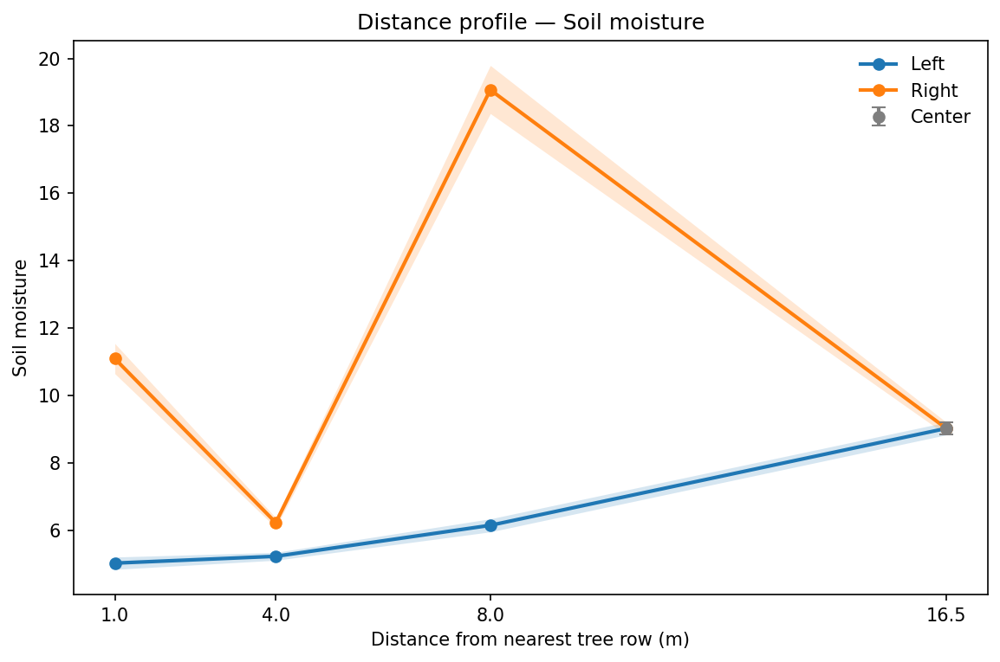

Saved: q2_figs/soil_moisture_profile.png | q2_figs/soil_moisture_profile.pdf


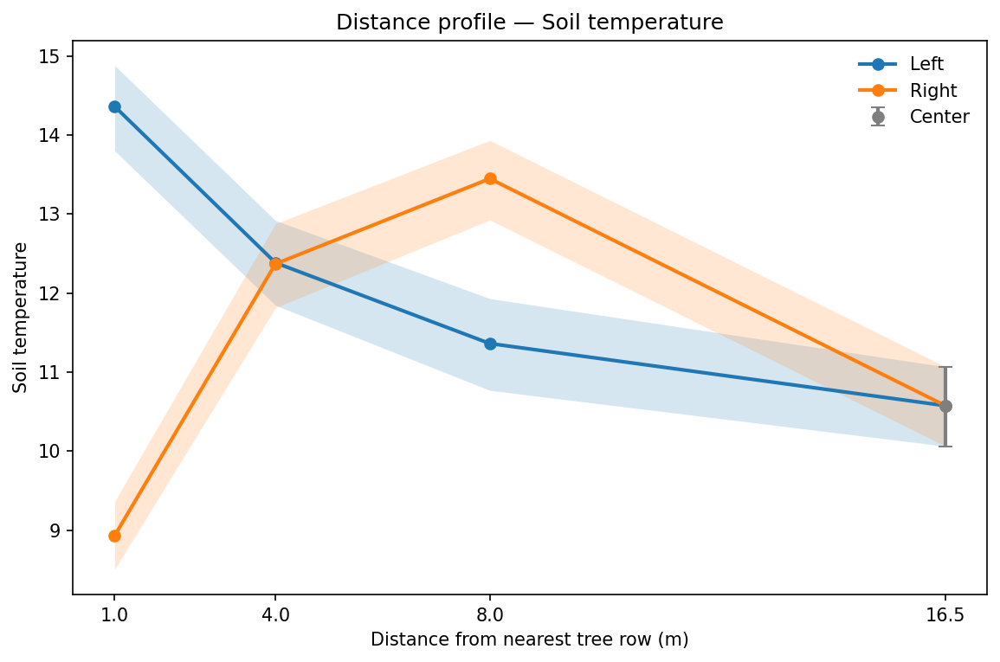

Saved: q2_figs/soil_temperature_profile.png | q2_figs/soil_temperature_profile.pdf


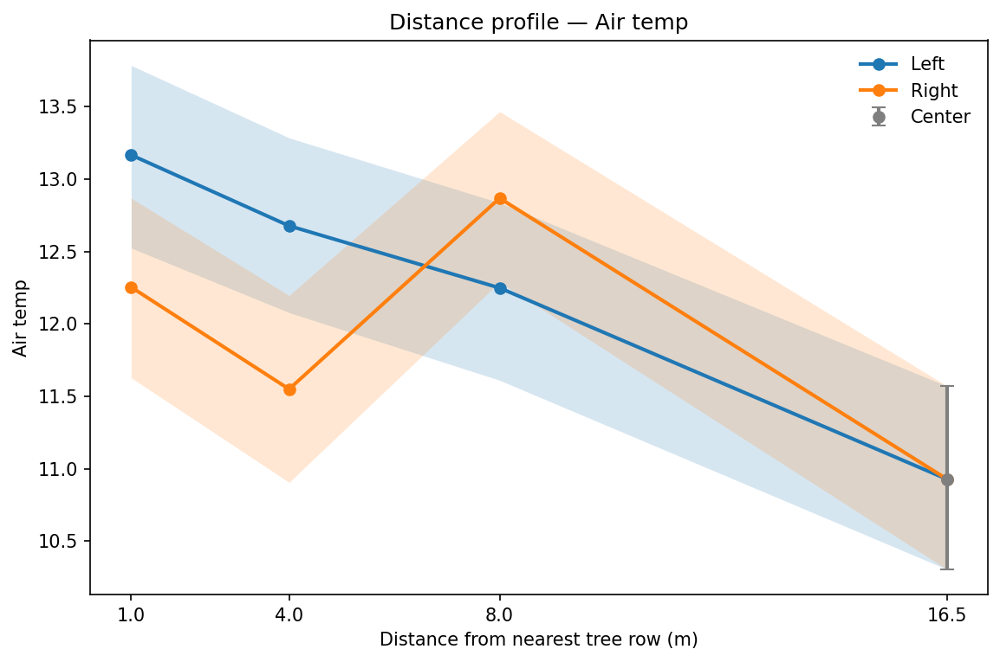

Saved: q2_figs/air_temp_profile.png | q2_figs/air_temp_profile.pdf


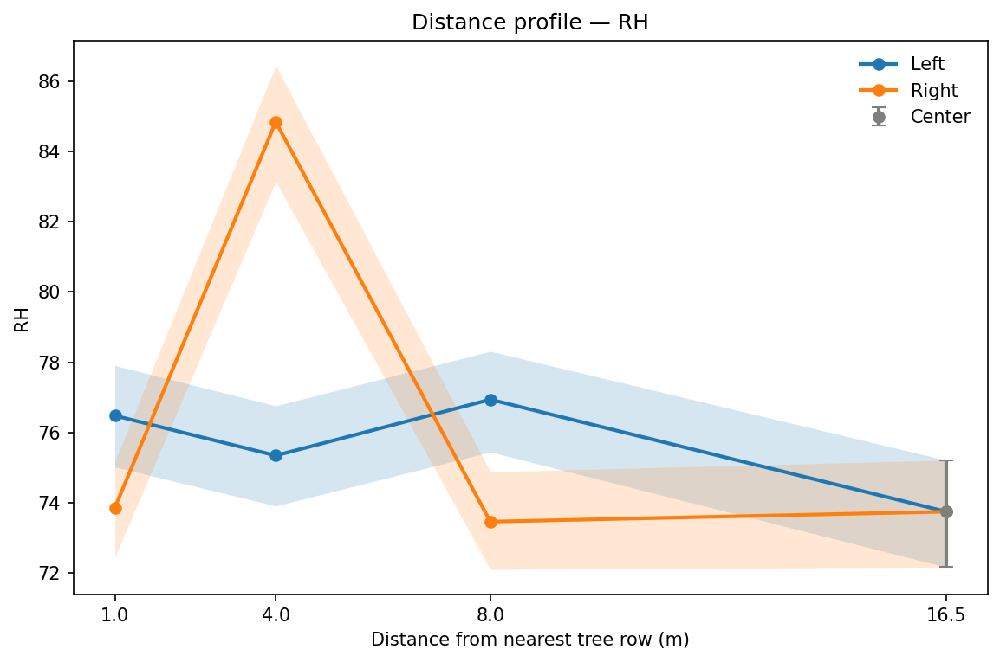

Saved: q2_figs/rh_profile.png | q2_figs/rh_profile.pdf


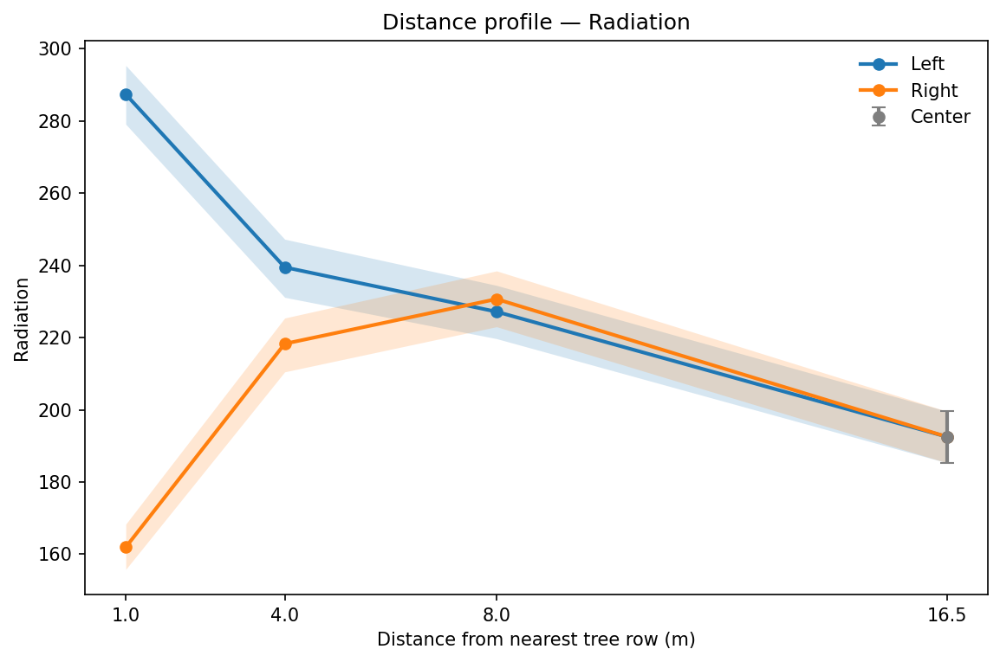

Saved: q2_figs/radiation_profile.png | q2_figs/radiation_profile.pdf


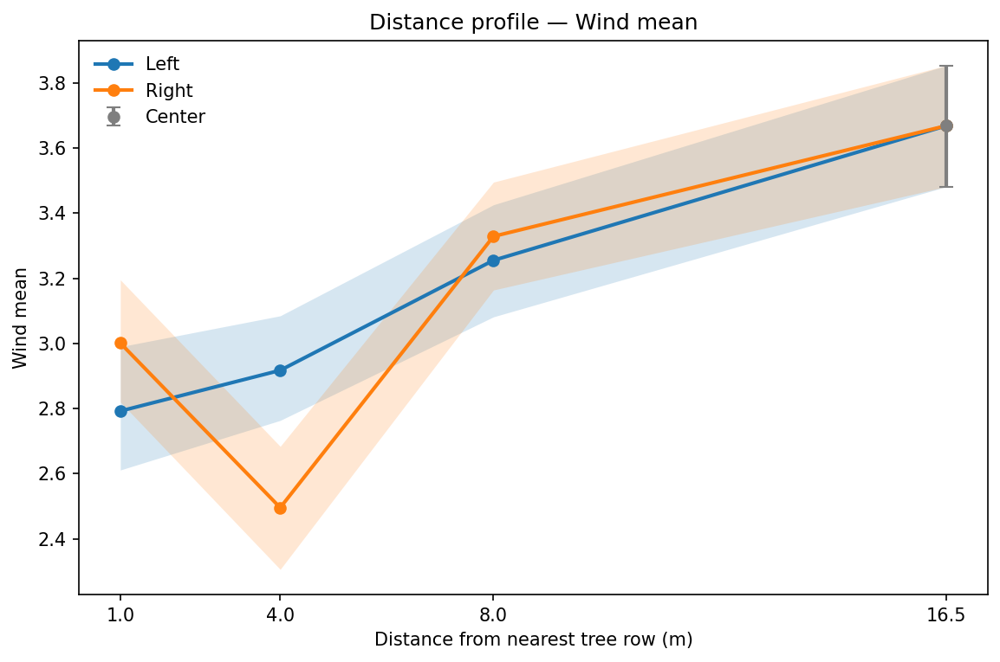

Saved: q2_figs/wind_mean_profile.png | q2_figs/wind_mean_profile.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


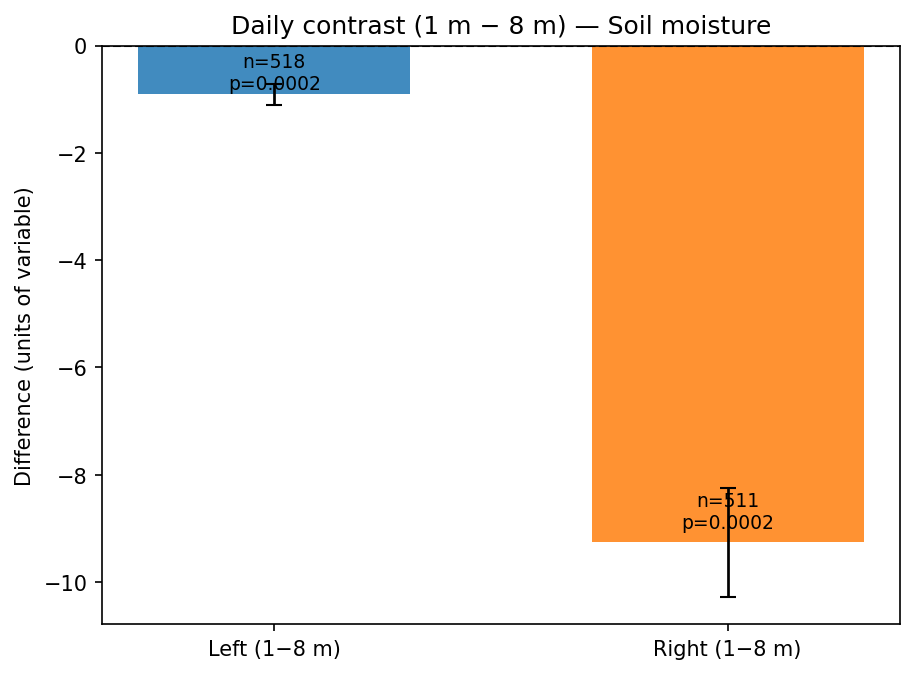

Saved: q2_figs/soil_moisture_contrast_1m_minus_8m.png | q2_figs/soil_moisture_contrast_1m_minus_8m.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


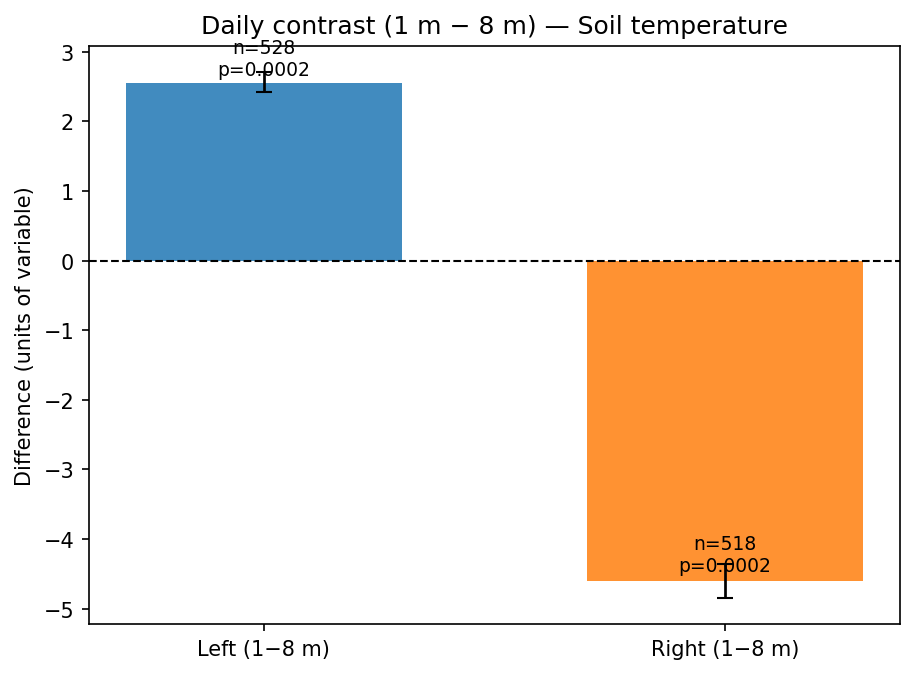

Saved: q2_figs/soil_temperature_contrast_1m_minus_8m.png | q2_figs/soil_temperature_contrast_1m_minus_8m.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


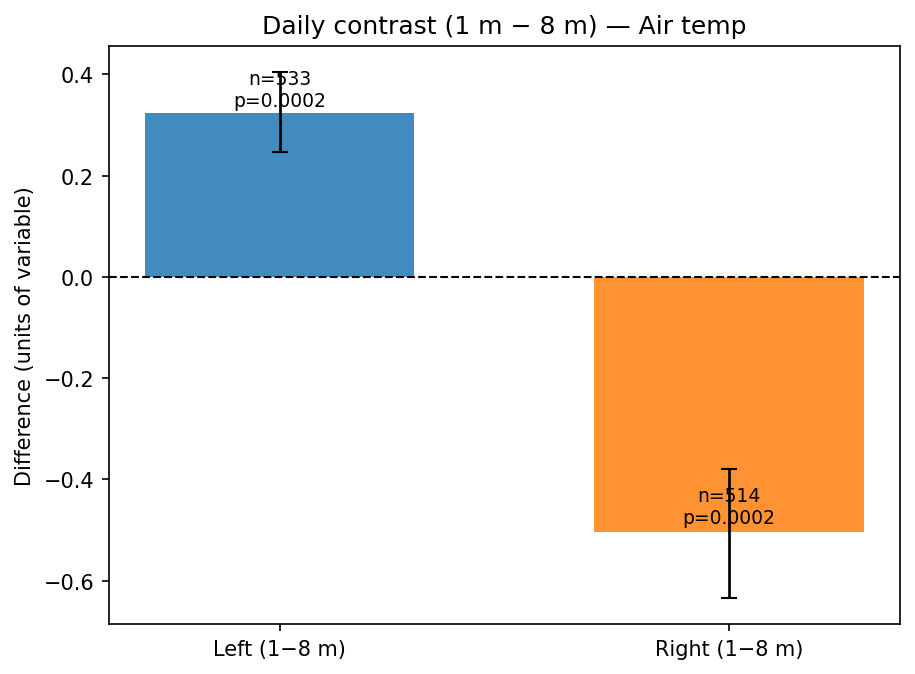

Saved: q2_figs/air_temp_contrast_1m_minus_8m.png | q2_figs/air_temp_contrast_1m_minus_8m.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


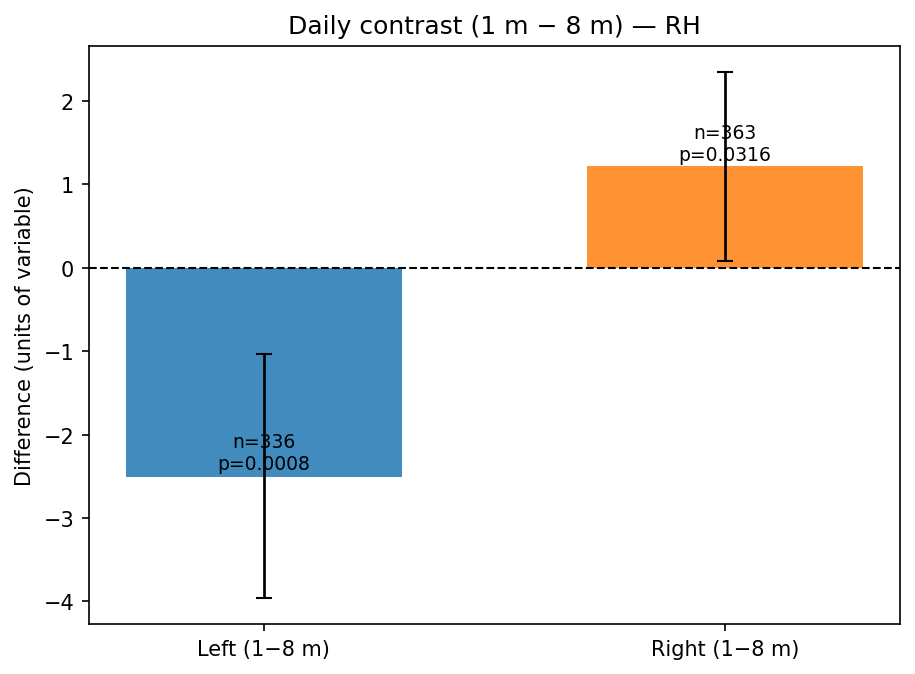

Saved: q2_figs/rh_contrast_1m_minus_8m.png | q2_figs/rh_contrast_1m_minus_8m.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


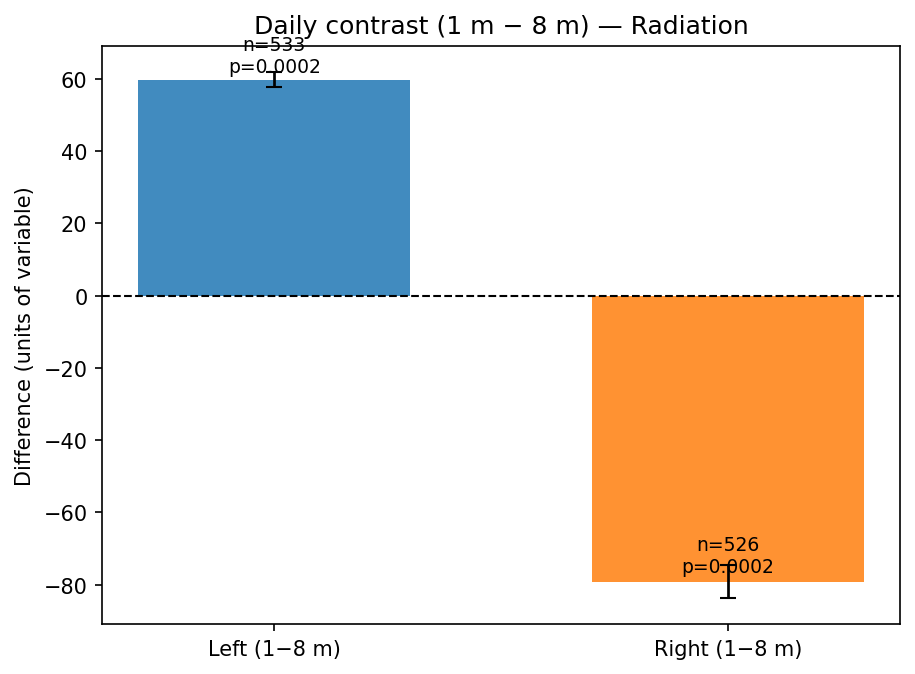

Saved: q2_figs/radiation_contrast_1m_minus_8m.png | q2_figs/radiation_contrast_1m_minus_8m.pdf


/tmp/ipython-input-2628774477.py:183: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
/tmp/ipython-input-2628774477.py:187: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",


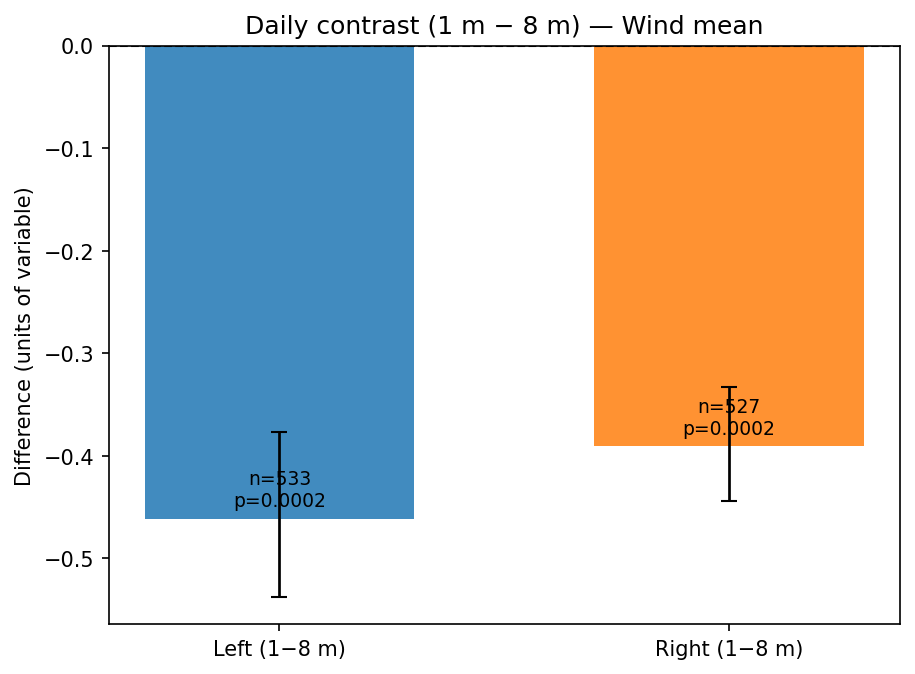

Saved: q2_figs/wind_mean_contrast_1m_minus_8m.png | q2_figs/wind_mean_contrast_1m_minus_8m.pdf


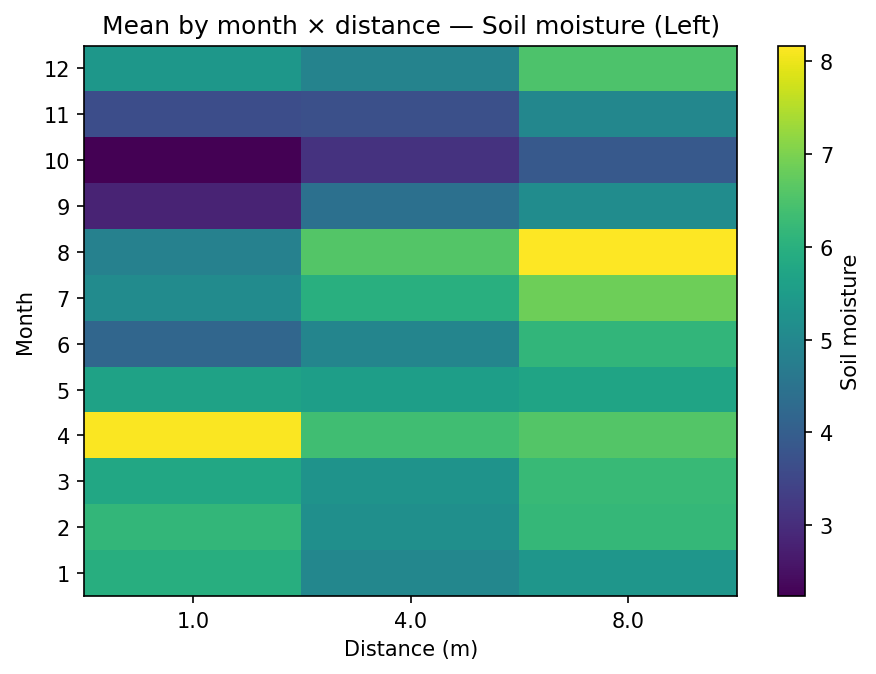

Saved: q2_figs/soil_moisture_heatmap_L.png | q2_figs/soil_moisture_heatmap_L.pdf


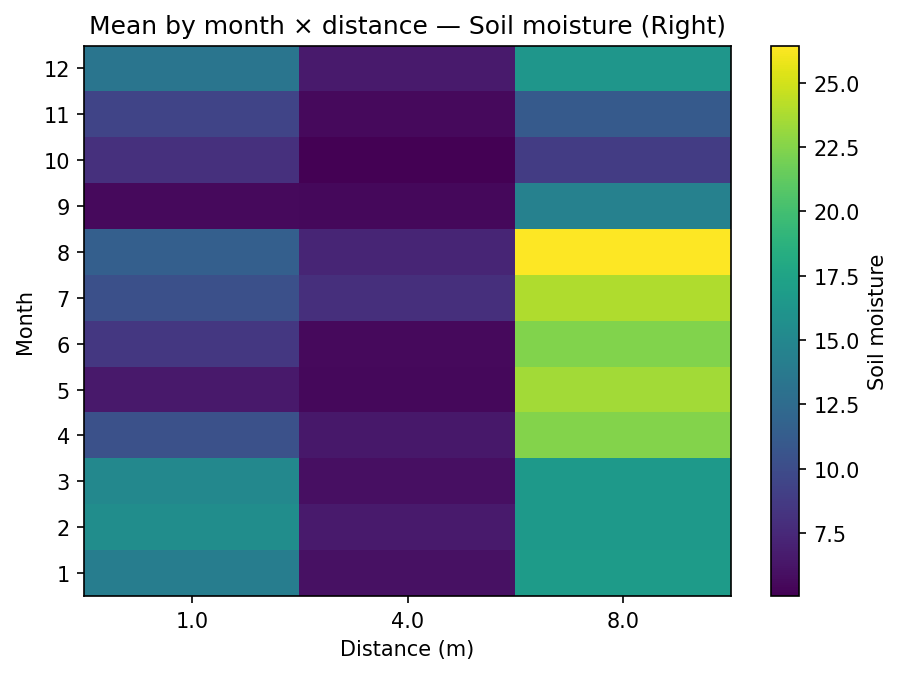

Saved: q2_figs/soil_moisture_heatmap_R.png | q2_figs/soil_moisture_heatmap_R.pdf


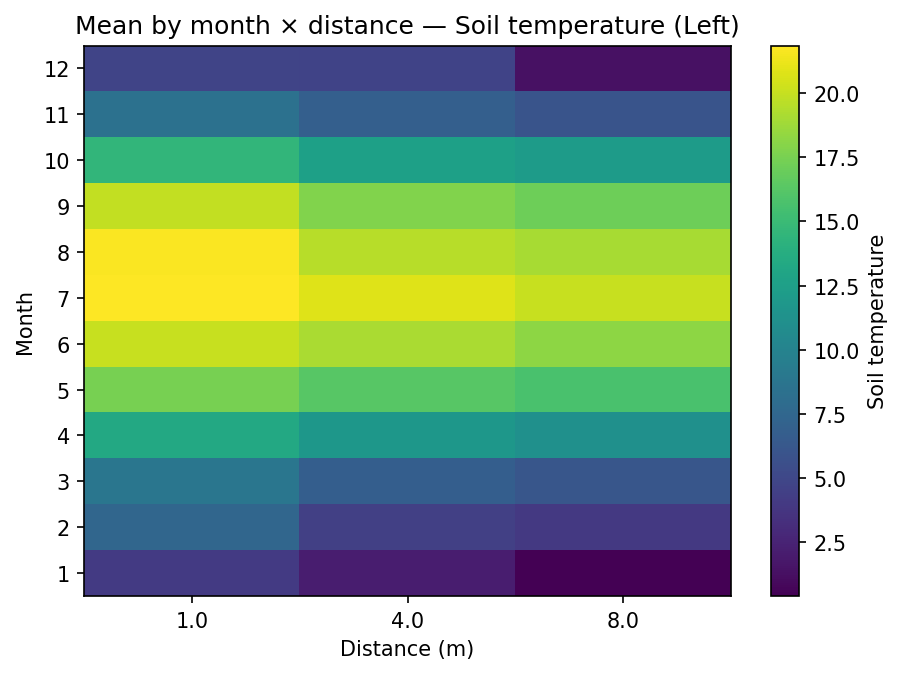

Saved: q2_figs/soil_temperature_heatmap_L.png | q2_figs/soil_temperature_heatmap_L.pdf


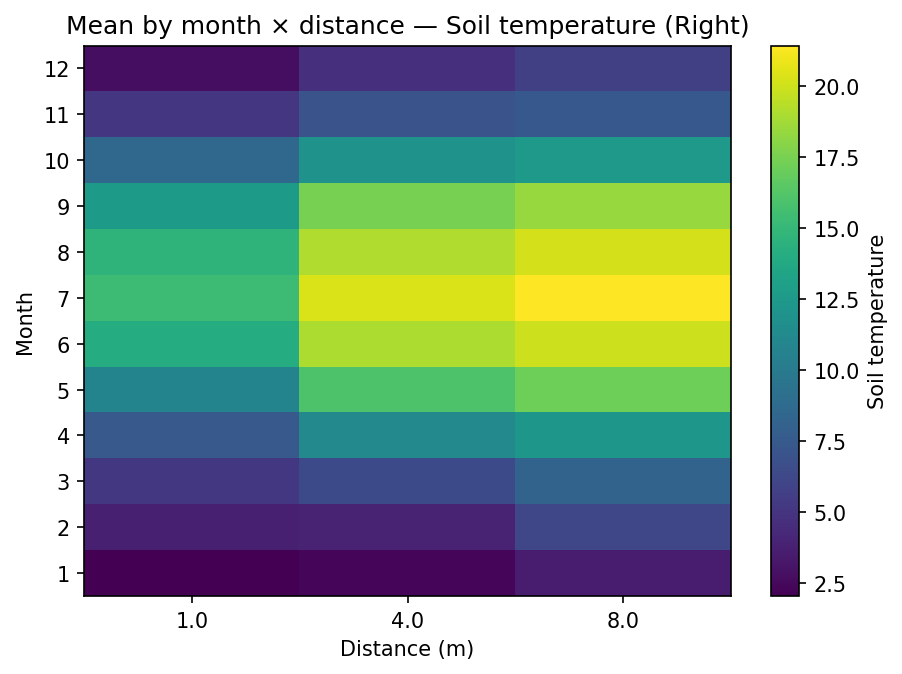

Saved: q2_figs/soil_temperature_heatmap_R.png | q2_figs/soil_temperature_heatmap_R.pdf


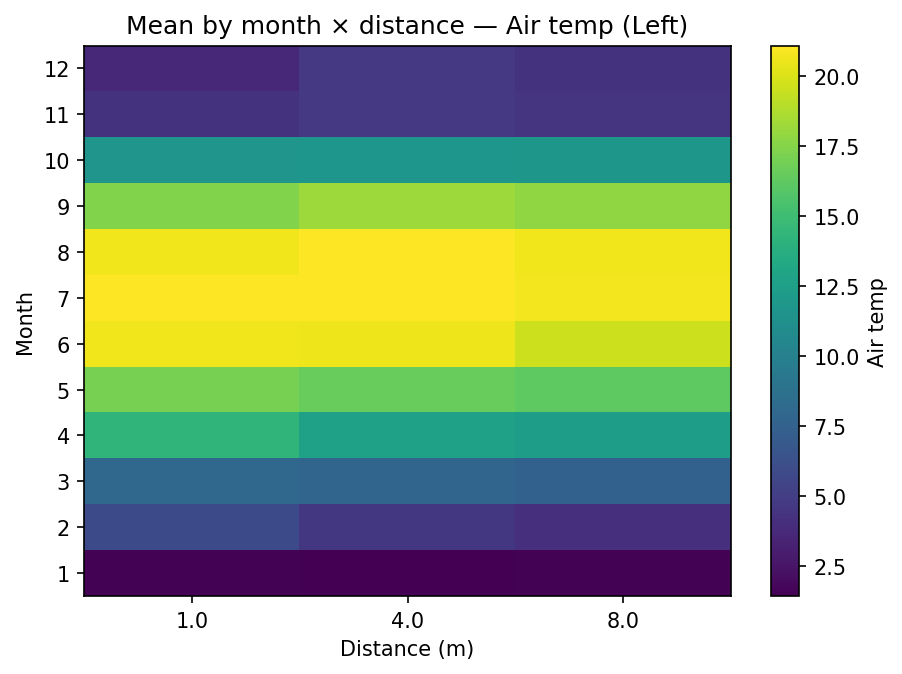

Saved: q2_figs/air_temp_heatmap_L.png | q2_figs/air_temp_heatmap_L.pdf


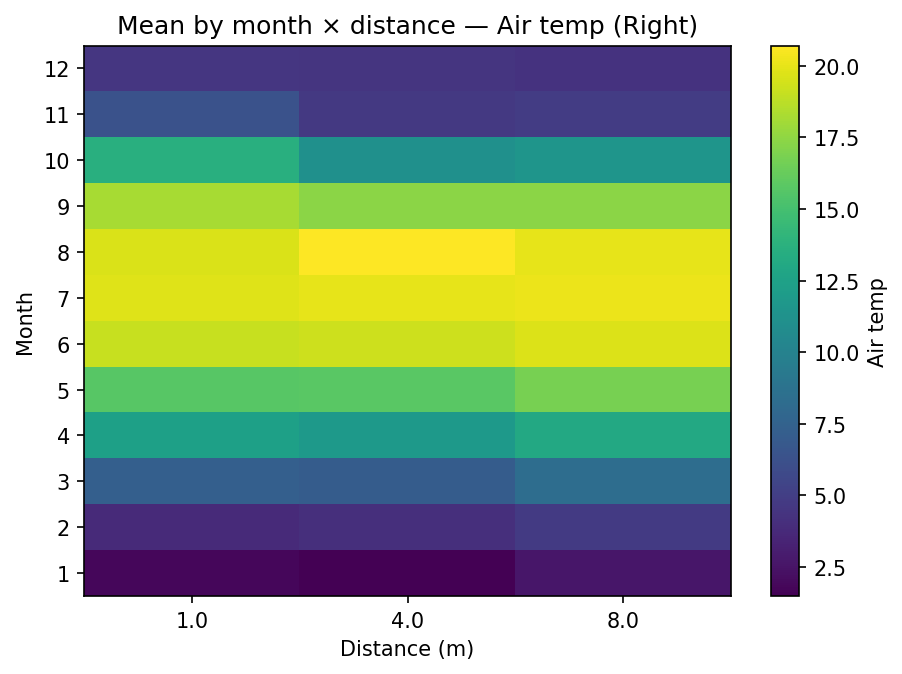

Saved: q2_figs/air_temp_heatmap_R.png | q2_figs/air_temp_heatmap_R.pdf


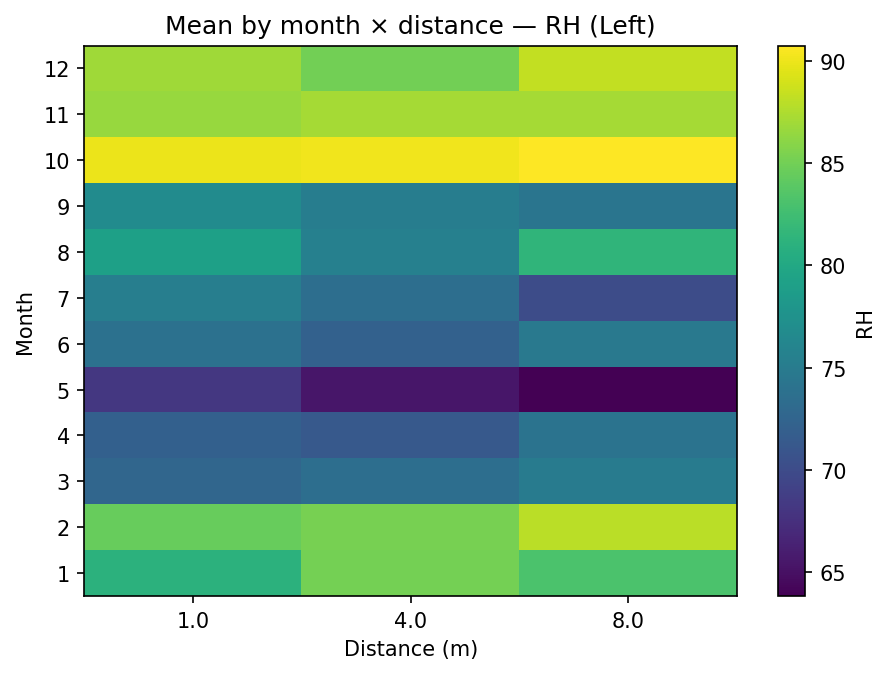

Saved: q2_figs/rh_heatmap_L.png | q2_figs/rh_heatmap_L.pdf


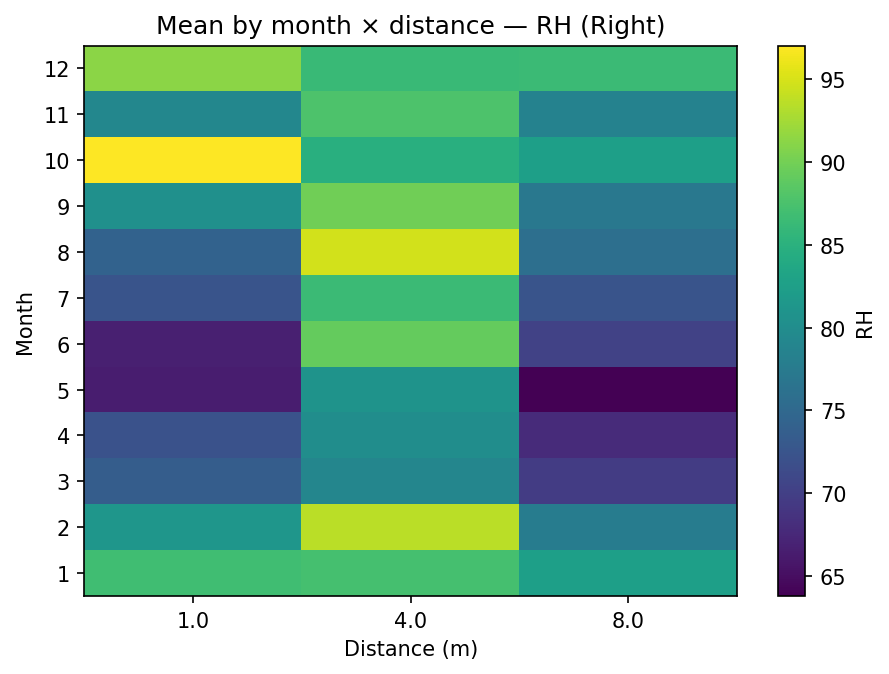

Saved: q2_figs/rh_heatmap_R.png | q2_figs/rh_heatmap_R.pdf


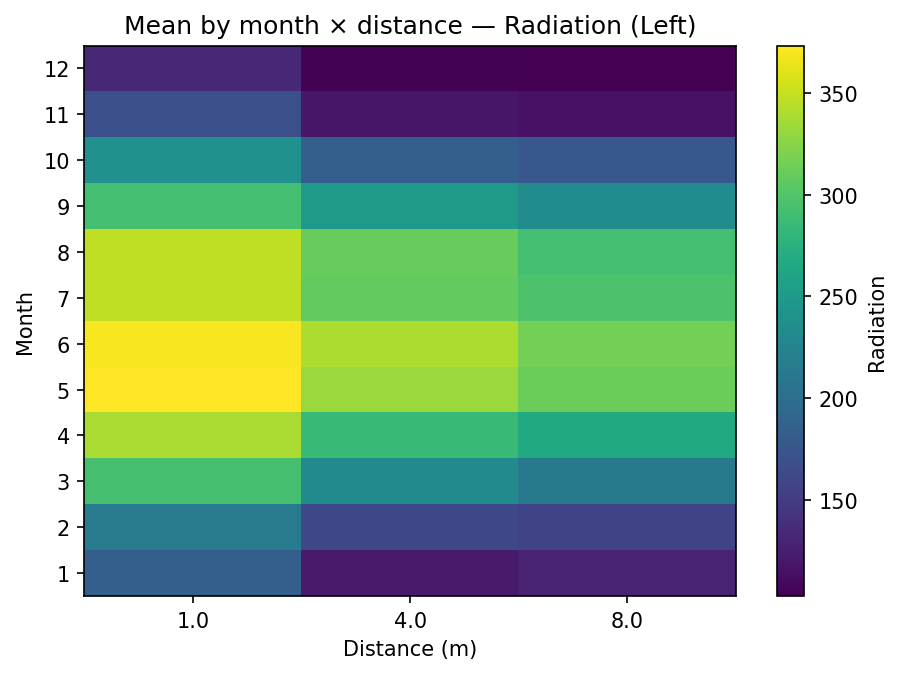

Saved: q2_figs/radiation_heatmap_L.png | q2_figs/radiation_heatmap_L.pdf


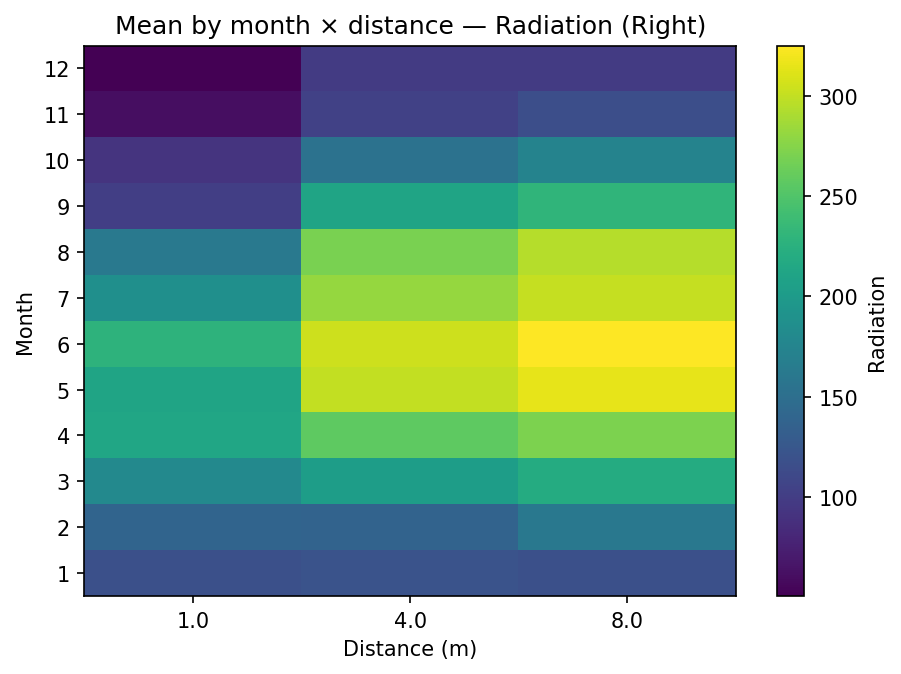

Saved: q2_figs/radiation_heatmap_R.png | q2_figs/radiation_heatmap_R.pdf


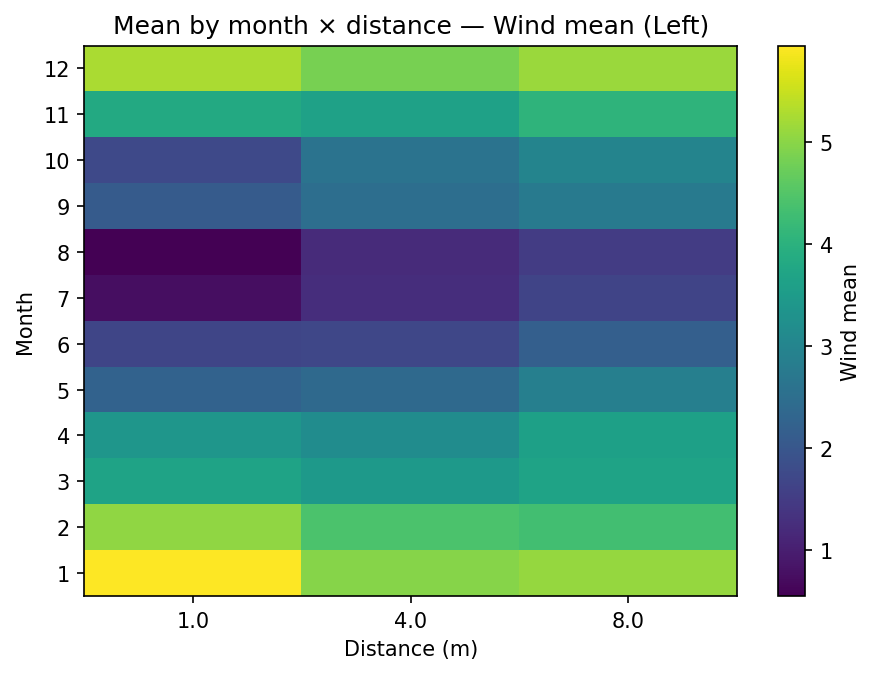

Saved: q2_figs/wind_mean_heatmap_L.png | q2_figs/wind_mean_heatmap_L.pdf


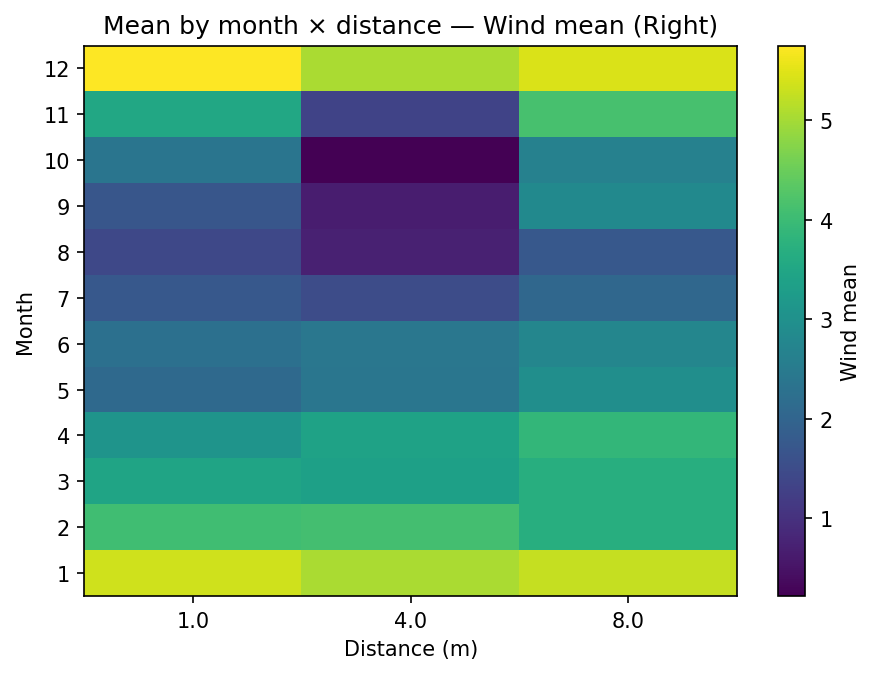

Saved: q2_figs/wind_mean_heatmap_R.png | q2_figs/wind_mean_heatmap_R.pdf


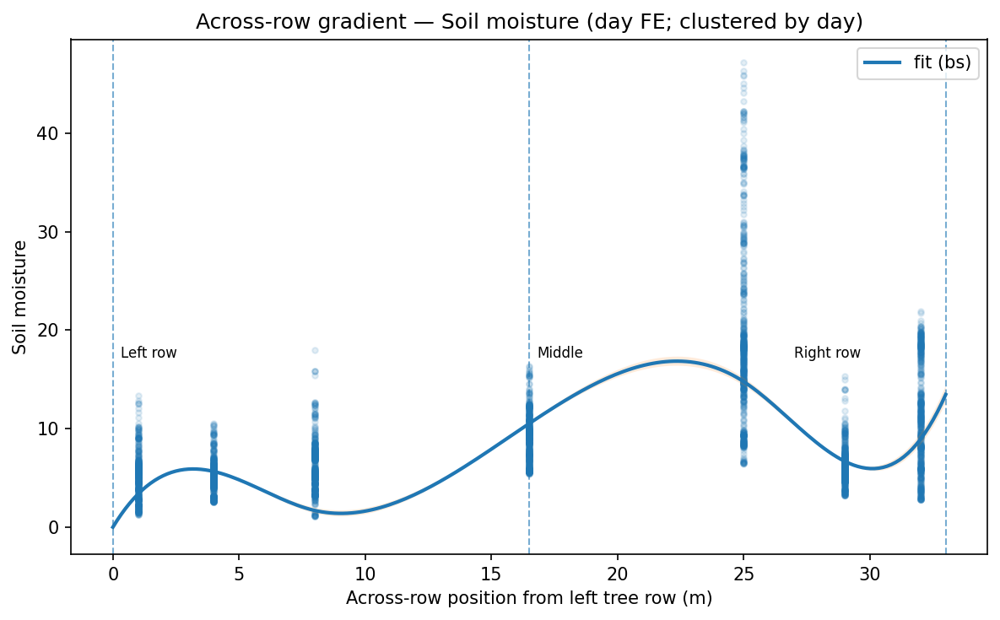

Saved: q2_figs/setup_continuous_soil_moisture_all.png | q2_figs/setup_continuous_soil_moisture_all.pdf


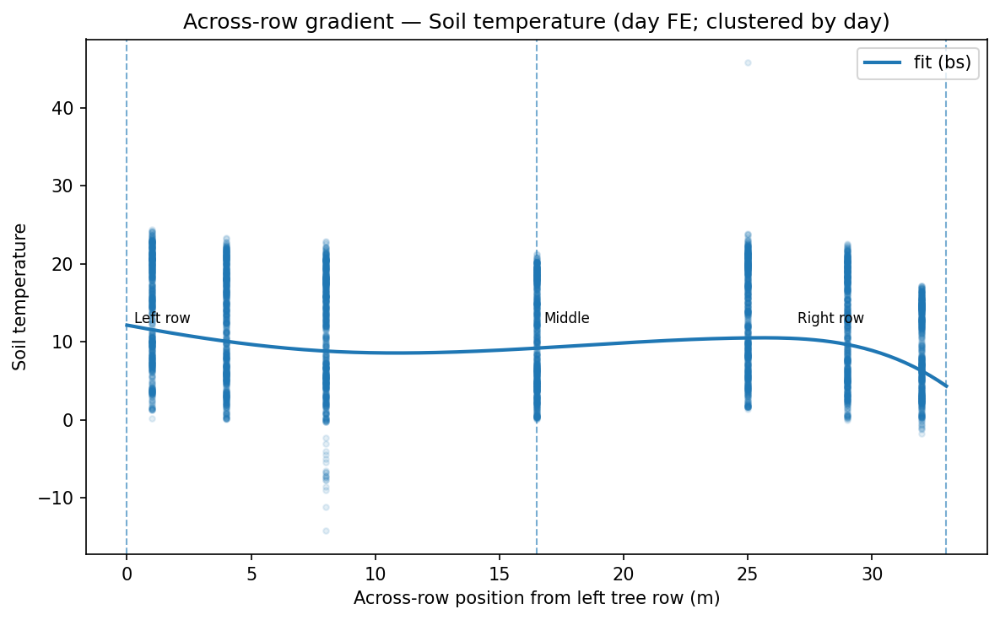

Saved: q2_figs/setup_continuous_soil_temperature_all.png | q2_figs/setup_continuous_soil_temperature_all.pdf


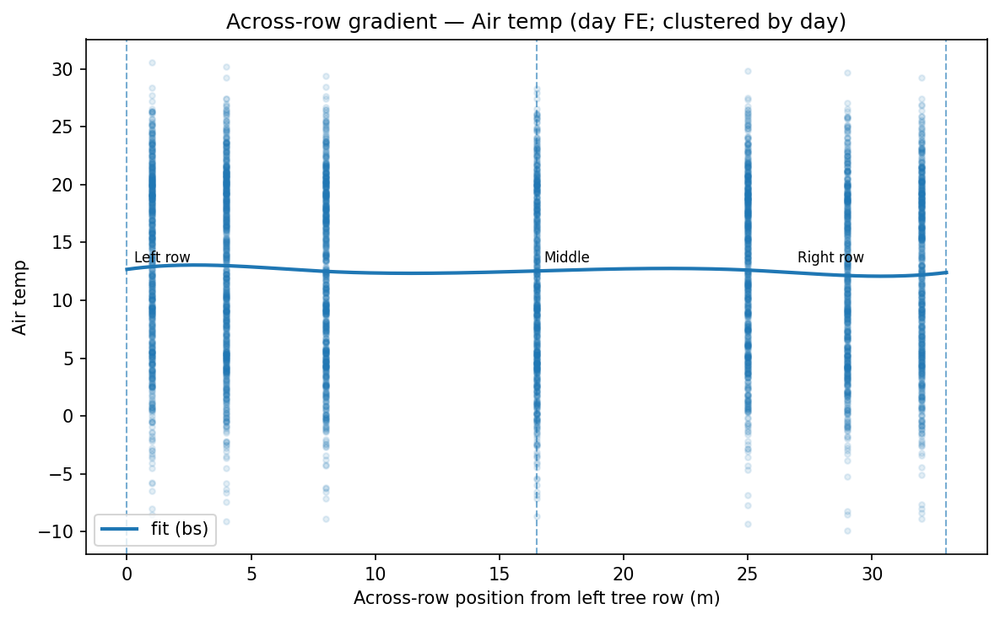

Saved: q2_figs/setup_continuous_air_temp_all.png | q2_figs/setup_continuous_air_temp_all.pdf


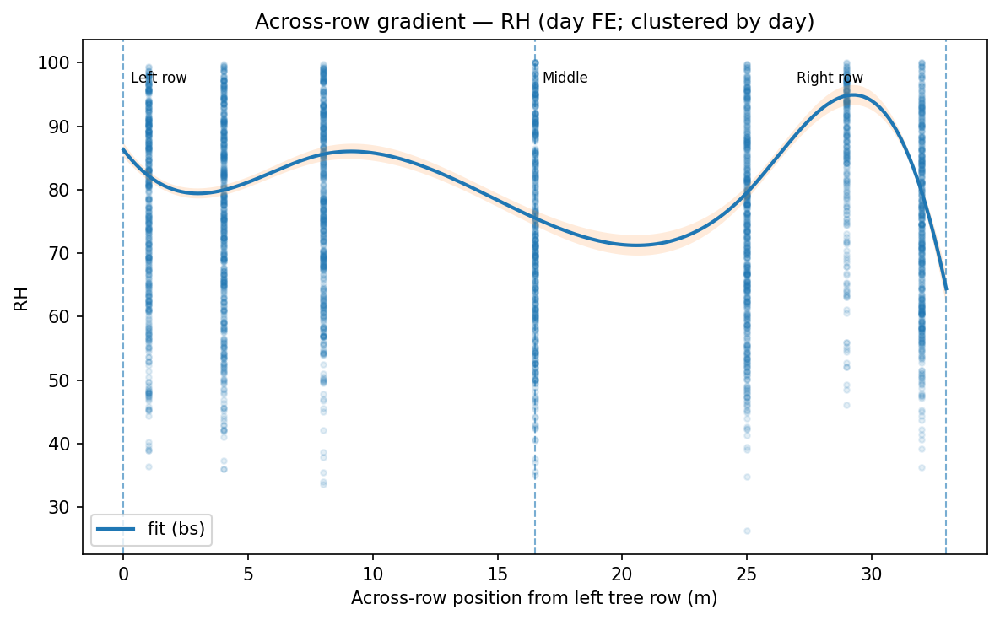

Saved: q2_figs/setup_continuous_rh_all.png | q2_figs/setup_continuous_rh_all.pdf


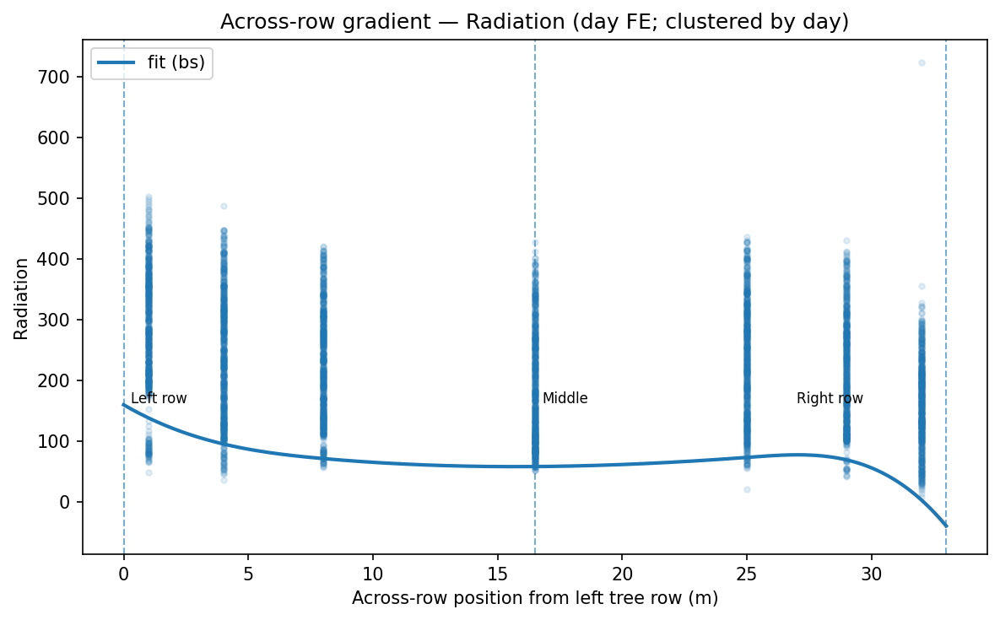

Saved: q2_figs/setup_continuous_radiation_all.png | q2_figs/setup_continuous_radiation_all.pdf


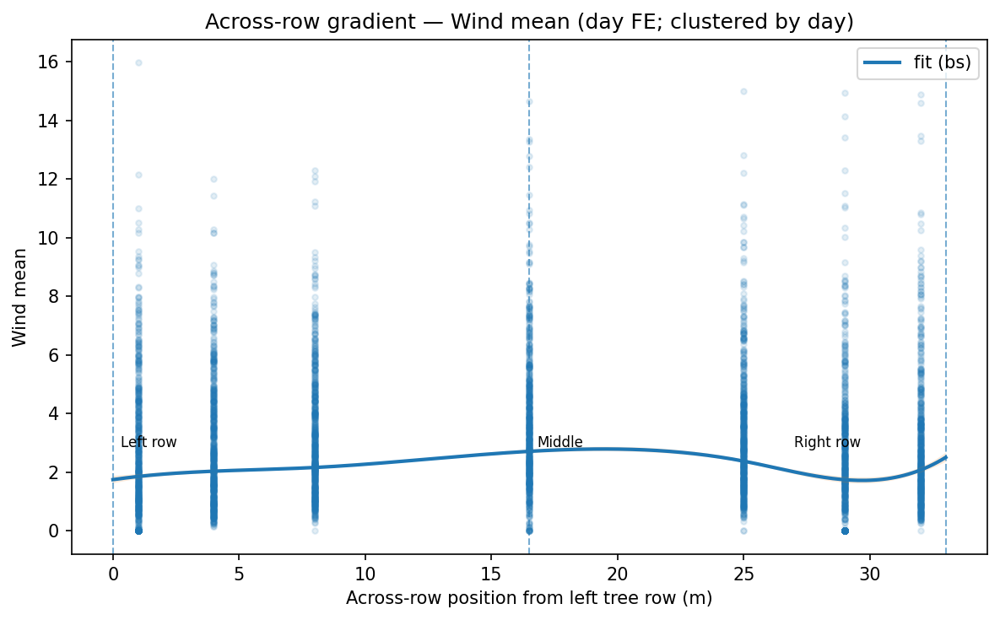

Saved: q2_figs/setup_continuous_wind_mean_all.png | q2_figs/setup_continuous_wind_mean_all.pdf


In [11]:
# === Q2 Presentable gradient plots (Left/Right connect to center 16.5) ===
import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

assert 'daily_node' in globals(), "Build 'daily_node' (per-node daily means) first."

# ---- Ensure side + distances exist on daily_node (robust) ----
dn = daily_node.copy()

# Detect some node column and normalize to 'node_###'
node_col = None
for cand in ['node', 'node_id', 'node_key']:
    if cand in dn.columns:
        node_col = cand; break
assert node_col is not None, "No 'node'/'node_id'/'node_key' column in daily_node."
dn['node'] = dn[node_col].astype(str)
dn['node'] = np.where(dn['node'].str.startswith('node_'), dn['node'], 'node_' + dn['node'])

# Attach distances if missing
if 'distance_m' not in dn.columns or dn['distance_m'].isna().all():
    dist_map = {"node_182":1.0,"node_187":4.0,"node_179":8.0,"node_183":16.5,"node_181":8.0,"node_186":4.0,"node_184":1.0}
    dn['distance_m'] = dn['node'].map(dist_map).astype(float)

# Attach side if missing
if 'side' not in dn.columns or dn['side'].isna().all():
    side_map = {"node_182":"L","node_187":"L","node_179":"L",
                "node_183":"C","node_181":"R","node_186":"R","node_184":"R"}
    dn['side'] = dn['node'].map(side_map).fillna('C')

# Time column to month
dn['_date'] = pd.to_datetime(dn.get('_date', dn.get('timestamp', dn.get('timestamp_iso'))), errors='coerce')
dn['month'] = dn['_date'].dt.month

# ---- Variable detection (prefer composites) ----
def _pick(d, *cands):
    for c in cands:
        if c in d.columns: return c
    return None

VAR_COLS = {
    "Soil moisture":   _pick(dn, "soil_moisture__comp", "ground_humidity__comp",
                             "ground_humidity_0__pref", "ground_humidity_0_clean"),
    "Soil temperature":_pick(dn, "soil_temp__comp", "ground_temp__comp",
                             "ground_temp_0__pref", "ground_temp_0_clean"),
    "Air temp":        _pick(dn, "temperature__pref", "temperature"),
    "RH":              _pick(dn, "humidity__pref", "humidity"),
    "Radiation":       _pick(dn, "global_radiation__pref", "global_radiation_clean", "global_radiation"),
    "Wind mean":       _pick(dn, "wind_speed_mean__pref", "wind_speed_mean_clean", "wind_speed_mean"),
}
VAR_COLS = {k:v for k,v in VAR_COLS.items() if v is not None}
print("Variables found:", VAR_COLS)

# ---- Aesthetics (no green/brown) ----
COLOR_L = "#1f77b4"   # Left = blue
COLOR_R = "#ff7f0e"   # Right = orange
COLOR_C = "#7f7f7f"   # Center = gray
FIGDIR  = "q2_figs"
os.makedirs(FIGDIR, exist_ok=True)

# ---- Helpers ----
def _bootstrap_mean_ci(vals, B=2000, seed=42, q=(2.5, 97.5)):
    v = pd.to_numeric(pd.Series(vals), errors="coerce").to_numpy(dtype=float)
    v = v[np.isfinite(v)]
    if v.size == 0: return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, v.size, size=(B, v.size))
    means = v[idx].mean(axis=1)
    lo, hi = np.percentile(means, list(q))
    return float(v.mean()), float(lo), float(hi)

def _paired_perm_p(diffs, reps=5000, seed=123):
    d = np.asarray(diffs, dtype=float)
    d = d[np.isfinite(d)]
    n = d.size
    if n < 5: return np.nan
    rng = np.random.default_rng(seed)
    T_obs = d.mean()
    signs = rng.choice([-1,1], size=(reps, n))
    T_perm = (d * signs).mean(axis=1)
    p = (np.abs(T_perm) >= abs(T_obs)).mean()
    return (p * reps + 1) / (reps + 1)

def _subset_month(d, month=None):
    if month is None: return d
    return d[d['month'].eq(int(month))].copy()

DIST_ORDER = [1.0, 4.0, 8.0, 16.5]

# ---------------- A) Distance profiles (mean ± CI), lines go 1→4→8→16.5 per side ----------------
def plot_distance_profiles(dsrc, ycol, label, month=None):
    dsub = _subset_month(dsrc, month)[['_date','side','distance_m', ycol]].dropna()
    if dsub.empty:
        print(f"[profiles] Skip {label} m{month}: no data"); return

    # Per-day mean at each (side, distance)
    per_day = (dsub.groupby(["_date", "side", "distance_m"], observed=True)[ycol]
                    .mean().reset_index())

    # Center stats (side == 'C' & distance 16.5); will be appended to both sides
    c = per_day[(per_day['side']=='C') & (per_day['distance_m'].astype(float)==16.5)]
    c_mu = c_lo = c_hi = np.nan
    if len(c):
        c_mu, c_lo, c_hi = _bootstrap_mean_ci(c[ycol])

    # Build side curves and append center point
    agg_rows = []
    for side in ['L','R']:
        g = per_day[(per_day['side']==side)]
        for dist, gg in g.groupby('distance_m', observed=True):
            dist = float(dist)
            if dist not in [1.0, 4.0, 8.0]:  # only the three side distances
                continue
            mu, lo, hi = _bootstrap_mean_ci(gg[ycol])
            agg_rows.append((side, dist, mu, lo, hi))
        # append CENTER (16.5) for continuity if available
        if np.isfinite(c_mu):
            agg_rows.append((side, 16.5, c_mu, c_lo, c_hi))

    agg = pd.DataFrame(agg_rows, columns=['side','distance_m','mean','lo','hi'])
    if agg.empty:
        print(f"[profiles] Skip {label}: distances missing"); return
    agg['distance_m'] = pd.Categorical(agg['distance_m'], categories=DIST_ORDER, ordered=True)
    agg = agg.sort_values(['side','distance_m'])

    # Plot
    plt.figure(figsize=(7.8,5.2))
    for side, color in [('L', COLOR_L), ('R', COLOR_R)]:
        g = agg[agg['side']==side]
        if len(g):
            x = g['distance_m'].astype(float).values
            y = g['mean'].values
            lo = g['lo'].values; hi = g['hi'].values
            plt.plot(x, y, marker='o', lw=2, color=color, label=("Left" if side=='L' else "Right"))
            plt.fill_between(x, lo, hi, alpha=0.18, color=color, linewidth=0)

    # center point marker for clarity (not connected separately)
    if np.isfinite(c_mu):
        plt.errorbar([16.5], [c_mu], yerr=[[c_mu - c_lo], [c_hi - c_mu]],
                     fmt='o', color=COLOR_C, ecolor=COLOR_C, elinewidth=2, capsize=4, label='Center')

    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xticks(DIST_ORDER, [str(d) for d in DIST_ORDER])
    plt.xlabel("Distance from nearest tree row (m)")
    ttl = f"Distance profile — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl)
    plt.ylabel(label)
    plt.legend(frameon=False)
    plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_profile" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIGDIR, base + ".png")
    out_pdf = os.path.join(FIGDIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# ---------------- B) Contrast bars: (1 m − 8 m) per side, mean ± CI + p-value ----------------
def plot_contrast_bars(dsrc, ycol, label, month=None):
    dsub = _subset_month(dsrc, month)[['_date','side','distance_m', ycol]].dropna()
    if dsub.empty:
        print(f"[contrast] Skip {label} m{month}: no data"); return
    per_day = (dsub[dsub['distance_m'].isin([1.0, 8.0])]
                  .groupby(['_date','side','distance_m'], observed=True)[ycol].mean().reset_index())

    rows = []
    for side in ['L','R']:
        g = per_day[per_day['side']==side]
        if g.empty: continue
        pivot = g.pivot(index='_date', columns='distance_m', values=ycol)
        if 1.0 in pivot.columns and 8.0 in pivot.columns:
            diffs = (pd.to_numeric(pivot[1.0], errors='coerce') -
                     pd.to_numeric(pivot[8.0], errors='coerce')).dropna().values
            mu, lo, hi = _bootstrap_mean_ci(diffs)
            p = _paired_perm_p(diffs)
            rows.append((side, len(diffs), mu, lo, hi, p))
    if not rows:
        print(f"[contrast] Skip {label}: missing paired days for 1m & 8m."); return

    tab = pd.DataFrame(rows, columns=['side','n_days','mean','lo','hi','p'])
    plt.figure(figsize=(6.2,4.6))
    for i, side in enumerate(['L','R']):
        r = tab[tab['side']==side]
        if len(r):
            mu, lo, hi = float(r['mean']), float(r['lo']), float(r['hi'])
            color = COLOR_L if side=='L' else COLOR_R
            plt.bar(i, mu, color=color, alpha=0.85, width=0.6)
            plt.errorbar(i, mu, yerr=[[mu-lo],[hi-mu]], ecolor="black", capsize=4, lw=1.3, fmt='none')
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={int(r['n_days'])}\np={float(r['p']):.3g}",
                     ha='center', va='bottom', fontsize=9)

    plt.xticks([0,1], ['Left (1−8 m)', 'Right (1−8 m)'])
    plt.axhline(0, color='k', lw=1, linestyle='--')
    ttl = f"Daily contrast (1 m − 8 m) — {label}"
    if month is not None: ttl += f" (Month {int(month)})"
    plt.title(ttl)
    plt.ylabel("Difference (units of variable)")
    plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_contrast_1m_minus_8m" + (f"_m{int(month):02d}" if month else "")
    out_png = os.path.join(FIGDIR, base + ".png")
    out_pdf = os.path.join(FIGDIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# ---------------- C) Month × distance heatmaps (mean across days), by side ----------------
def plot_month_distance_heatmap(dsrc, ycol, label):
    dsub = dsrc[['_date','month','side','distance_m', ycol]].dropna()
    if dsub.empty:
        print(f"[heatmap] Skip {label}: no data"); return

    for side, color in [('L', COLOR_L), ('R', COLOR_R)]:
        g = dsub[dsub['side']==side]
        if g.empty:
            continue
        # node-equal daily -> monthly means
        per_day = g.groupby(['_date','distance_m'], observed=True)[ycol].mean().reset_index()
        M = per_day.assign(month=lambda x: x['_date'].dt.month) \
                   .groupby(['month','distance_m'], observed=True)[ycol].mean().reset_index()
        piv = M.pivot(index='month', columns='distance_m', values=ycol)
        cols = [d for d in DIST_ORDER if d in piv.columns]
        piv = piv.reindex(columns=cols)

        plt.figure(figsize=(6.2,4.6))
        im = plt.imshow(piv.values, aspect='auto', origin='lower')
        plt.xticks(np.arange(len(cols)), [str(c) for c in cols])
        plt.yticks(np.arange(1,13)-1, [str(m) for m in range(1,13)])
        plt.ylabel("Month"); plt.xlabel("Distance (m)")
        plt.title(f"Mean by month × distance — {label} ({'Left' if side=='L' else 'Right'})")
        cbar = plt.colorbar(im); cbar.ax.set_ylabel(label)
        plt.tight_layout()
        base = f"{label.replace(' ','_').lower()}_heatmap_{'L' if side=='L' else 'R'}"
        out_png = os.path.join(FIGDIR, base + ".png")
        out_pdf = os.path.join(FIGDIR, base + ".pdf")
        plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
        print("Saved:", out_png, "|", out_pdf)

# ---------------- D) Across-row curve (Left→Center→Right, smooth) ----------------
from statsmodels.formula.api import ols
from patsy import bs  # Colab has bs(); we fall back to cubic poly if bs fails

ROW_SPACING_M = 33.0  # adjust if needed

def plot_acrossrow_curve(dsrc, ycol, label, month=None):
    d0 = dsrc.copy()
    # across-row position: from left tree row (0) to right (ROW_SPACING_M)
    d0['across_pos'] = np.where(d0['side'].eq('L'), d0['distance_m'],
                          np.where(d0['side'].eq('R'), ROW_SPACING_M - d0['distance_m'], ROW_SPACING_M/2.0))
    d0['across_pos'] = pd.to_numeric(d0['across_pos'], errors='coerce').clip(0, ROW_SPACING_M)

    if month is not None:
        d0 = d0[d0['month'].eq(int(month))].copy()

    dsub = d0[['across_pos','_date', ycol]].dropna()
    if len(dsub) < 50:
        print(f"[across] Skip {label} m{month}: too few points"); return

    # Day FE via dummy day_str
    dsub['day_str'] = pd.to_datetime(dsub['_date']).dt.floor('D').dt.strftime('%Y-%m-%d')

    # Try B-spline with bounds; else cubic polynomial
    xgrid = np.linspace(0.0, ROW_SPACING_M, 200)
    base = dsub[['day_str']].head(1).copy()
    Xnew = pd.DataFrame({'across_pos': xgrid, 'day_str': [base.iloc[0]['day_str']]*len(xgrid)})

    yhat = lo = hi = None
    try:
        fit = ols(
            f"{ycol} ~ bs(across_pos, df=5, degree=3, include_intercept=False, lower_bound=0, upper_bound={ROW_SPACING_M}) + C(day_str)",
            data=dsub
        ).fit(cov_type='cluster', cov_kwds={'groups': dsub['day_str']})
        sf = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = sf['mean'].values, sf['mean_ci_lower'].values, sf['mean_ci_upper'].values
        method = "bs"
    except Exception:
        fit = ols(f"{ycol} ~ I(across_pos) + I(across_pos**2) + I(across_pos**3) + C(day_str)", data=dsub) \
              .fit(cov_type='cluster', cov_kwds={'groups': dsub['day_str']})
        sf = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = sf['mean'].values, sf['mean_ci_lower'].values, sf['mean_ci_upper'].values
        method = "poly"

    # Plot
    plt.figure(figsize=(8,5))
    samp = dsub if len(dsub) <= 8000 else dsub.sample(8000, random_state=42)
    plt.scatter(samp['across_pos'], samp[ycol], s=10, alpha=0.12)
    plt.plot(xgrid, yhat, lw=2, label=f"fit ({method})")
    plt.fill_between(xgrid, lo, hi, alpha=0.15, linewidth=0)

    # Geometry landmarks
    for x, st in [(0,"Left row"), (ROW_SPACING_M/2,"Middle"), (ROW_SPACING_M,"Right row")]:
        plt.axvline(x, linestyle='--', linewidth=1, alpha=0.6)
        plt.text(x + (0.3 if x==0 else -6 if x==ROW_SPACING_M else 0.3),
                 np.nanmax(yhat) + 0.02*(abs(np.nanmax(yhat))+1e-9),
                 st, fontsize=8)

    plt.xlabel("Across-row position from left tree row (m)")
    plt.ylabel(label)
    ttl = f"Across-row gradient — {label} (day FE; clustered by day)"
    if month is not None: ttl += f" — Month {int(month)}"
    plt.title(ttl)
    plt.legend()
    plt.tight_layout()
    tag = f"_m{int(month):02d}" if month is not None else "_all"
    base = f"setup_continuous_{label.replace(' ','_').lower()}{tag}"
    out_png = os.path.join(FIGDIR, base + ".png")
    out_pdf = os.path.join(FIGDIR, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# ================= Run: profiles, contrasts, heatmaps, across-row curves =================
for label, col in VAR_COLS.items():
    plot_distance_profiles(dn, col, label, month=None)

for label, col in VAR_COLS.items():
    plot_contrast_bars(dn, col, label, month=None)

for label, col in VAR_COLS.items():
    plot_month_distance_heatmap(dn, col, label)

for label, col in VAR_COLS.items():
    plot_acrossrow_curve(dn, col, label, month=None)


Variables found: {'Soil moisture': 'soil_moisture__comp', 'Soil temperature': 'soil_temp__comp', 'Air temp': 'temperature__pref', 'RH': 'humidity__pref', 'Radiation': 'global_radiation__pref', 'Wind mean': 'wind_speed_mean__pref'}
[season] snapped 2 → 1


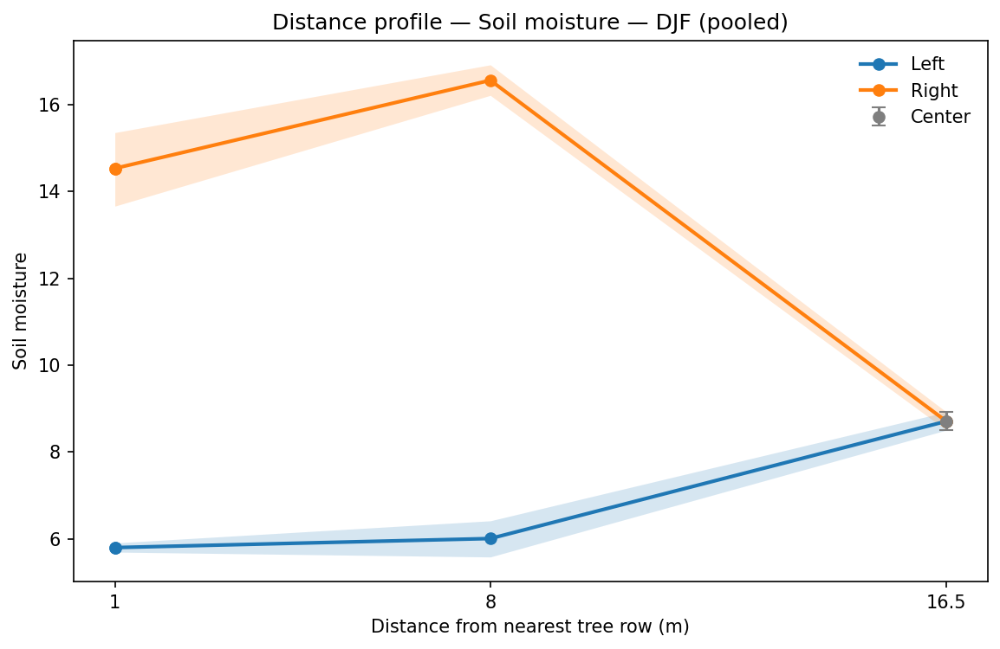

Saved: q2_figs/season/soil_moisture_profile_season_DJF_pooled.png | q2_figs/season/soil_moisture_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


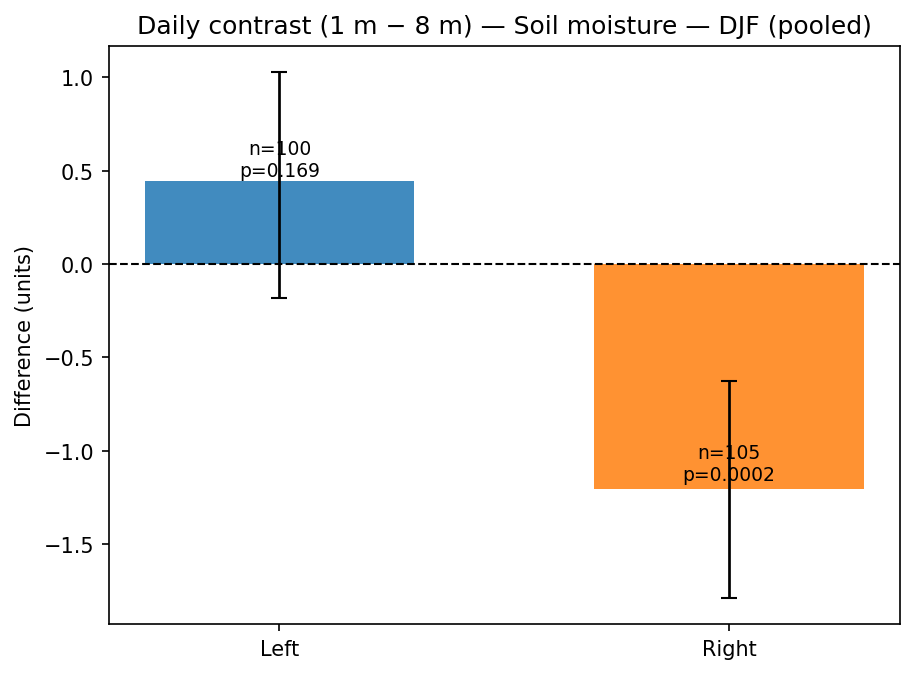

Saved: q2_figs/season/soil_moisture_contrast_season_DJF_pooled.png | q2_figs/season/soil_moisture_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


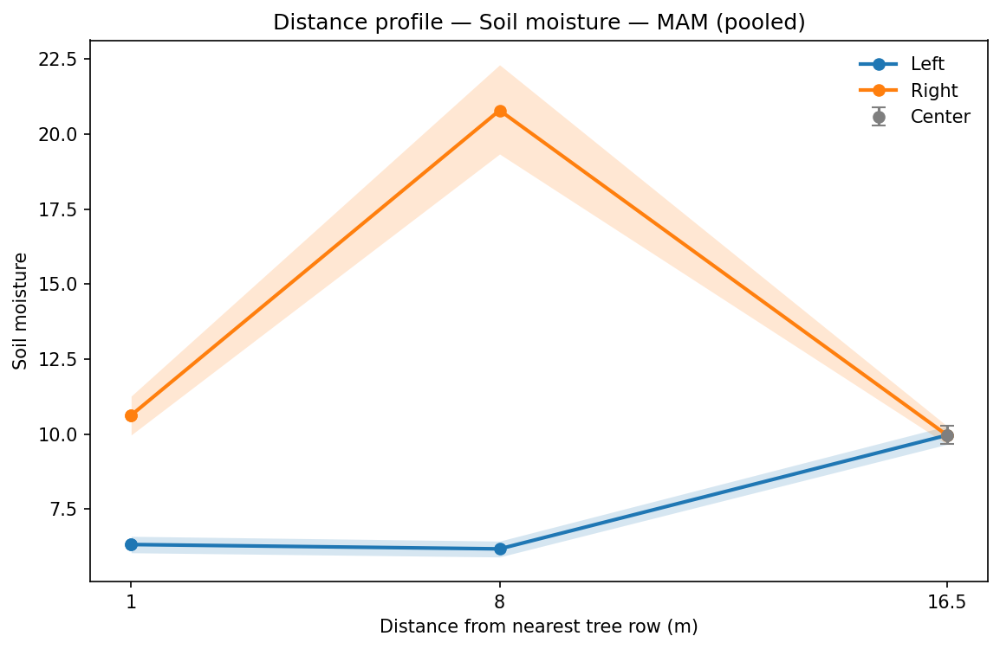

Saved: q2_figs/season/soil_moisture_profile_season_MAM_pooled.png | q2_figs/season/soil_moisture_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


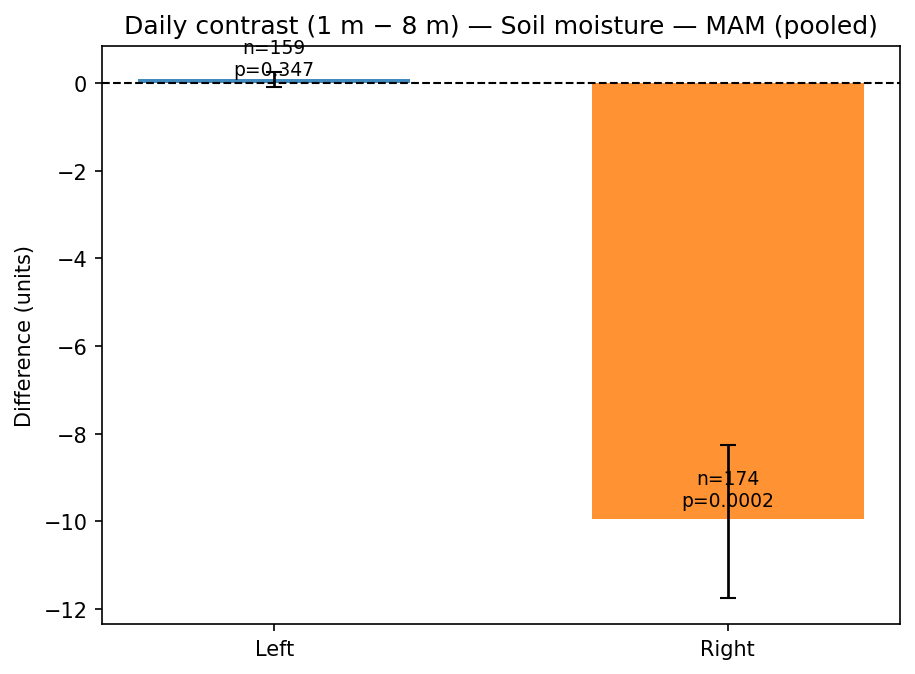

Saved: q2_figs/season/soil_moisture_contrast_season_MAM_pooled.png | q2_figs/season/soil_moisture_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


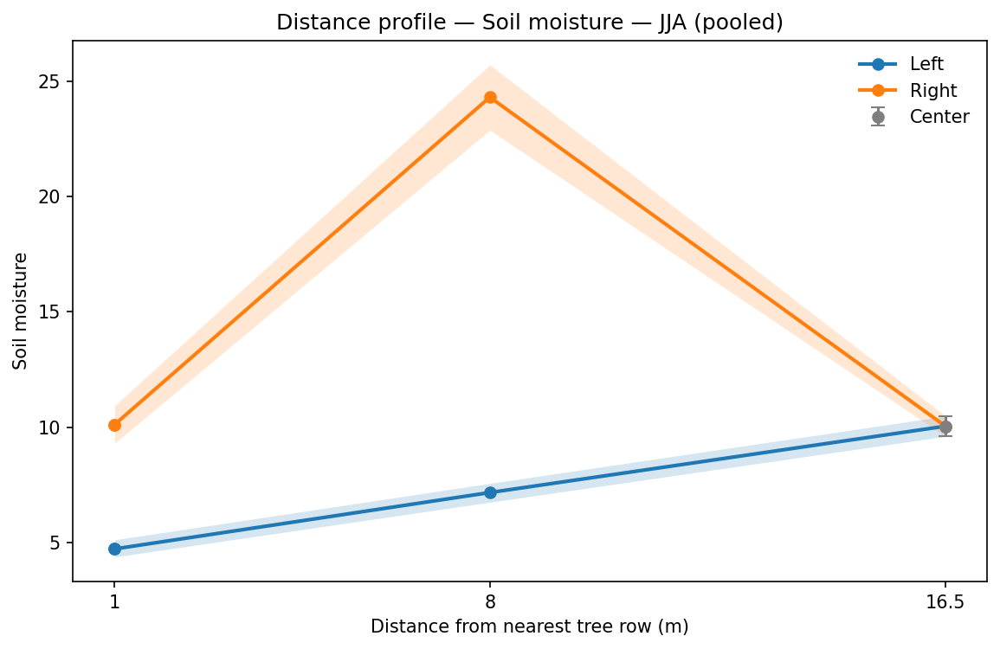

Saved: q2_figs/season/soil_moisture_profile_season_JJA_pooled.png | q2_figs/season/soil_moisture_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


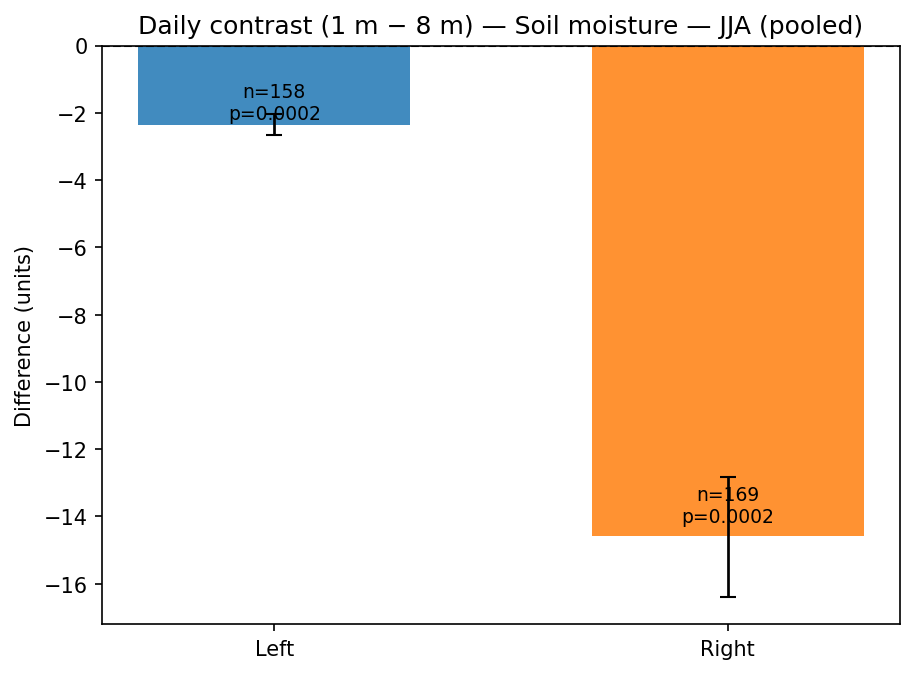

Saved: q2_figs/season/soil_moisture_contrast_season_JJA_pooled.png | q2_figs/season/soil_moisture_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


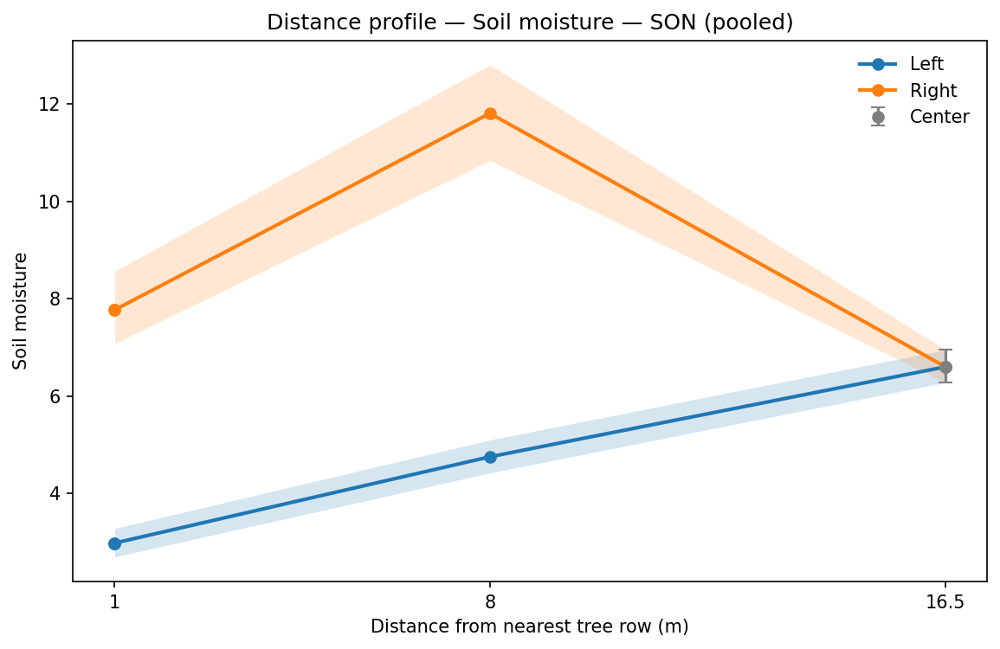

Saved: q2_figs/season/soil_moisture_profile_season_SON_pooled.png | q2_figs/season/soil_moisture_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


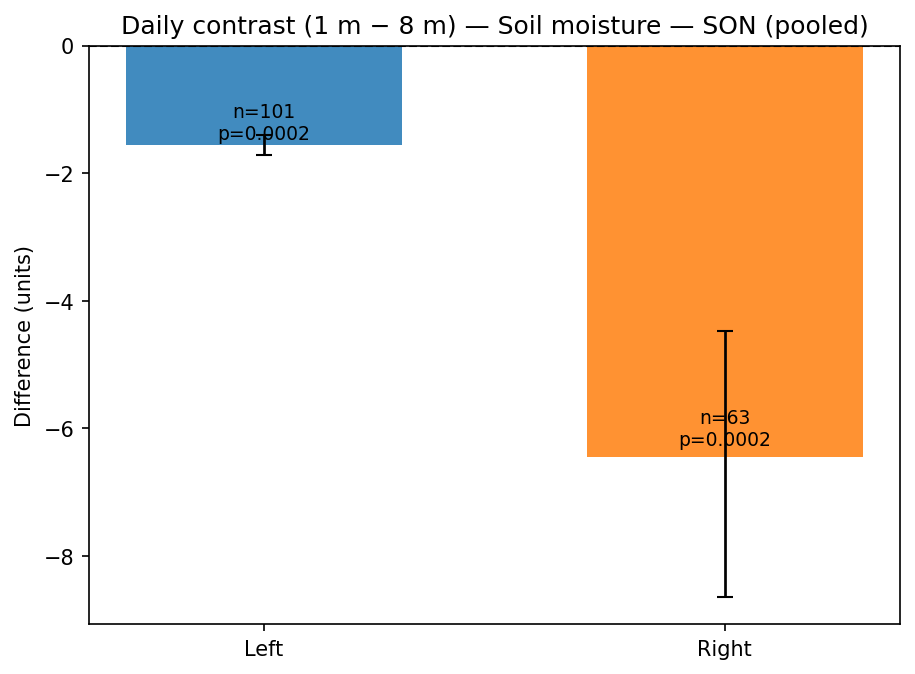

Saved: q2_figs/season/soil_moisture_contrast_season_SON_pooled.png | q2_figs/season/soil_moisture_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


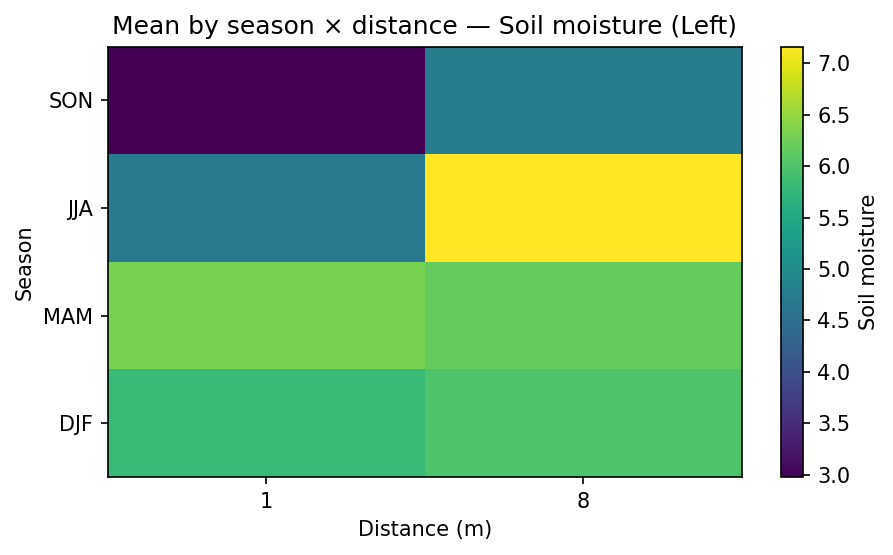

Saved: q2_figs/season/soil_moisture_heatmap_season_L.png | q2_figs/season/soil_moisture_heatmap_season_L.pdf


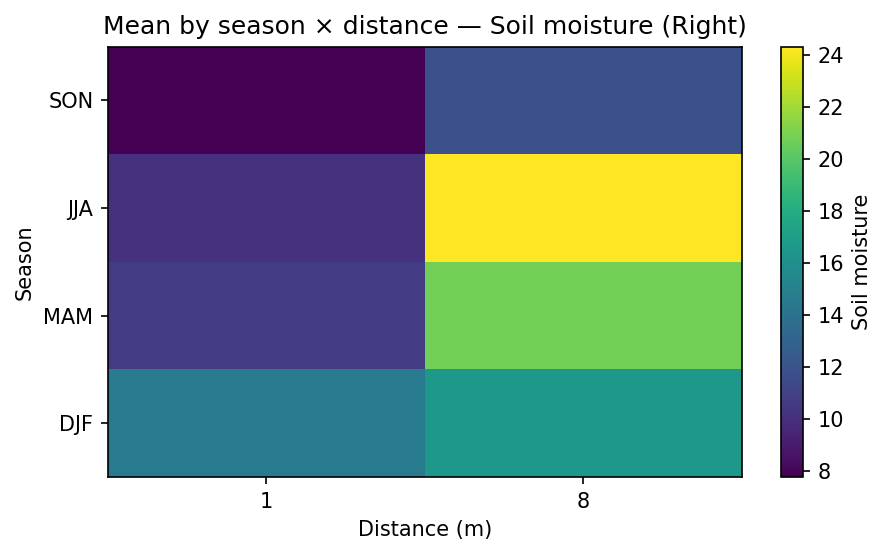

Saved: q2_figs/season/soil_moisture_heatmap_season_R.png | q2_figs/season/soil_moisture_heatmap_season_R.pdf


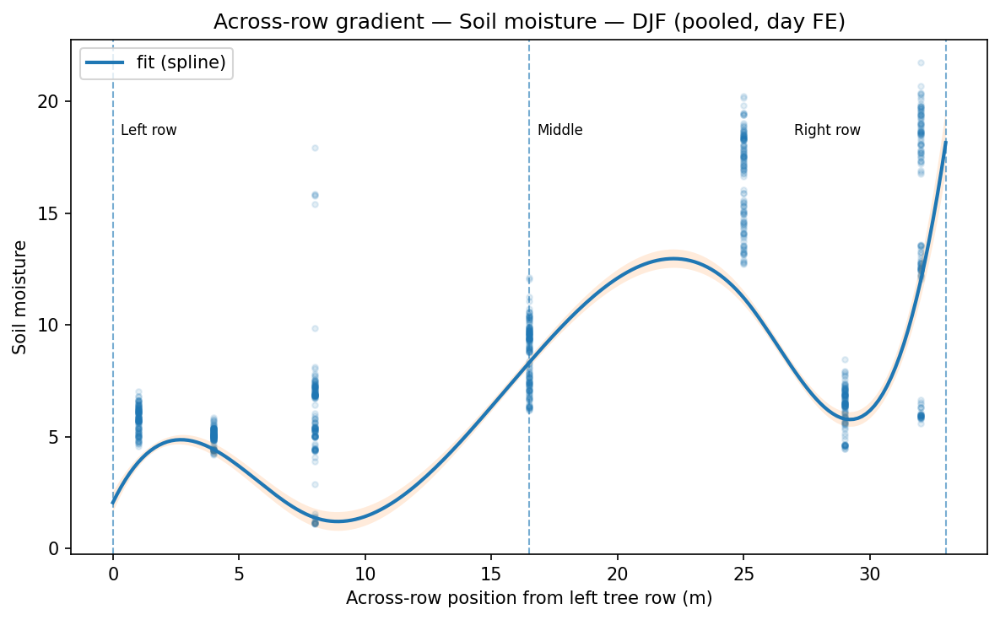

Saved: q2_figs/season/setup_continuous_soil_moisture_season_DJF.png | q2_figs/season/setup_continuous_soil_moisture_season_DJF.pdf


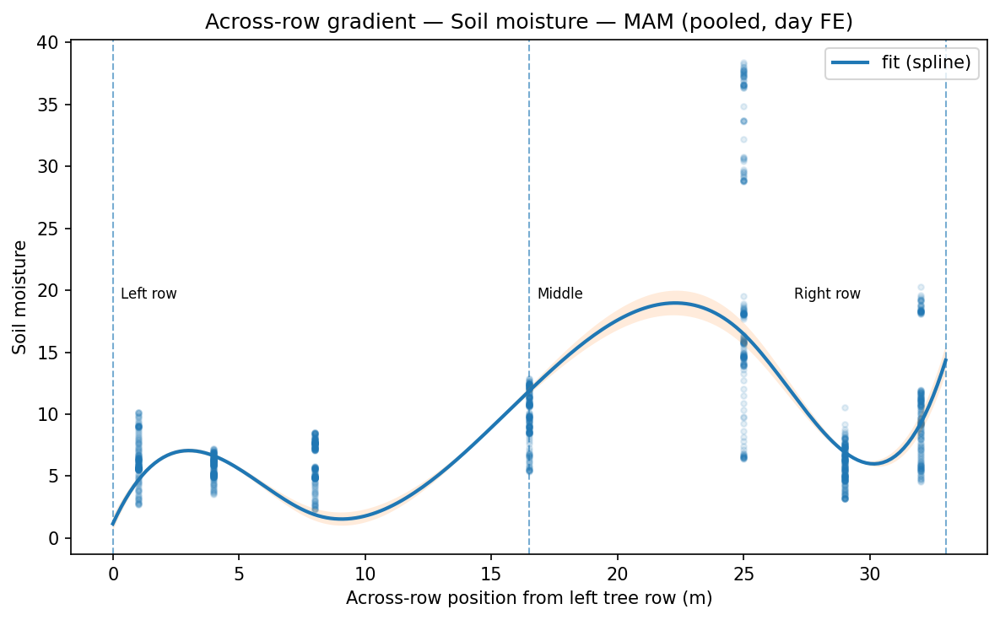

Saved: q2_figs/season/setup_continuous_soil_moisture_season_MAM.png | q2_figs/season/setup_continuous_soil_moisture_season_MAM.pdf


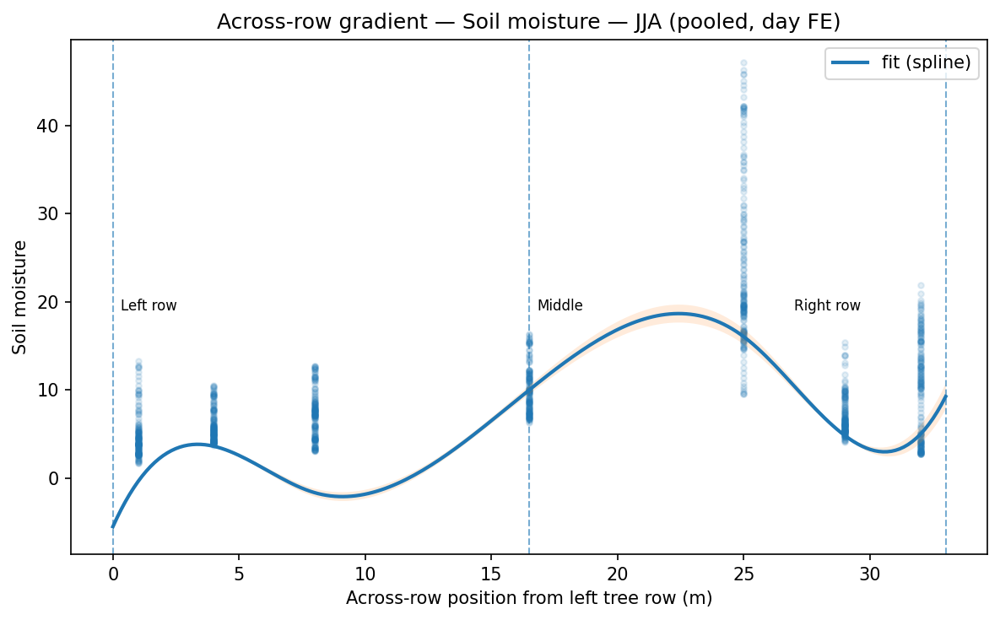

Saved: q2_figs/season/setup_continuous_soil_moisture_season_JJA.png | q2_figs/season/setup_continuous_soil_moisture_season_JJA.pdf


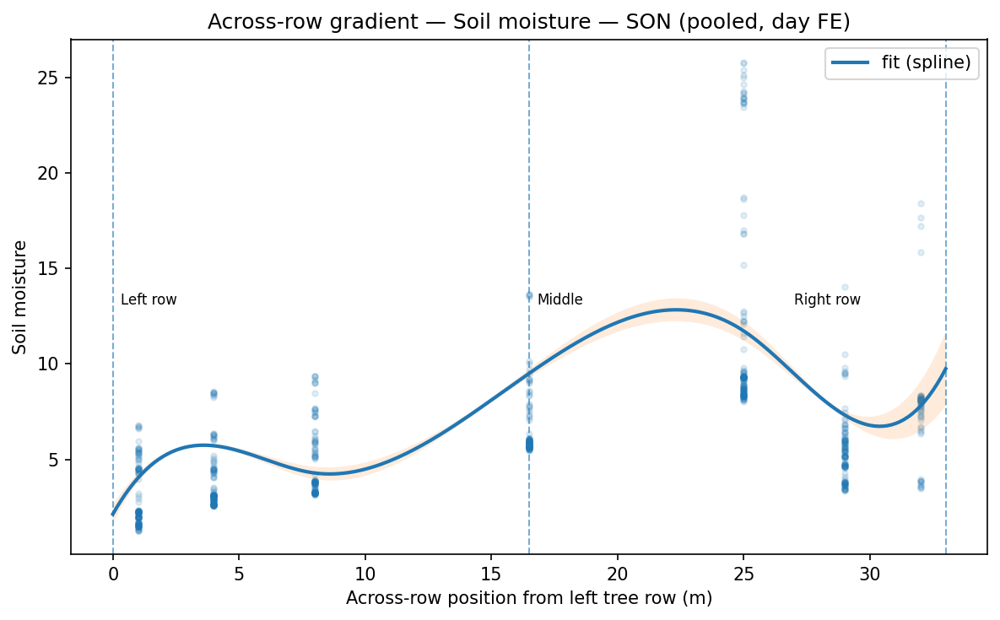

Saved: q2_figs/season/setup_continuous_soil_moisture_season_SON.png | q2_figs/season/setup_continuous_soil_moisture_season_SON.pdf
[season] snapped 2 → 1


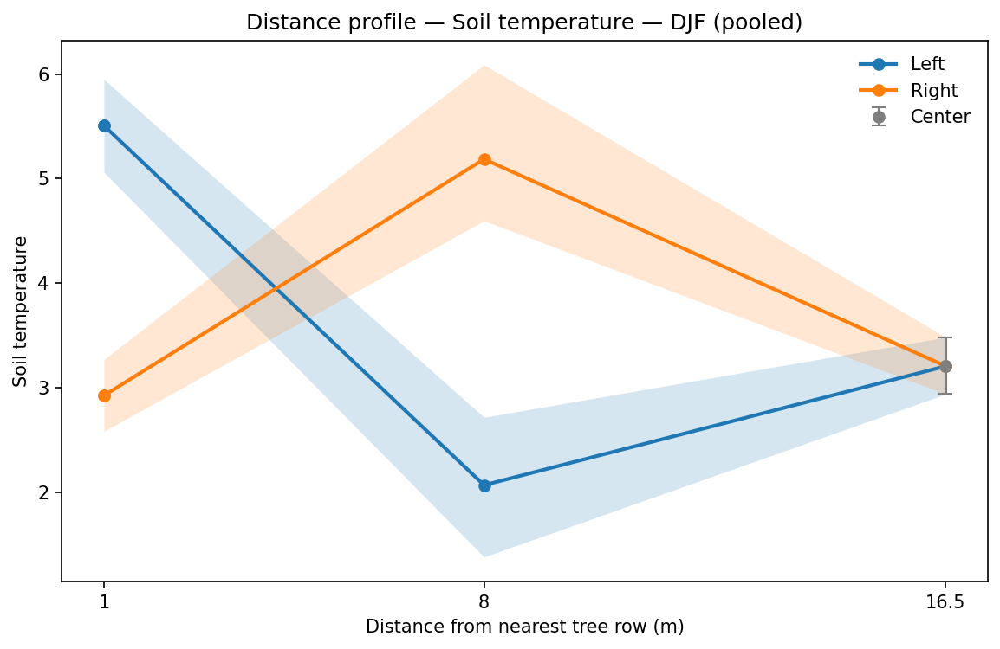

Saved: q2_figs/season/soil_temperature_profile_season_DJF_pooled.png | q2_figs/season/soil_temperature_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


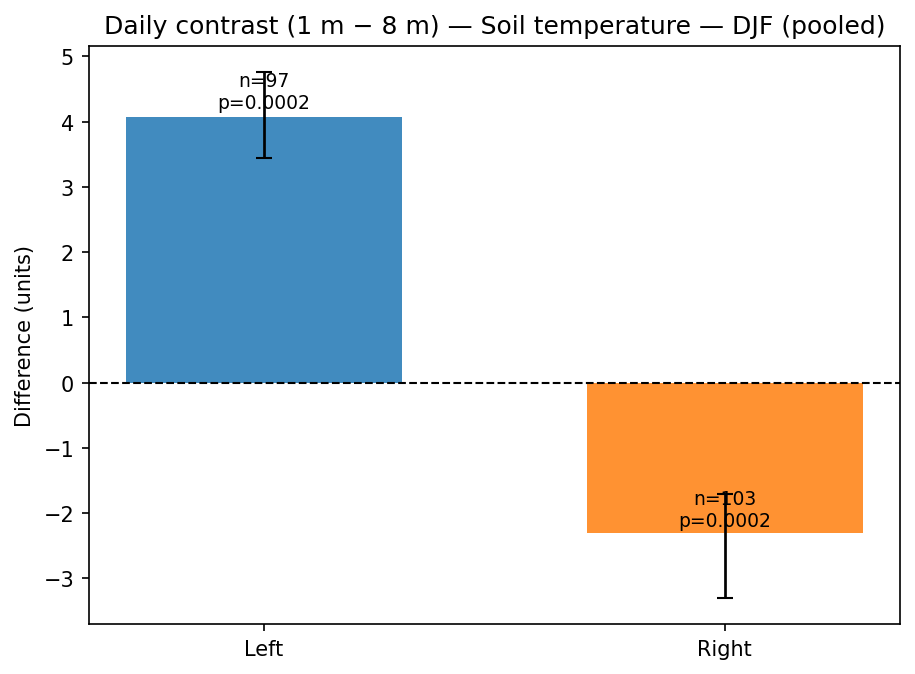

Saved: q2_figs/season/soil_temperature_contrast_season_DJF_pooled.png | q2_figs/season/soil_temperature_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


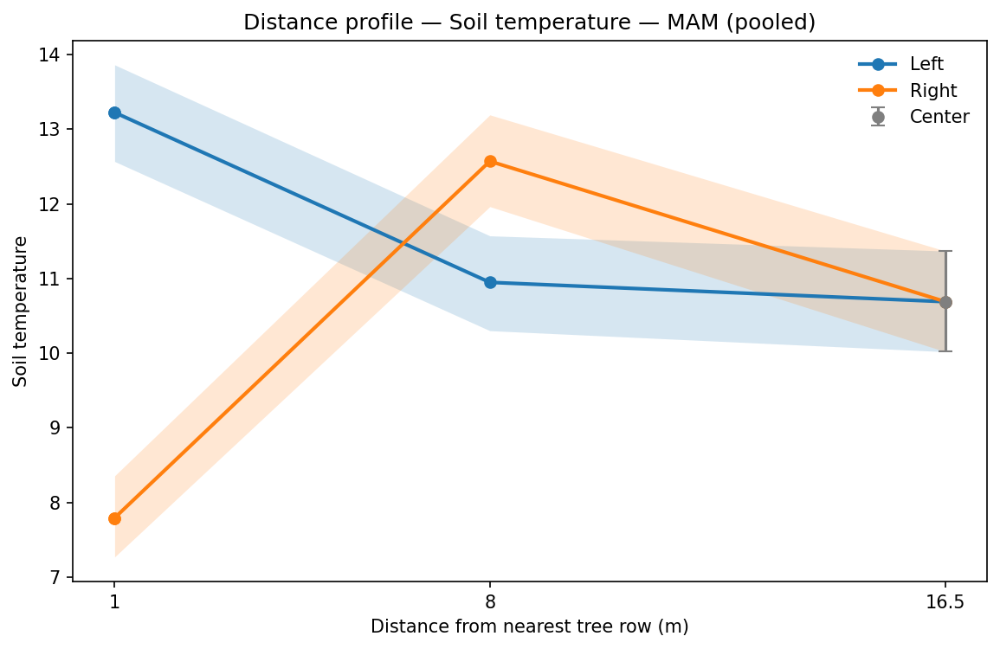

Saved: q2_figs/season/soil_temperature_profile_season_MAM_pooled.png | q2_figs/season/soil_temperature_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


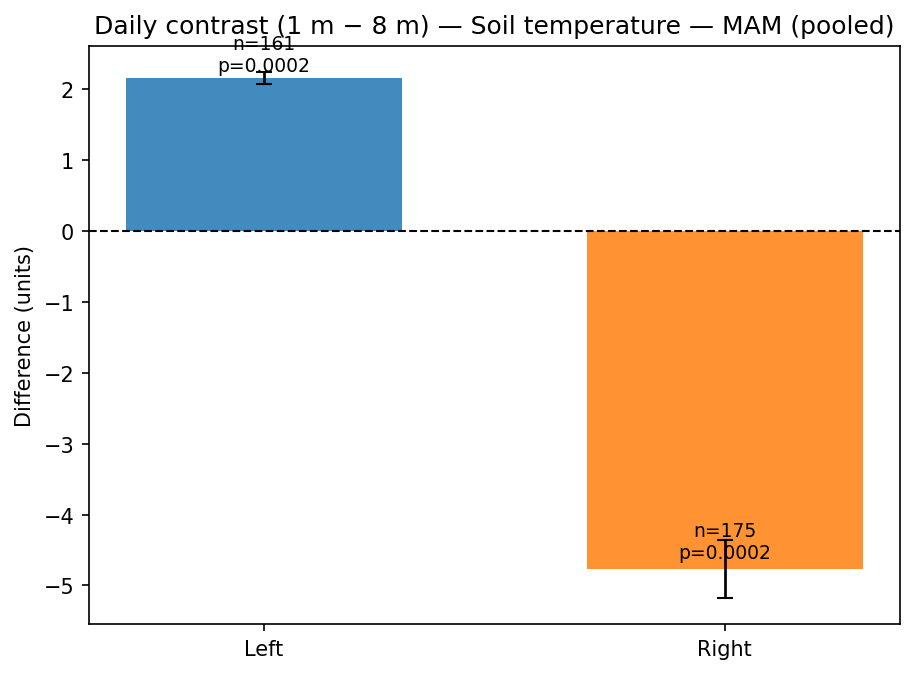

Saved: q2_figs/season/soil_temperature_contrast_season_MAM_pooled.png | q2_figs/season/soil_temperature_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


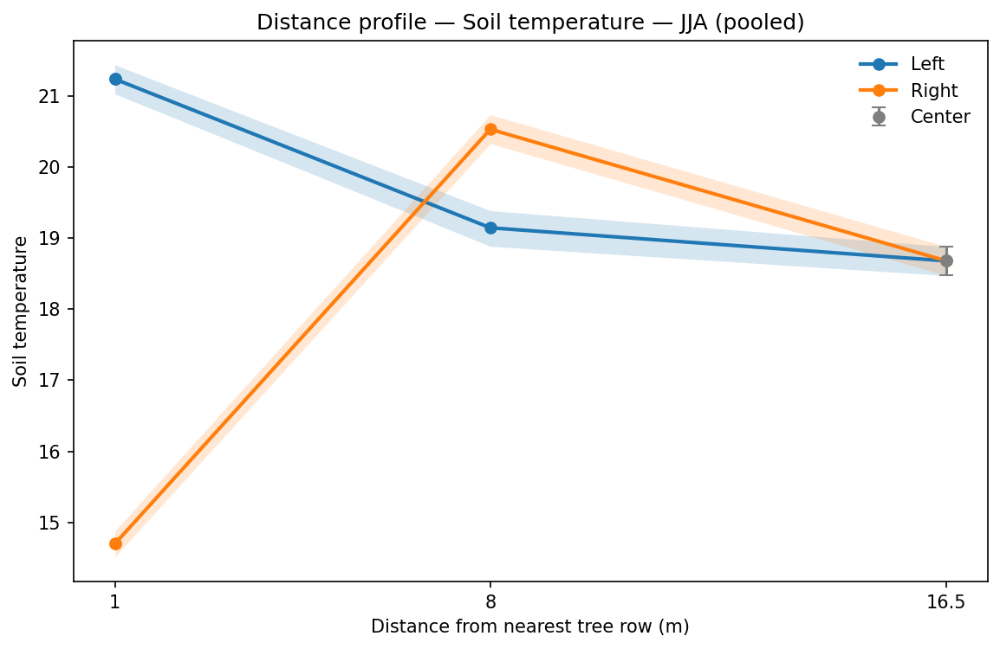

Saved: q2_figs/season/soil_temperature_profile_season_JJA_pooled.png | q2_figs/season/soil_temperature_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


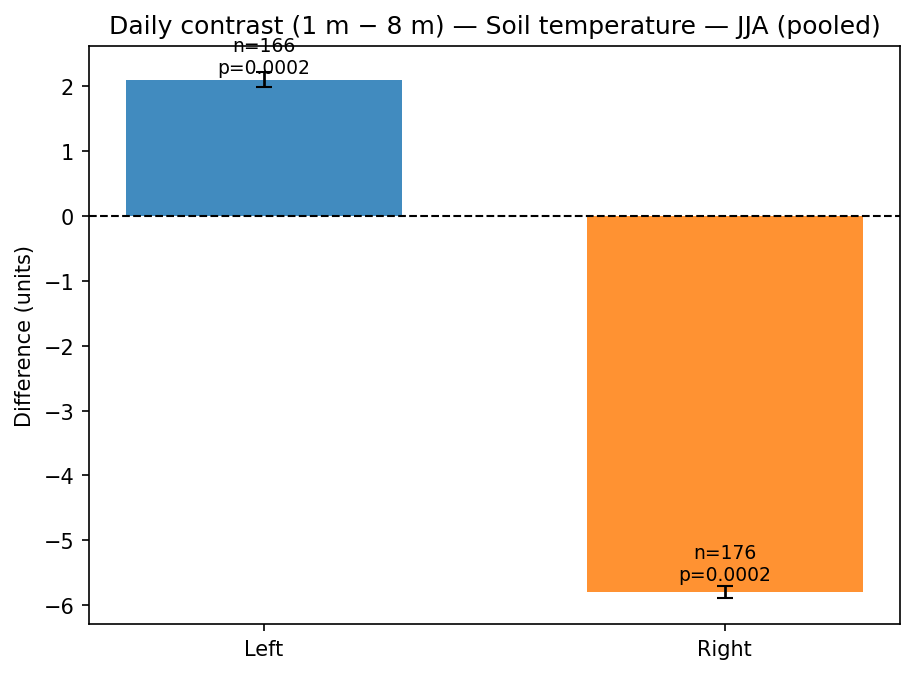

Saved: q2_figs/season/soil_temperature_contrast_season_JJA_pooled.png | q2_figs/season/soil_temperature_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


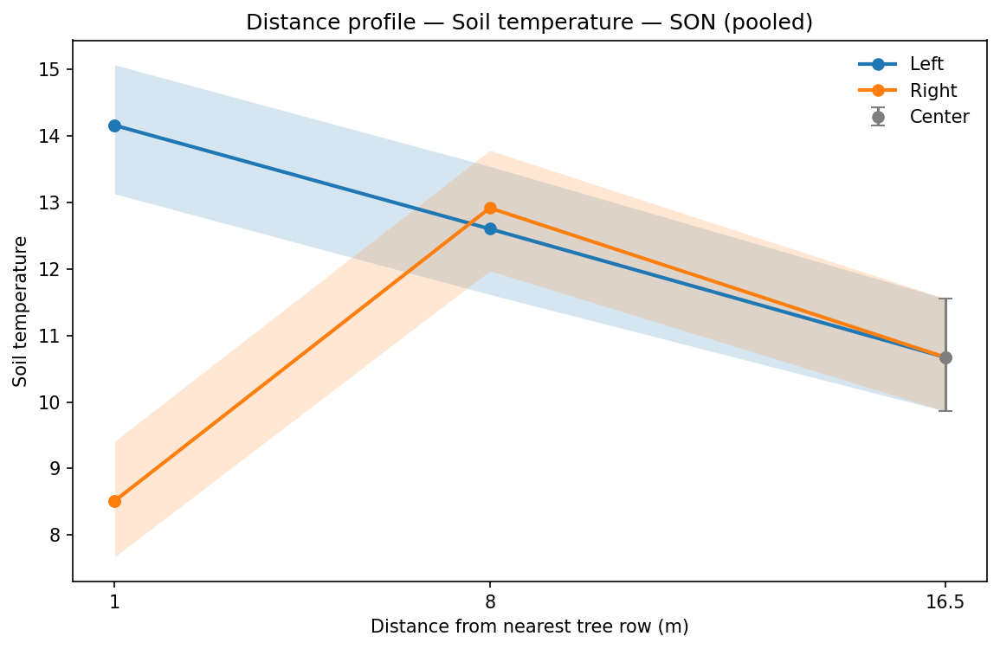

Saved: q2_figs/season/soil_temperature_profile_season_SON_pooled.png | q2_figs/season/soil_temperature_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


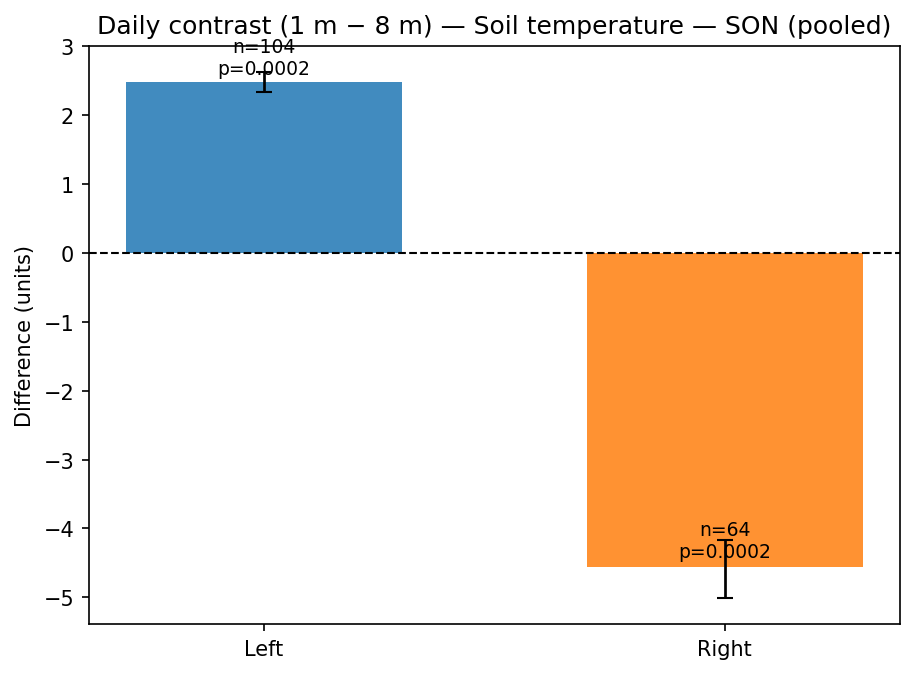

Saved: q2_figs/season/soil_temperature_contrast_season_SON_pooled.png | q2_figs/season/soil_temperature_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


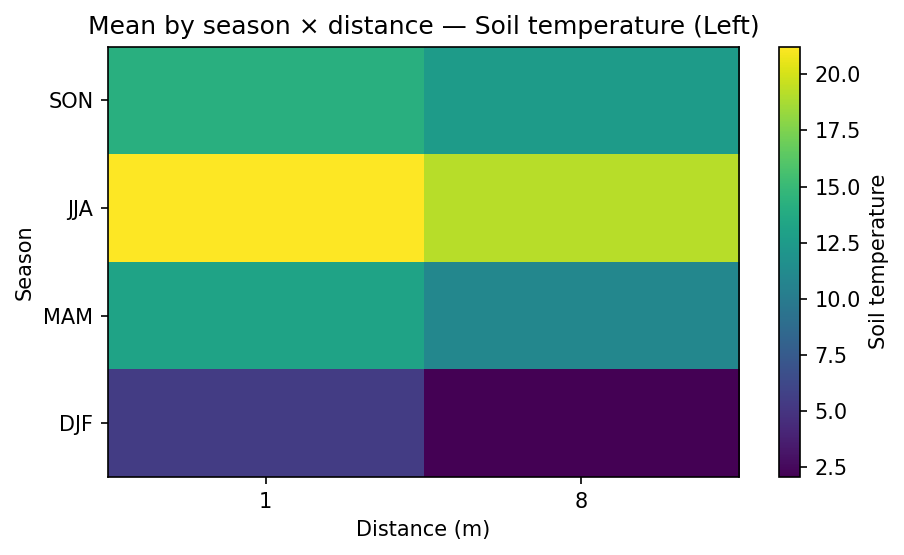

Saved: q2_figs/season/soil_temperature_heatmap_season_L.png | q2_figs/season/soil_temperature_heatmap_season_L.pdf


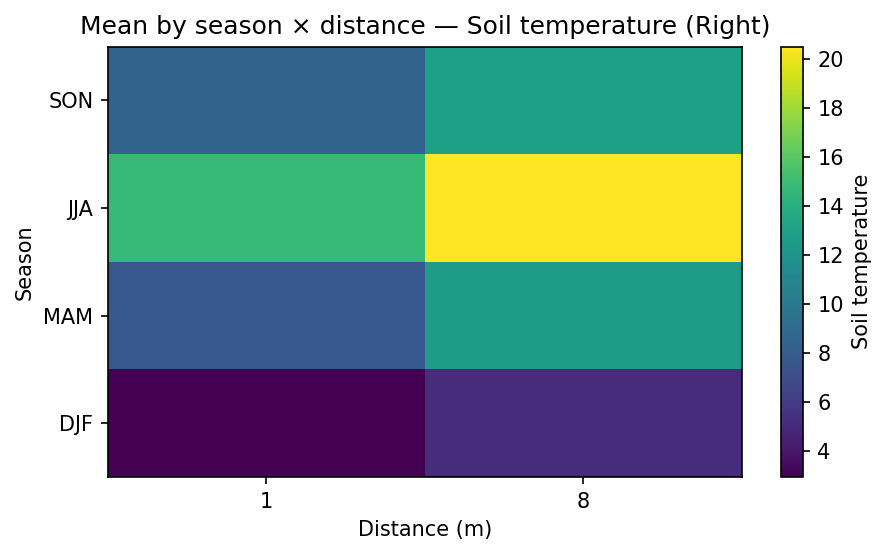

Saved: q2_figs/season/soil_temperature_heatmap_season_R.png | q2_figs/season/soil_temperature_heatmap_season_R.pdf


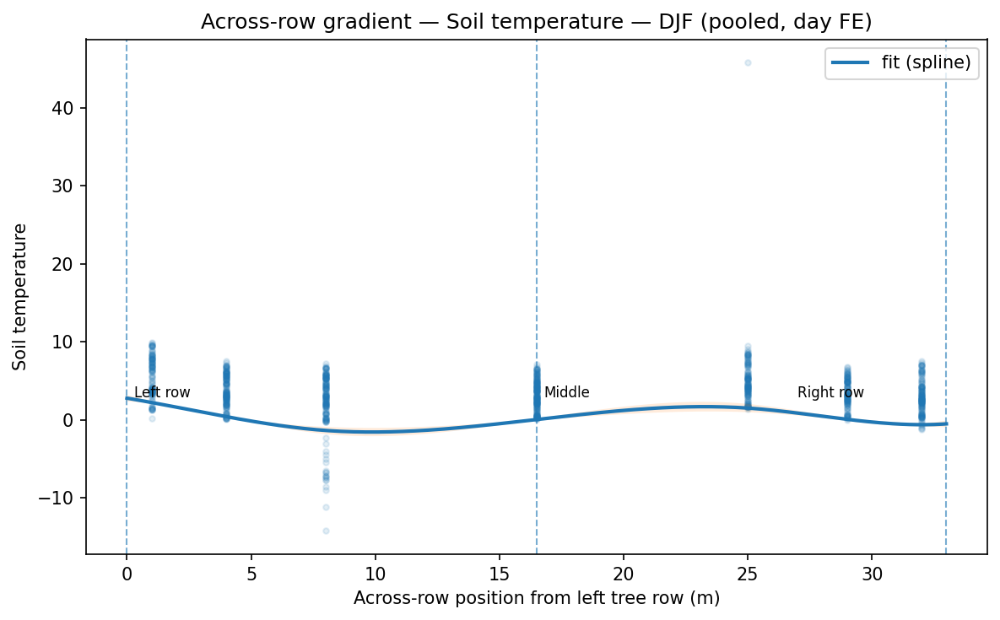

Saved: q2_figs/season/setup_continuous_soil_temperature_season_DJF.png | q2_figs/season/setup_continuous_soil_temperature_season_DJF.pdf


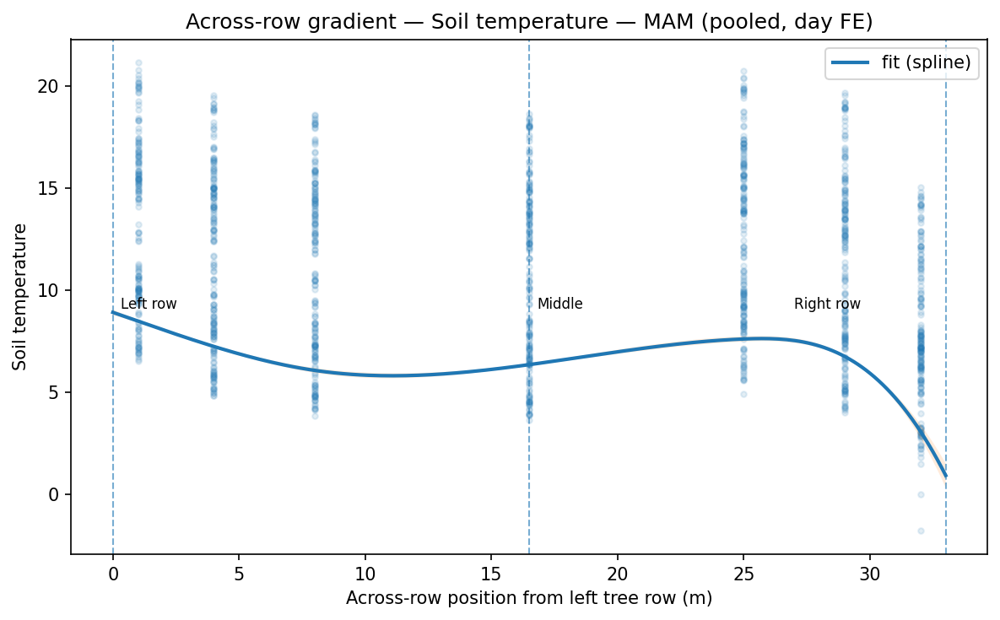

Saved: q2_figs/season/setup_continuous_soil_temperature_season_MAM.png | q2_figs/season/setup_continuous_soil_temperature_season_MAM.pdf


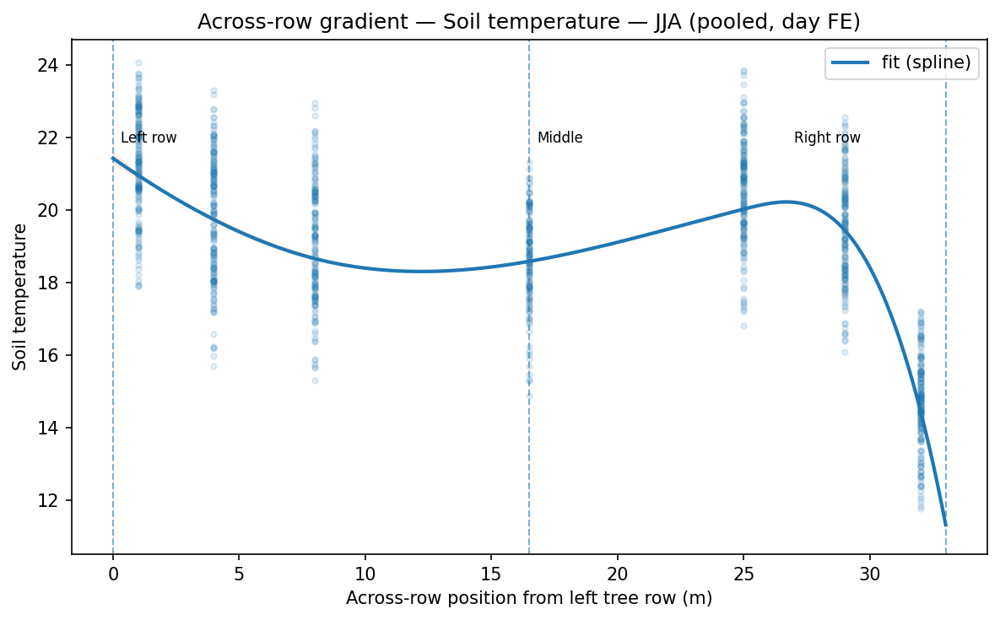

Saved: q2_figs/season/setup_continuous_soil_temperature_season_JJA.png | q2_figs/season/setup_continuous_soil_temperature_season_JJA.pdf


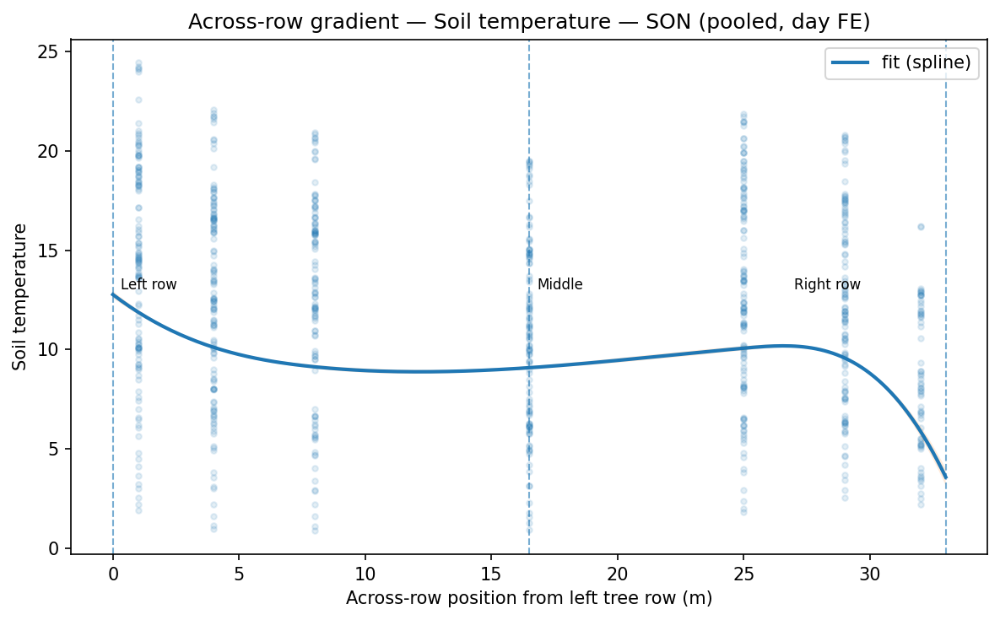

Saved: q2_figs/season/setup_continuous_soil_temperature_season_SON.png | q2_figs/season/setup_continuous_soil_temperature_season_SON.pdf
[season] snapped 2 → 1


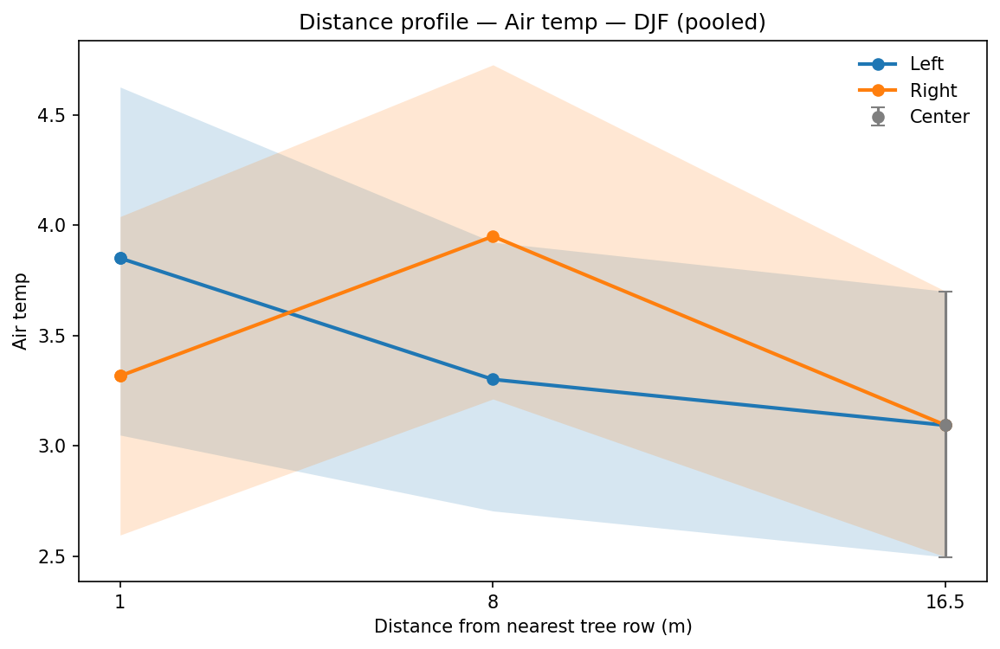

Saved: q2_figs/season/air_temp_profile_season_DJF_pooled.png | q2_figs/season/air_temp_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


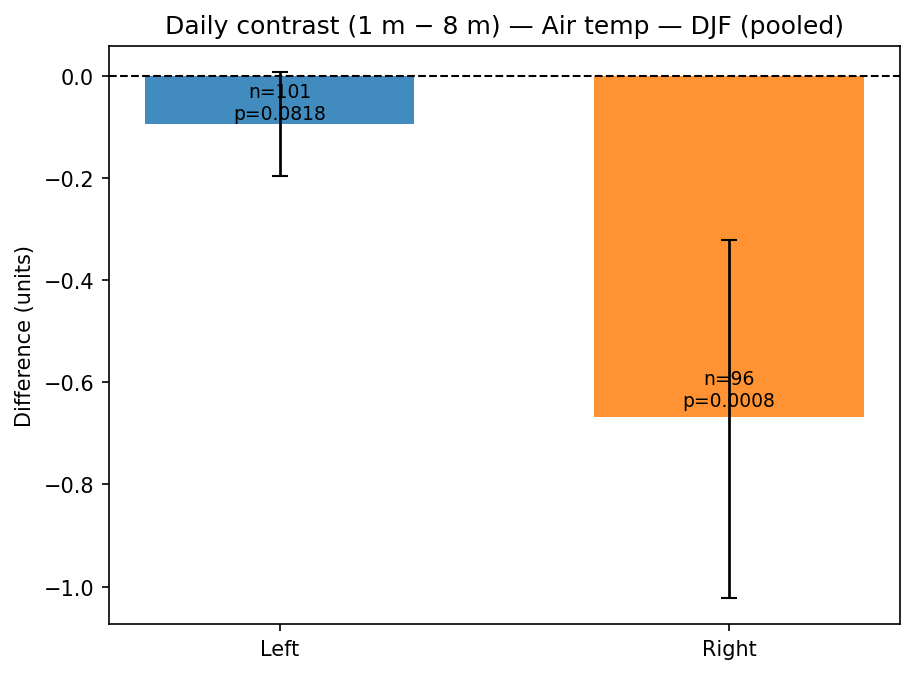

Saved: q2_figs/season/air_temp_contrast_season_DJF_pooled.png | q2_figs/season/air_temp_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


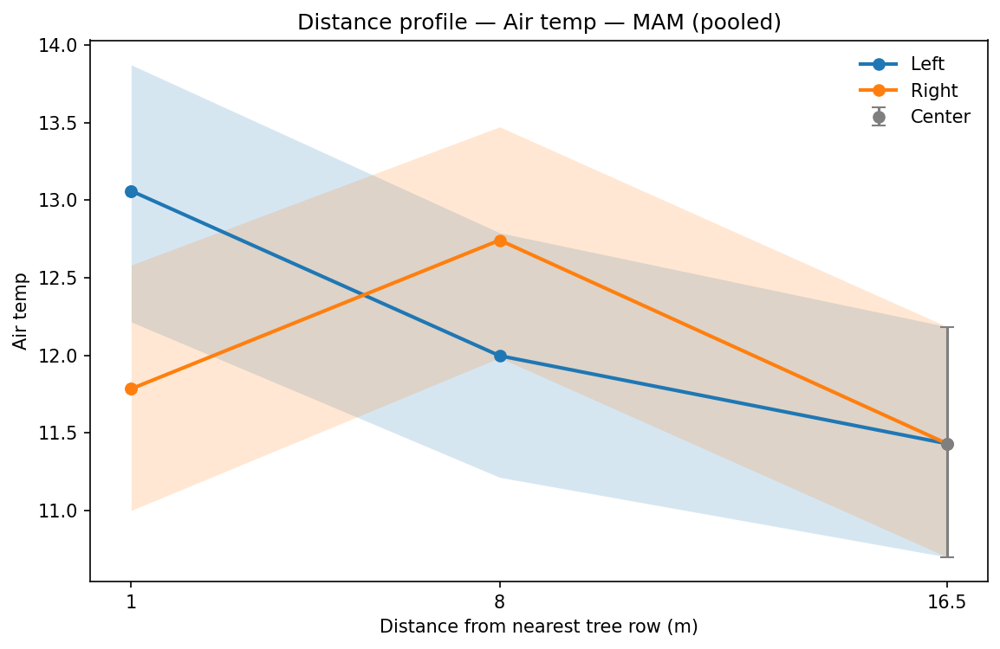

Saved: q2_figs/season/air_temp_profile_season_MAM_pooled.png | q2_figs/season/air_temp_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


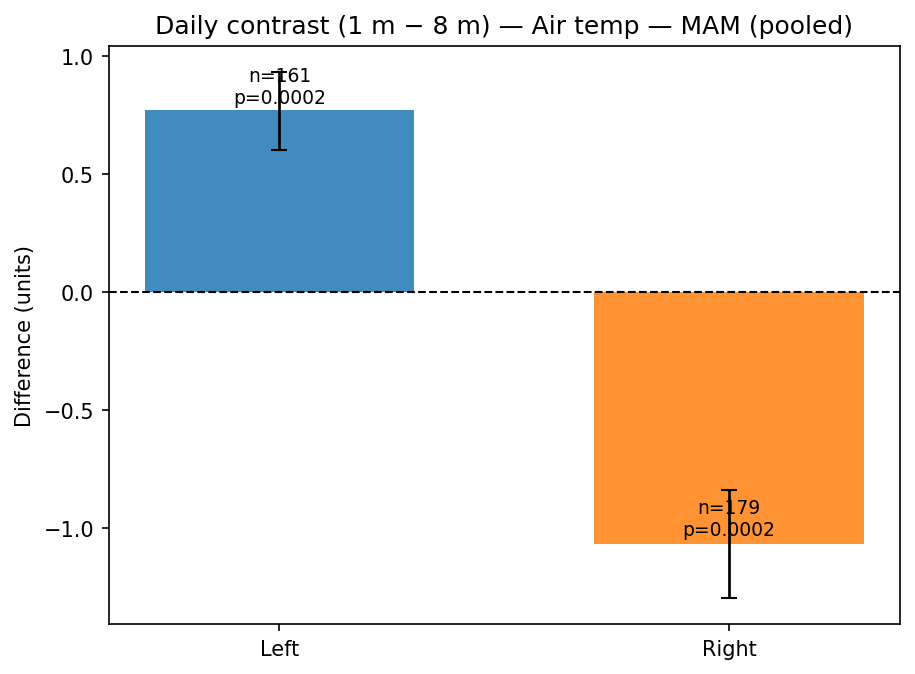

Saved: q2_figs/season/air_temp_contrast_season_MAM_pooled.png | q2_figs/season/air_temp_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


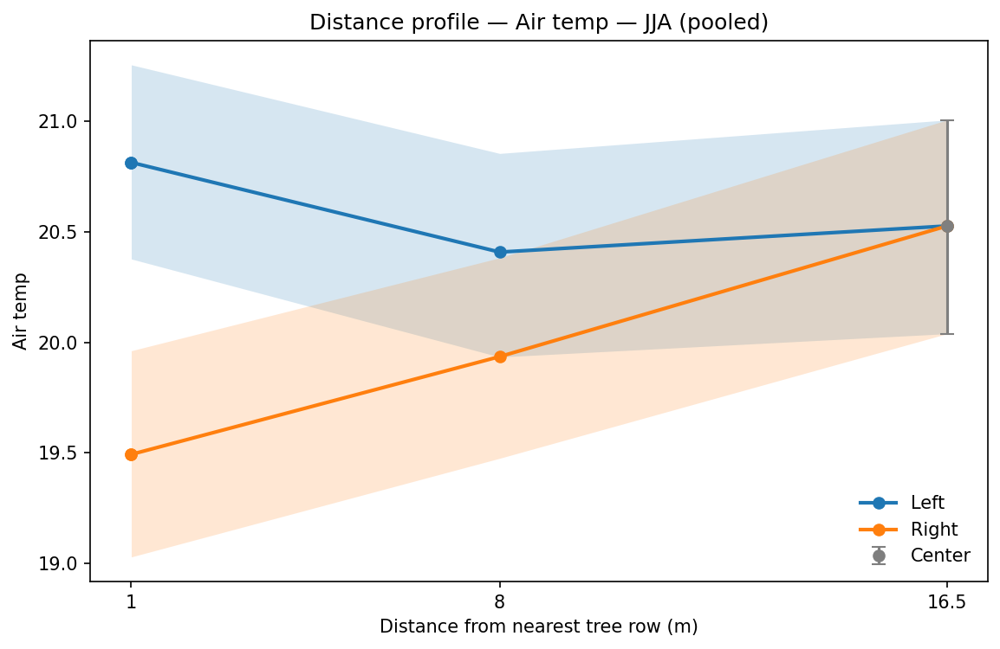

Saved: q2_figs/season/air_temp_profile_season_JJA_pooled.png | q2_figs/season/air_temp_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


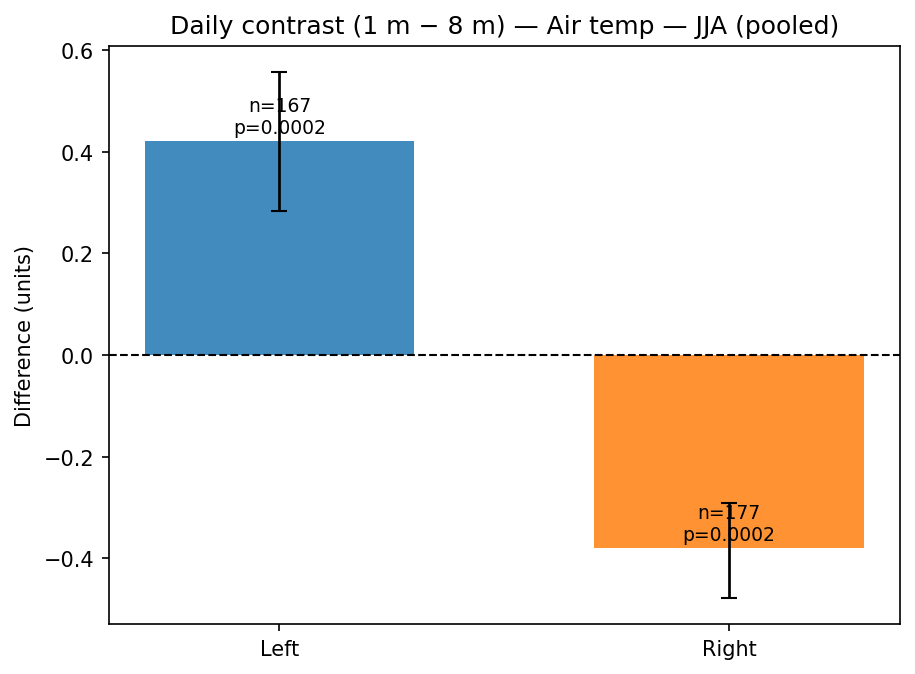

Saved: q2_figs/season/air_temp_contrast_season_JJA_pooled.png | q2_figs/season/air_temp_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


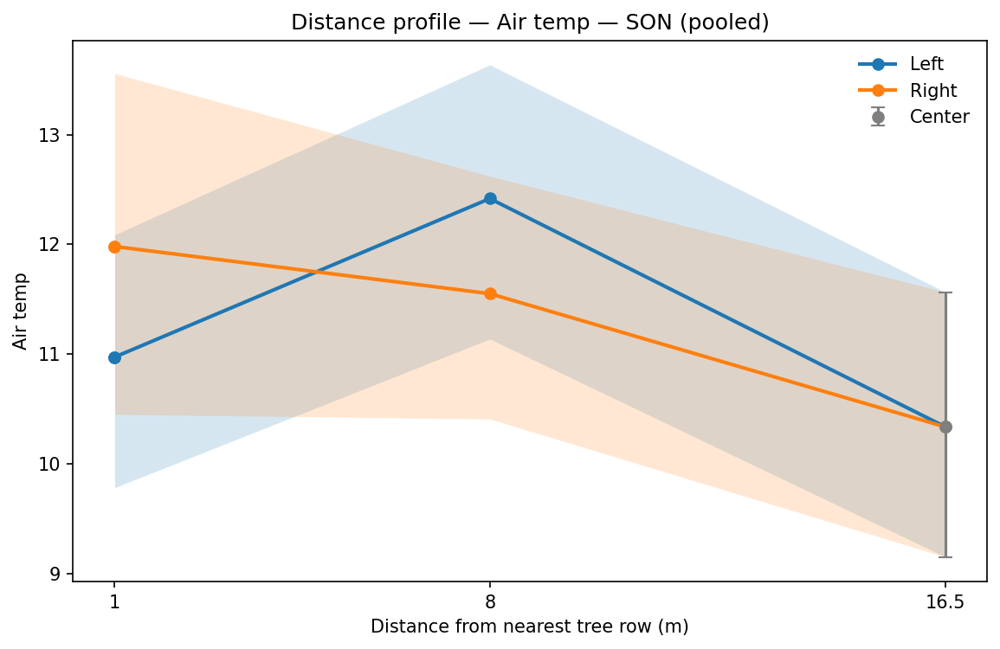

Saved: q2_figs/season/air_temp_profile_season_SON_pooled.png | q2_figs/season/air_temp_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


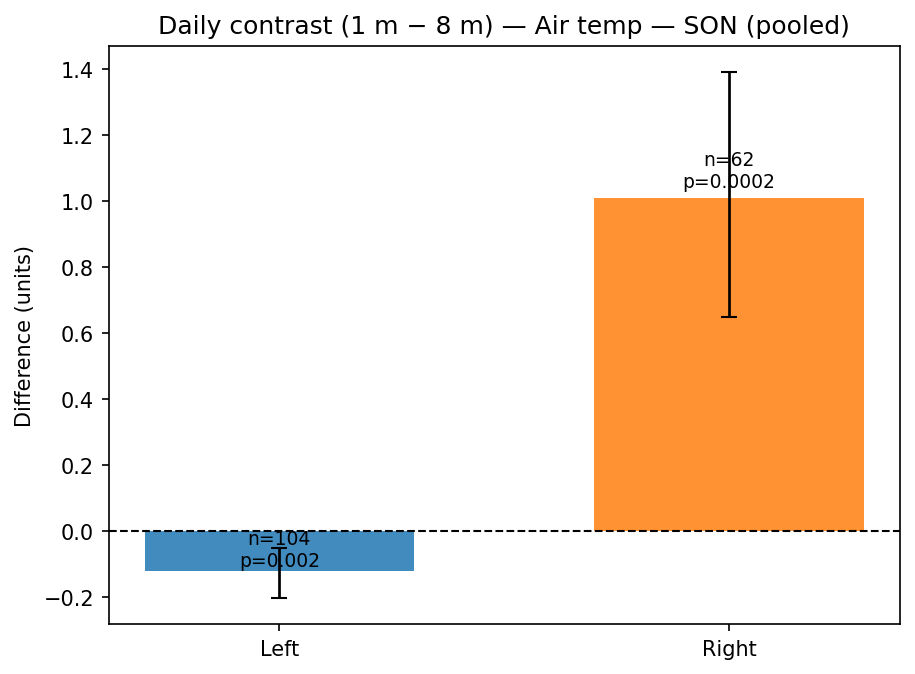

Saved: q2_figs/season/air_temp_contrast_season_SON_pooled.png | q2_figs/season/air_temp_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


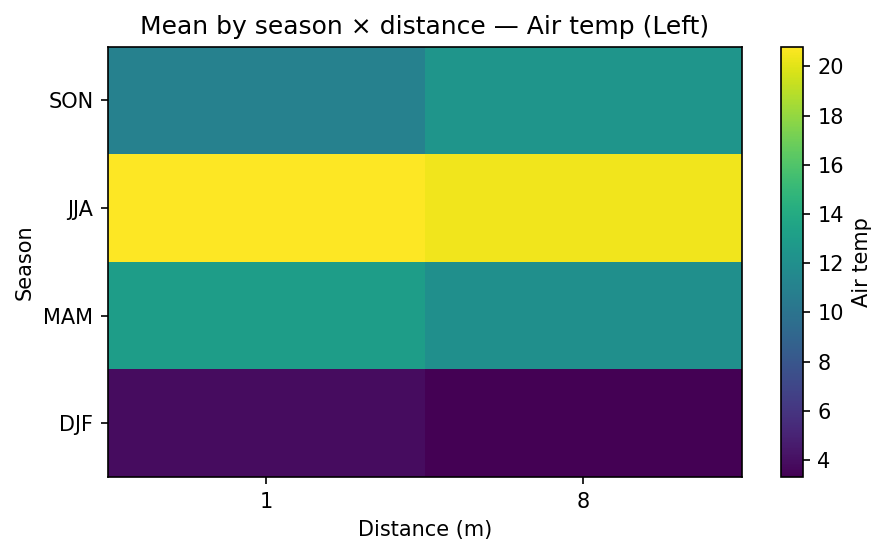

Saved: q2_figs/season/air_temp_heatmap_season_L.png | q2_figs/season/air_temp_heatmap_season_L.pdf


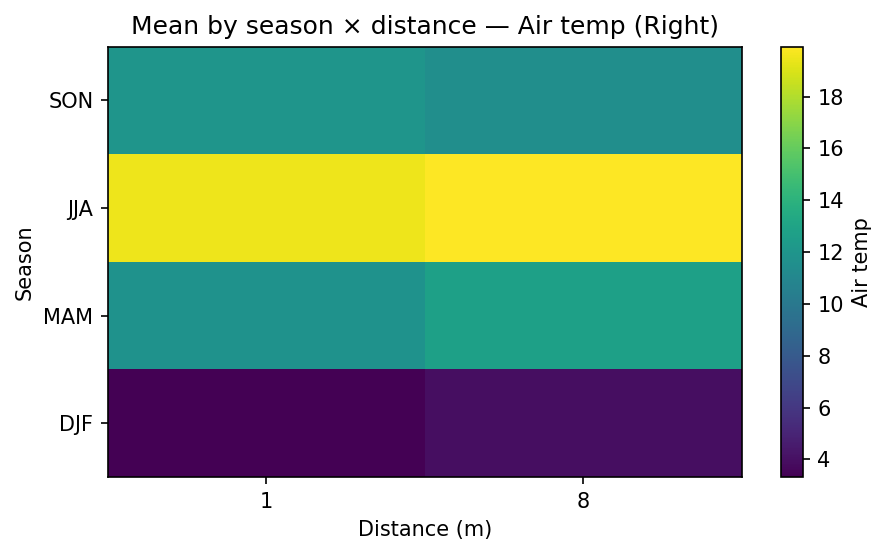

Saved: q2_figs/season/air_temp_heatmap_season_R.png | q2_figs/season/air_temp_heatmap_season_R.pdf


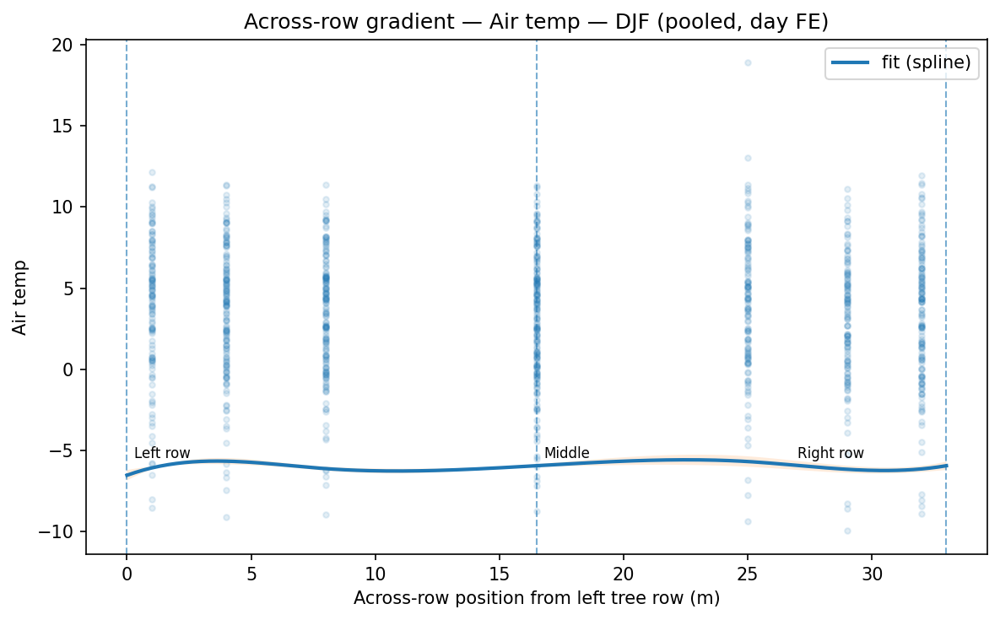

Saved: q2_figs/season/setup_continuous_air_temp_season_DJF.png | q2_figs/season/setup_continuous_air_temp_season_DJF.pdf


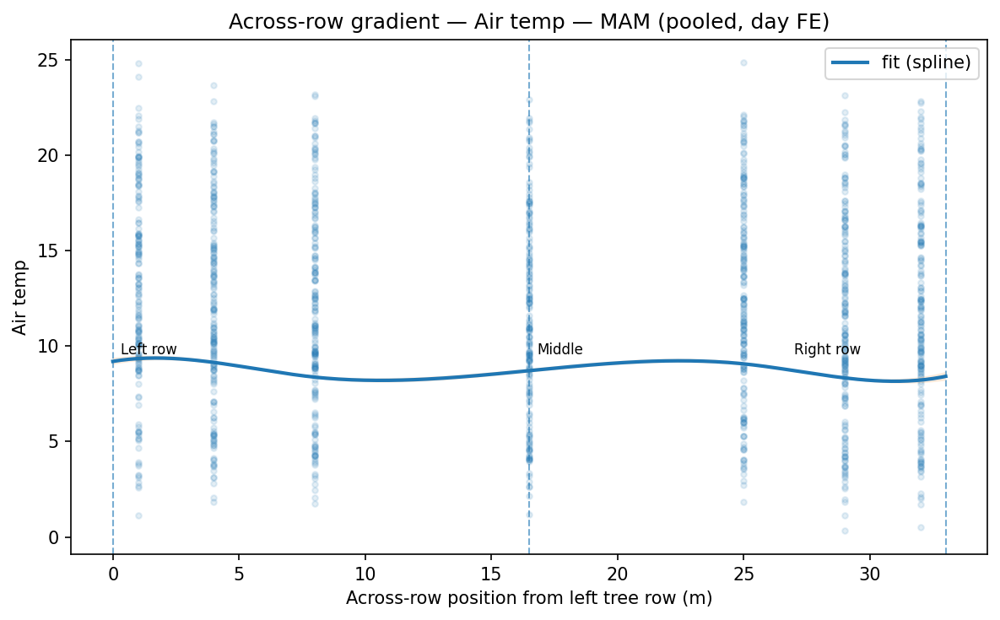

Saved: q2_figs/season/setup_continuous_air_temp_season_MAM.png | q2_figs/season/setup_continuous_air_temp_season_MAM.pdf


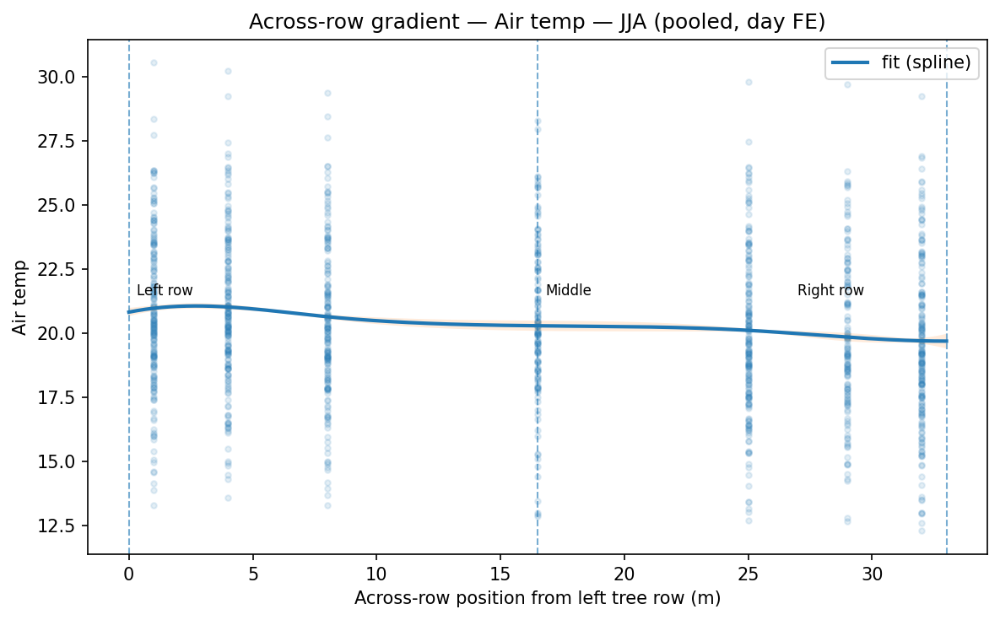

Saved: q2_figs/season/setup_continuous_air_temp_season_JJA.png | q2_figs/season/setup_continuous_air_temp_season_JJA.pdf


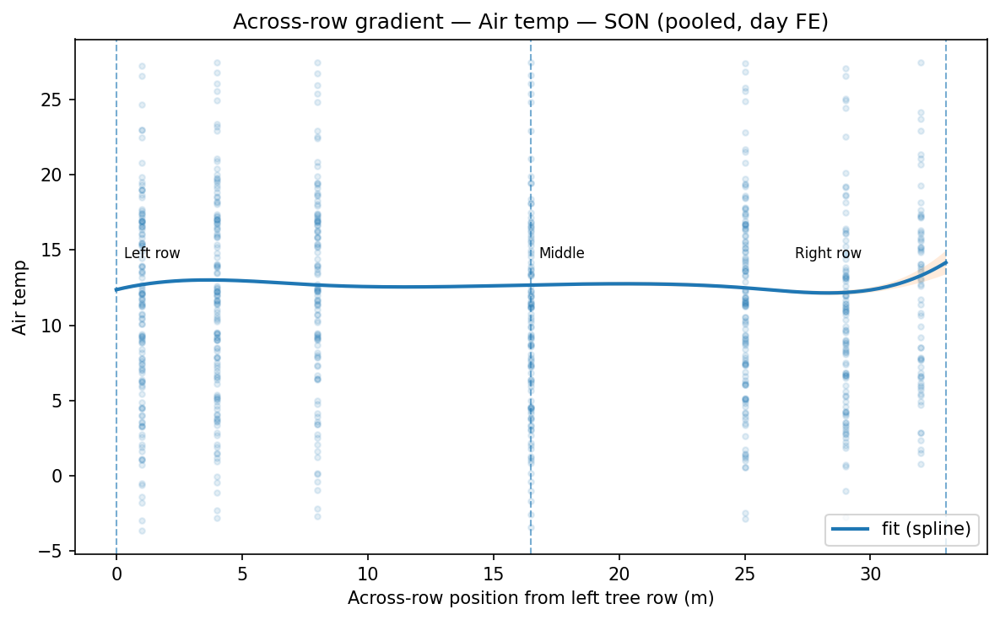

Saved: q2_figs/season/setup_continuous_air_temp_season_SON.png | q2_figs/season/setup_continuous_air_temp_season_SON.pdf
[season] snapped 2 → 1


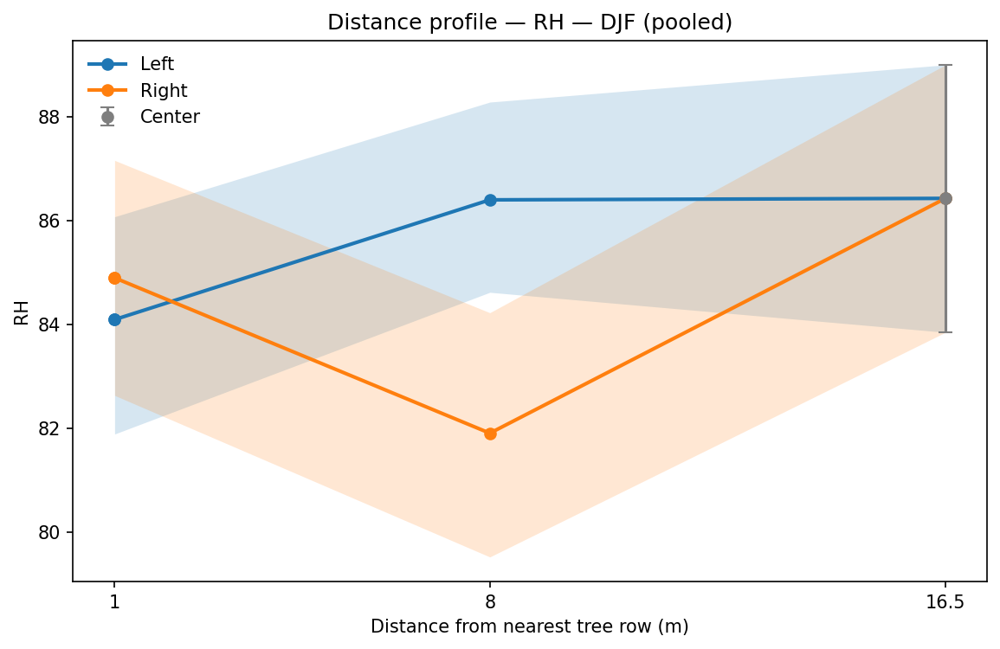

Saved: q2_figs/season/rh_profile_season_DJF_pooled.png | q2_figs/season/rh_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


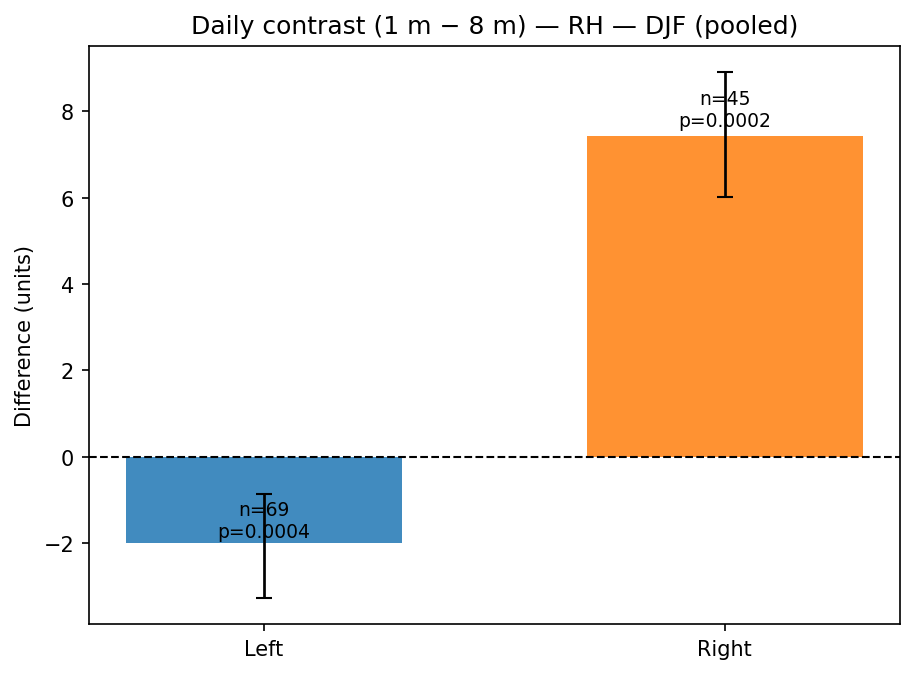

Saved: q2_figs/season/rh_contrast_season_DJF_pooled.png | q2_figs/season/rh_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


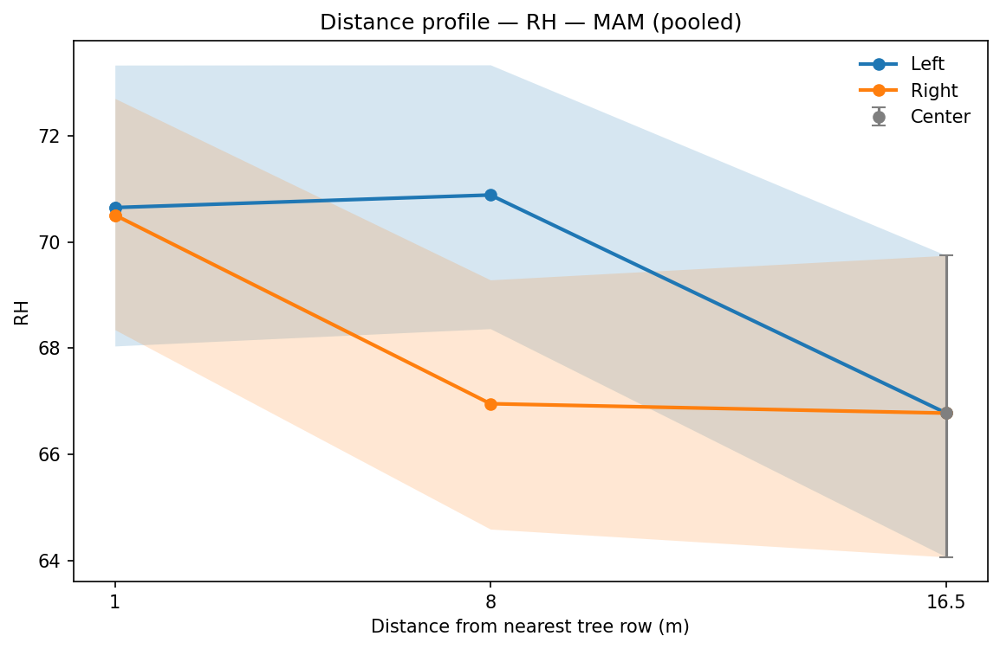

Saved: q2_figs/season/rh_profile_season_MAM_pooled.png | q2_figs/season/rh_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


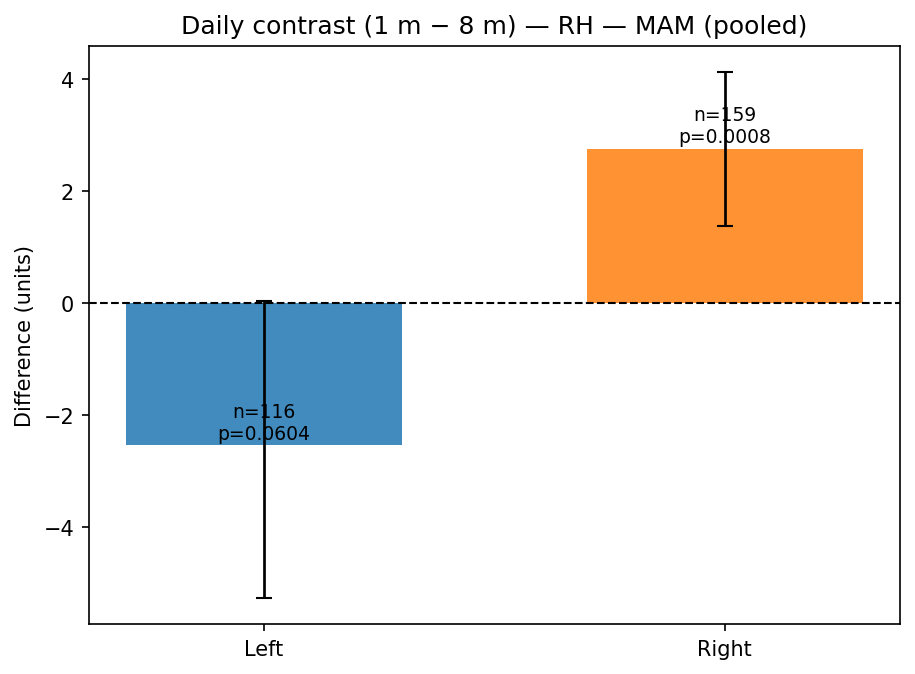

Saved: q2_figs/season/rh_contrast_season_MAM_pooled.png | q2_figs/season/rh_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


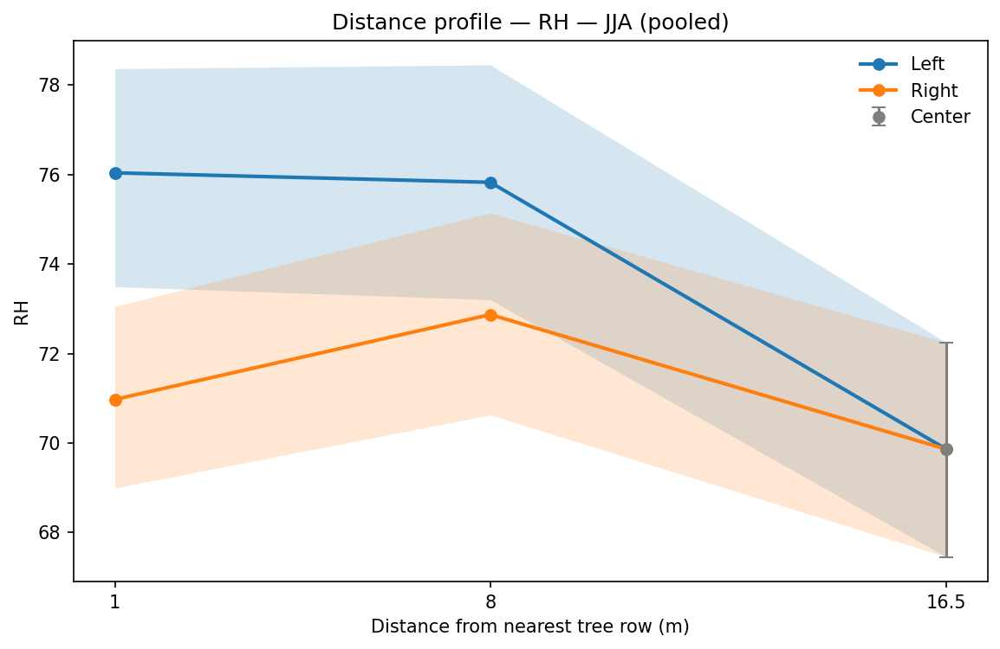

Saved: q2_figs/season/rh_profile_season_JJA_pooled.png | q2_figs/season/rh_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


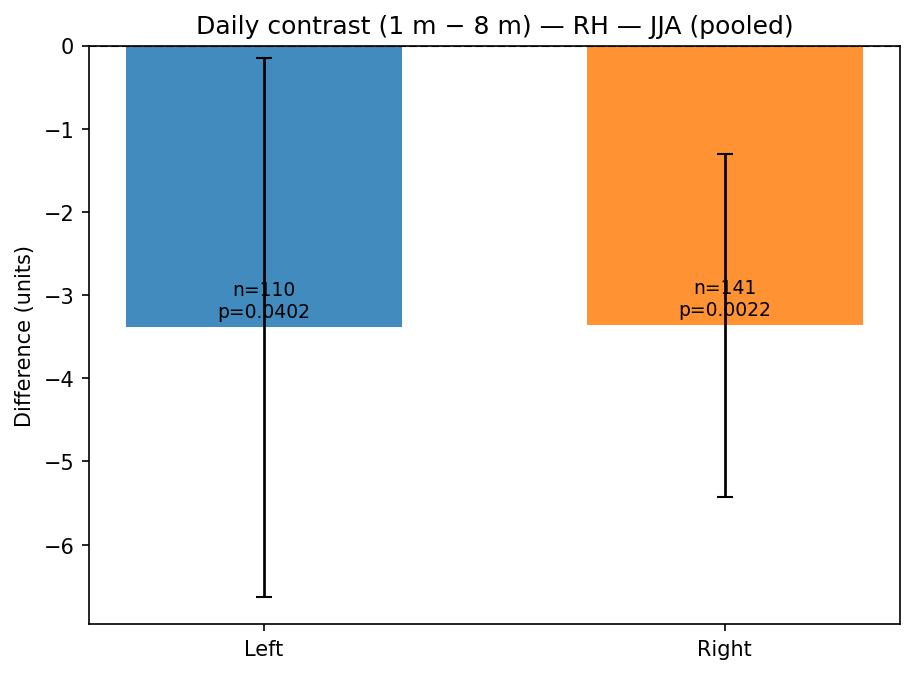

Saved: q2_figs/season/rh_contrast_season_JJA_pooled.png | q2_figs/season/rh_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


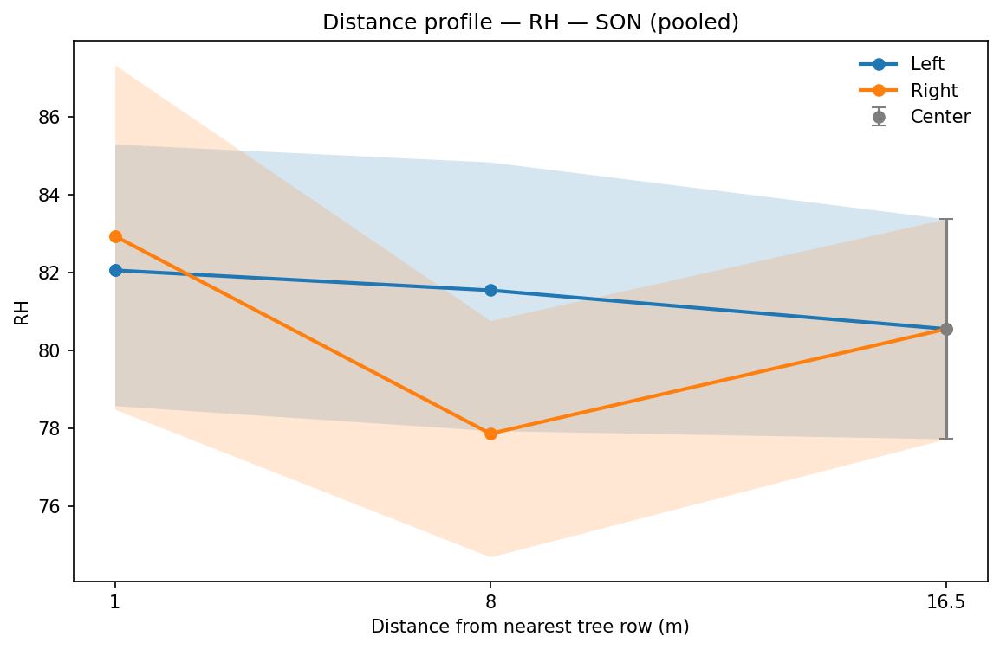

Saved: q2_figs/season/rh_profile_season_SON_pooled.png | q2_figs/season/rh_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


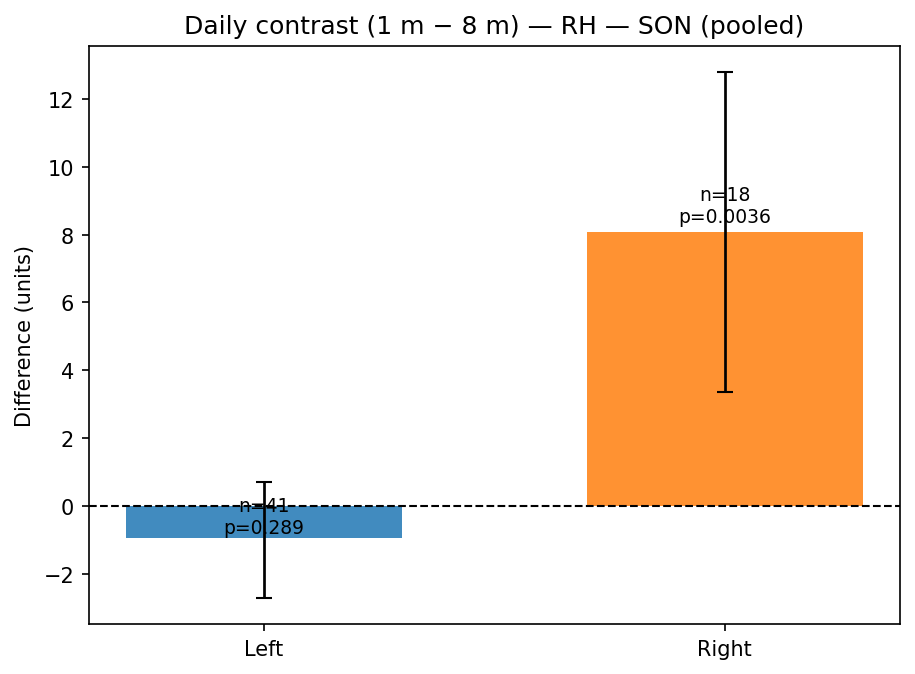

Saved: q2_figs/season/rh_contrast_season_SON_pooled.png | q2_figs/season/rh_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


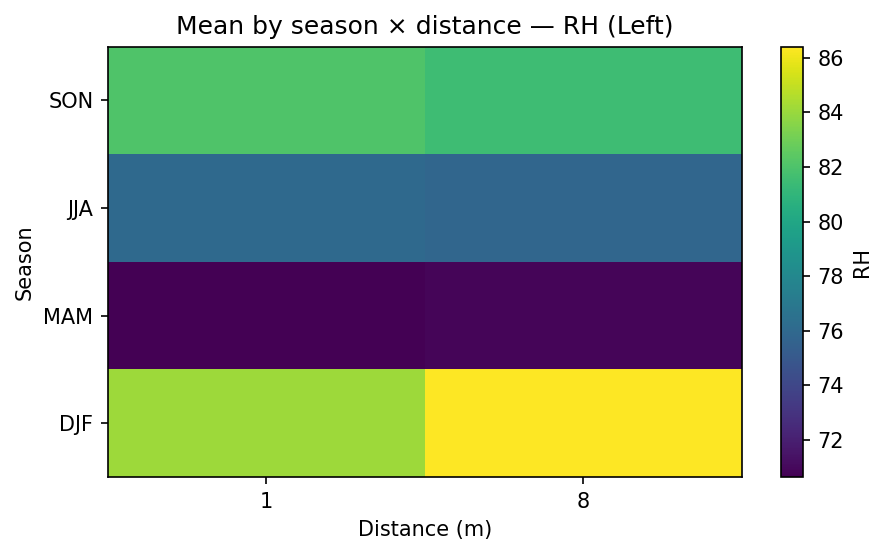

Saved: q2_figs/season/rh_heatmap_season_L.png | q2_figs/season/rh_heatmap_season_L.pdf


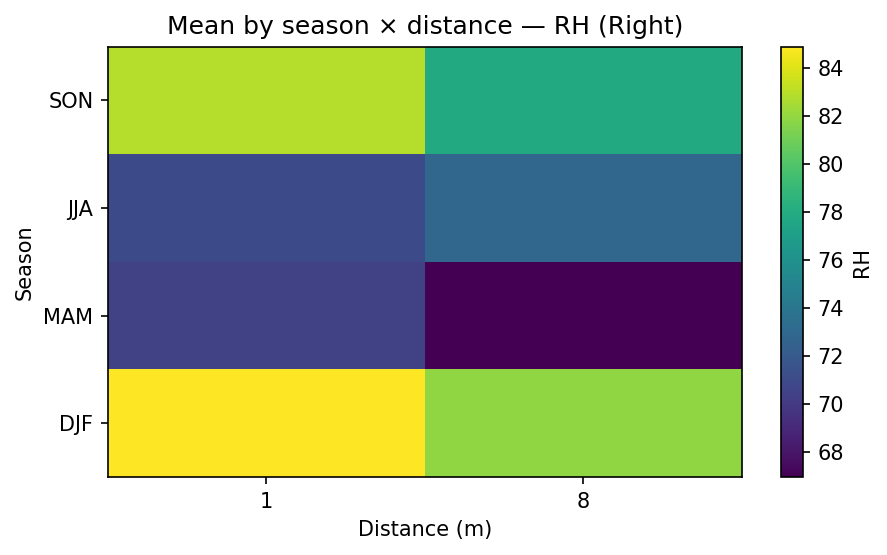

Saved: q2_figs/season/rh_heatmap_season_R.png | q2_figs/season/rh_heatmap_season_R.pdf


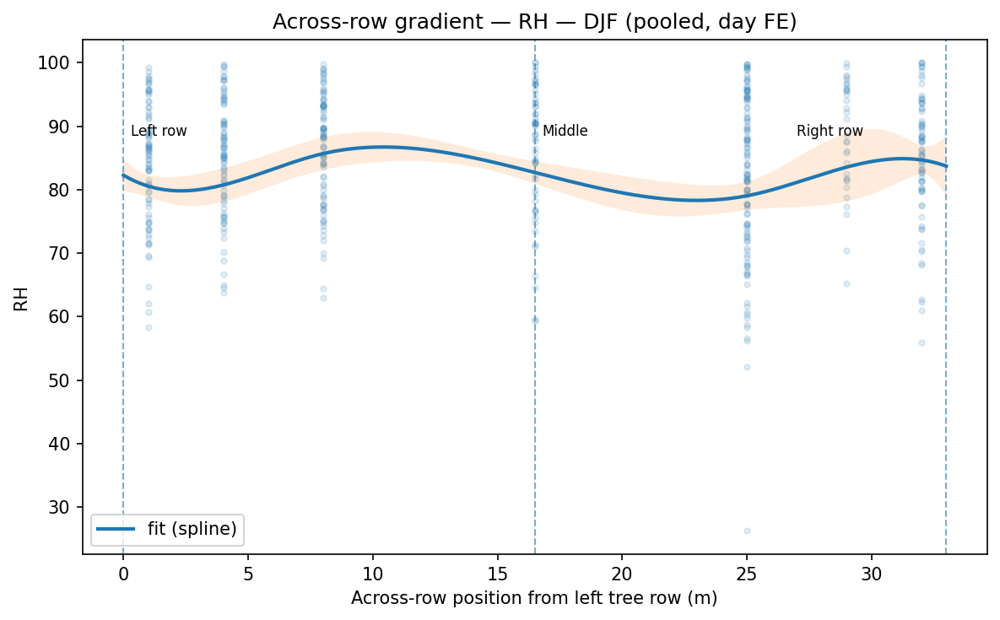

Saved: q2_figs/season/setup_continuous_rh_season_DJF.png | q2_figs/season/setup_continuous_rh_season_DJF.pdf


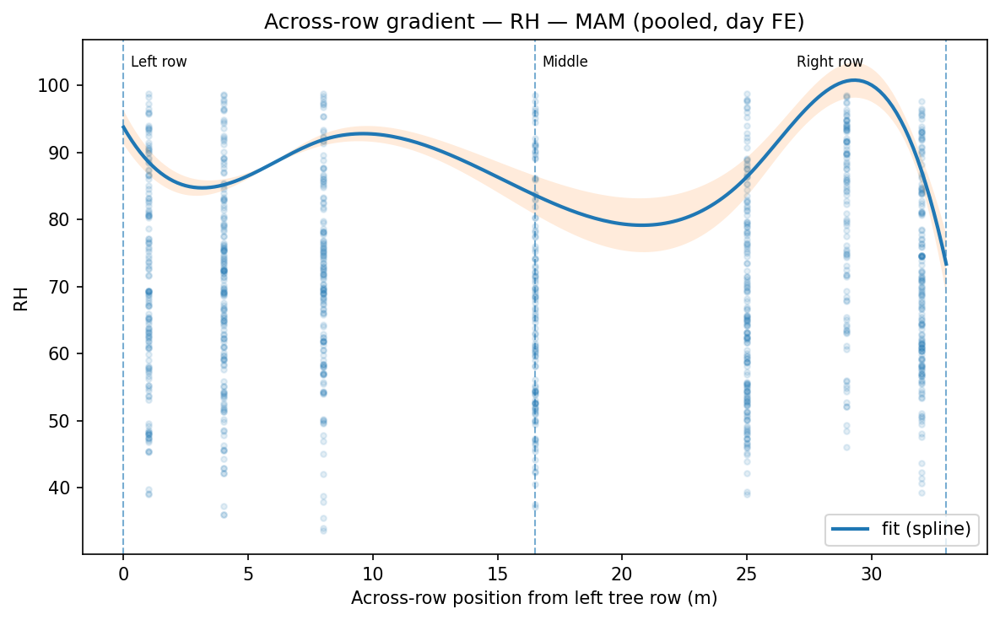

Saved: q2_figs/season/setup_continuous_rh_season_MAM.png | q2_figs/season/setup_continuous_rh_season_MAM.pdf


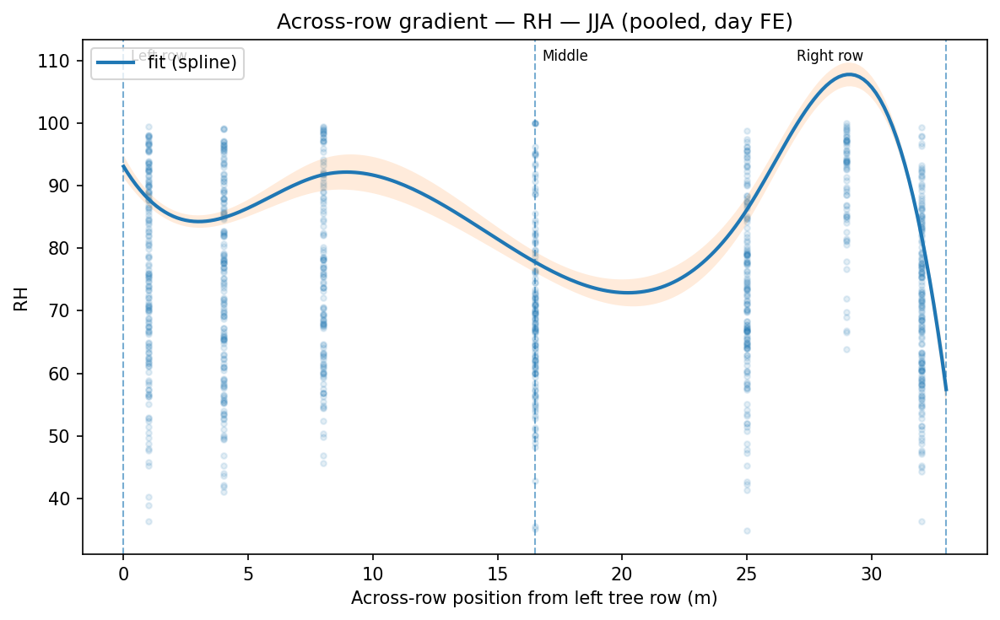

Saved: q2_figs/season/setup_continuous_rh_season_JJA.png | q2_figs/season/setup_continuous_rh_season_JJA.pdf


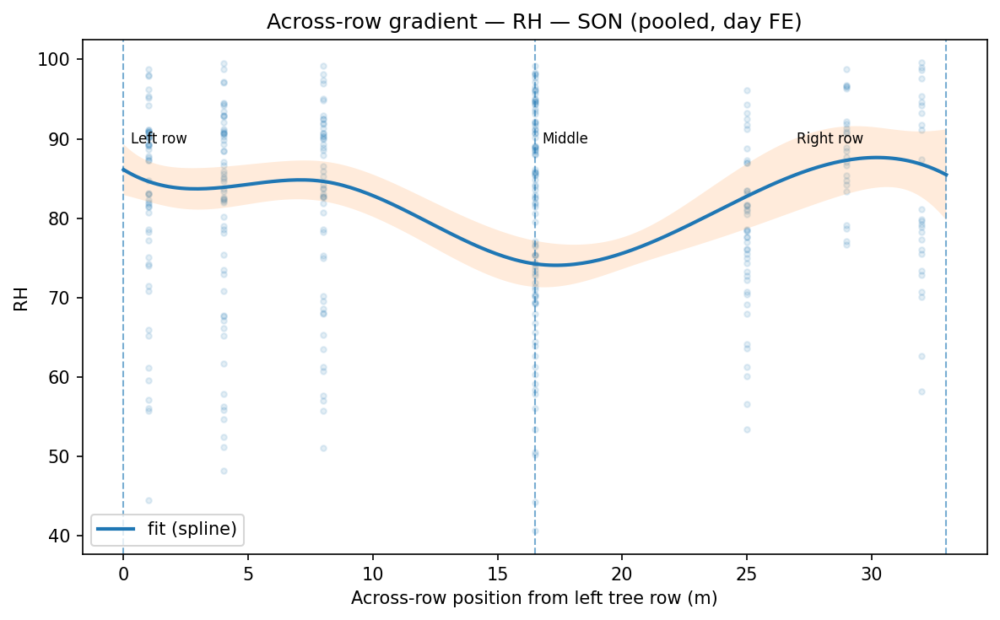

Saved: q2_figs/season/setup_continuous_rh_season_SON.png | q2_figs/season/setup_continuous_rh_season_SON.pdf
[season] snapped 2 → 1


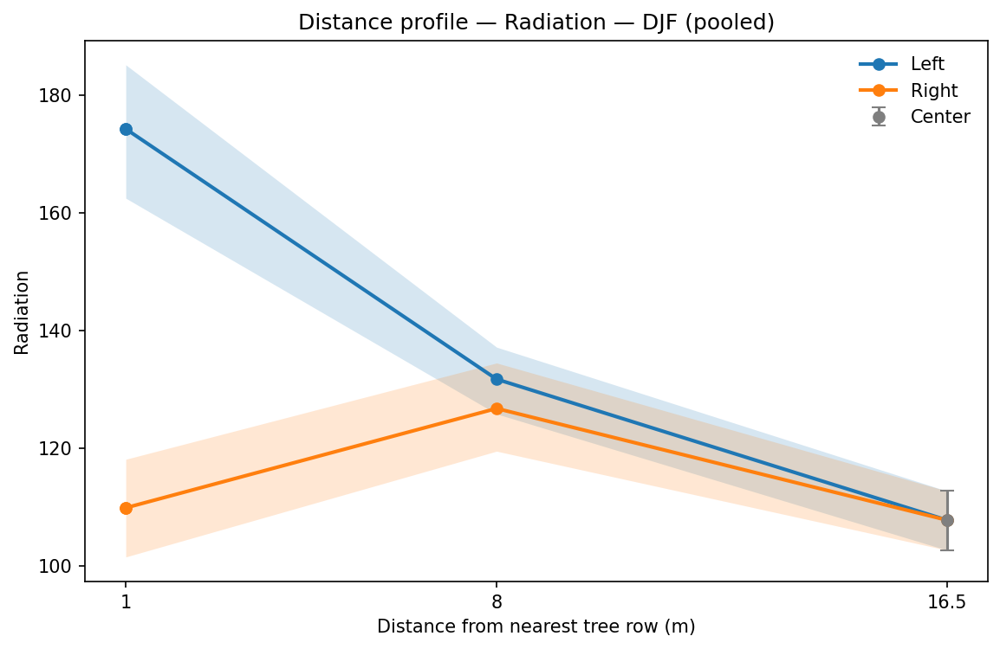

Saved: q2_figs/season/radiation_profile_season_DJF_pooled.png | q2_figs/season/radiation_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


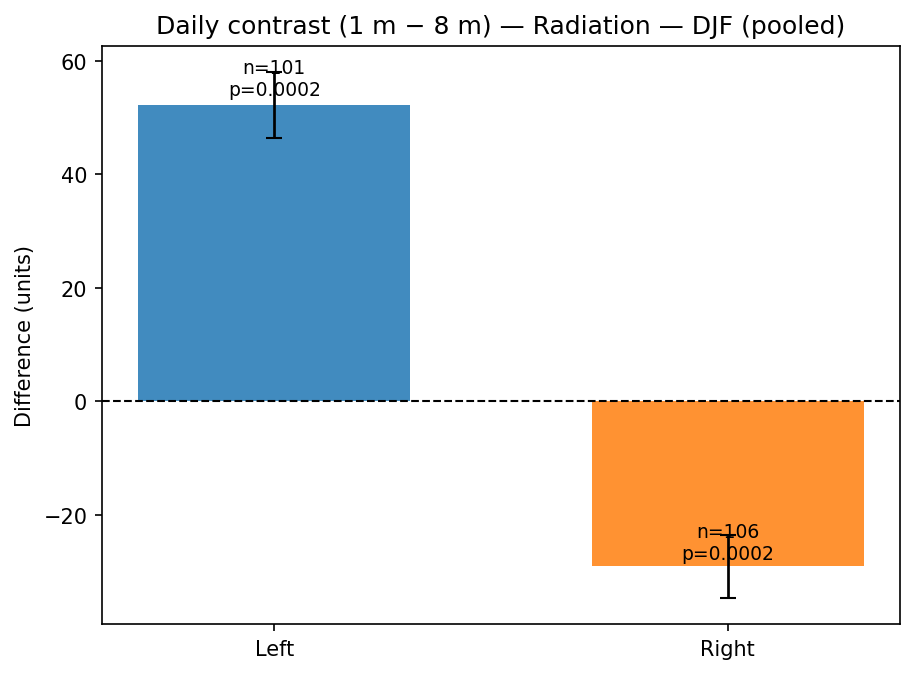

Saved: q2_figs/season/radiation_contrast_season_DJF_pooled.png | q2_figs/season/radiation_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


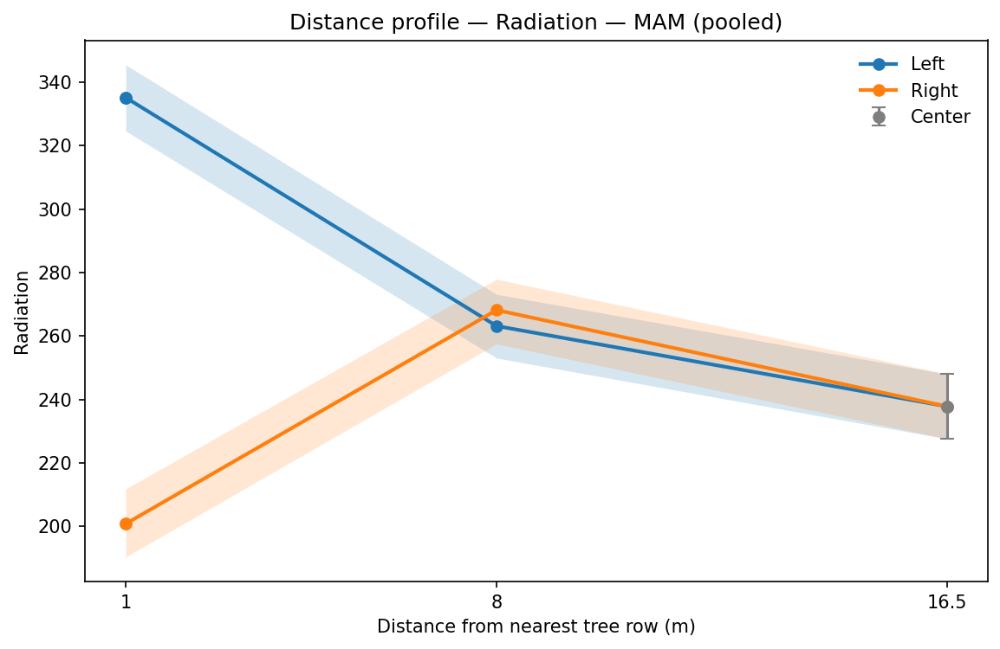

Saved: q2_figs/season/radiation_profile_season_MAM_pooled.png | q2_figs/season/radiation_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


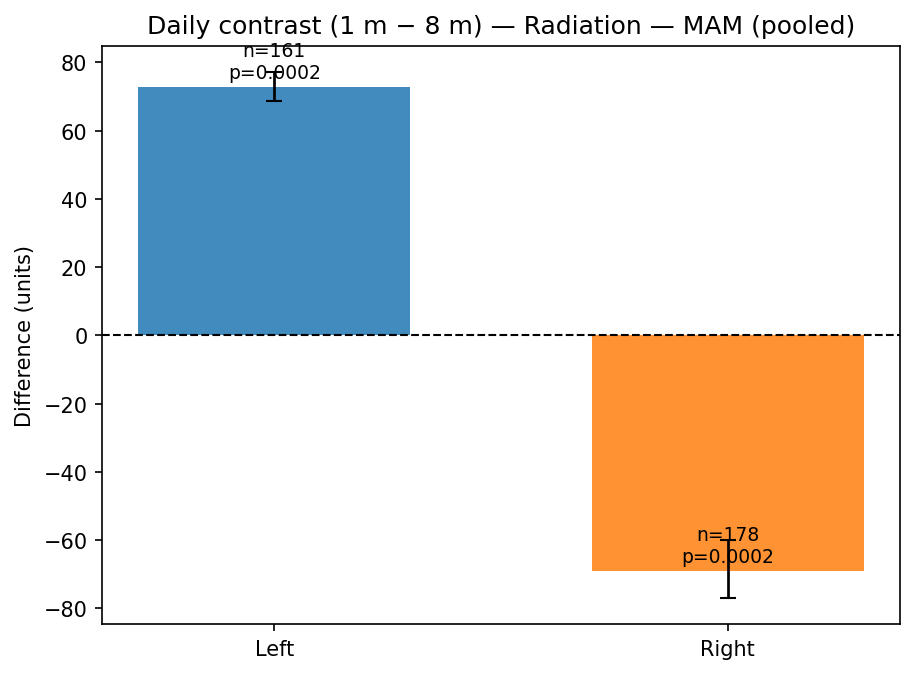

Saved: q2_figs/season/radiation_contrast_season_MAM_pooled.png | q2_figs/season/radiation_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


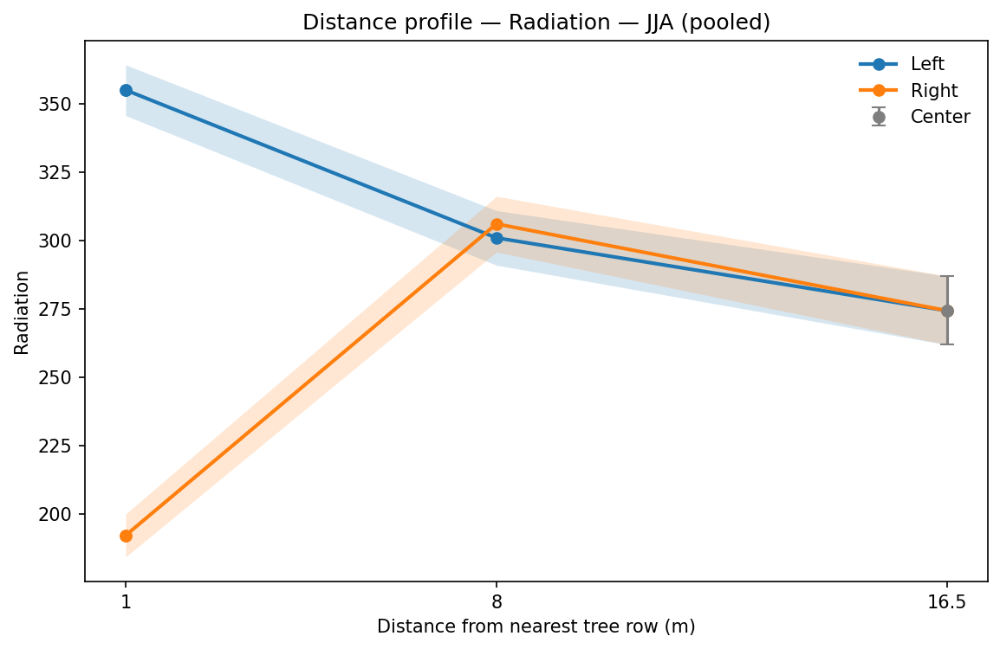

Saved: q2_figs/season/radiation_profile_season_JJA_pooled.png | q2_figs/season/radiation_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


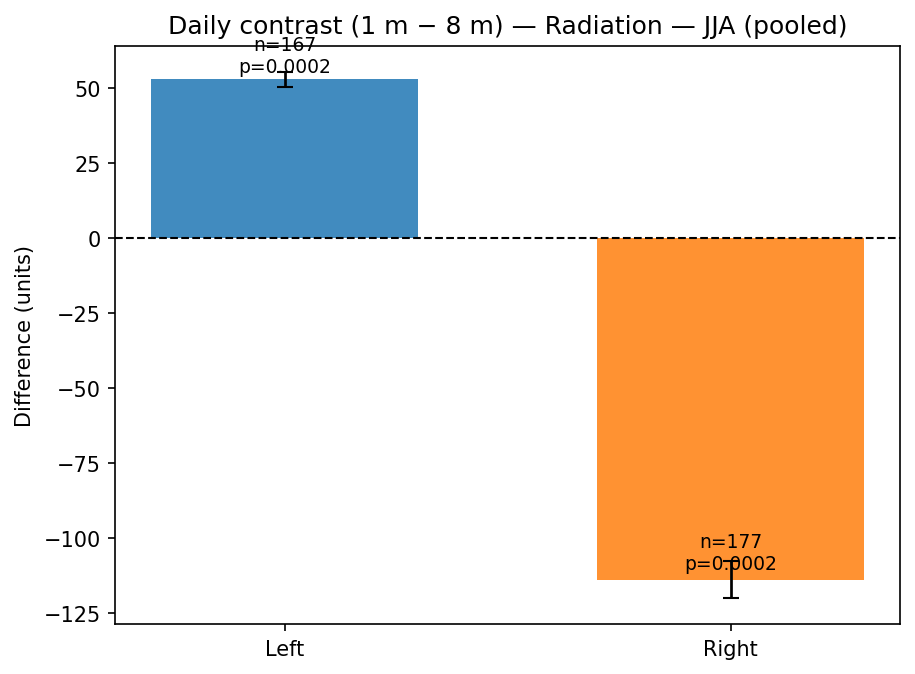

Saved: q2_figs/season/radiation_contrast_season_JJA_pooled.png | q2_figs/season/radiation_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


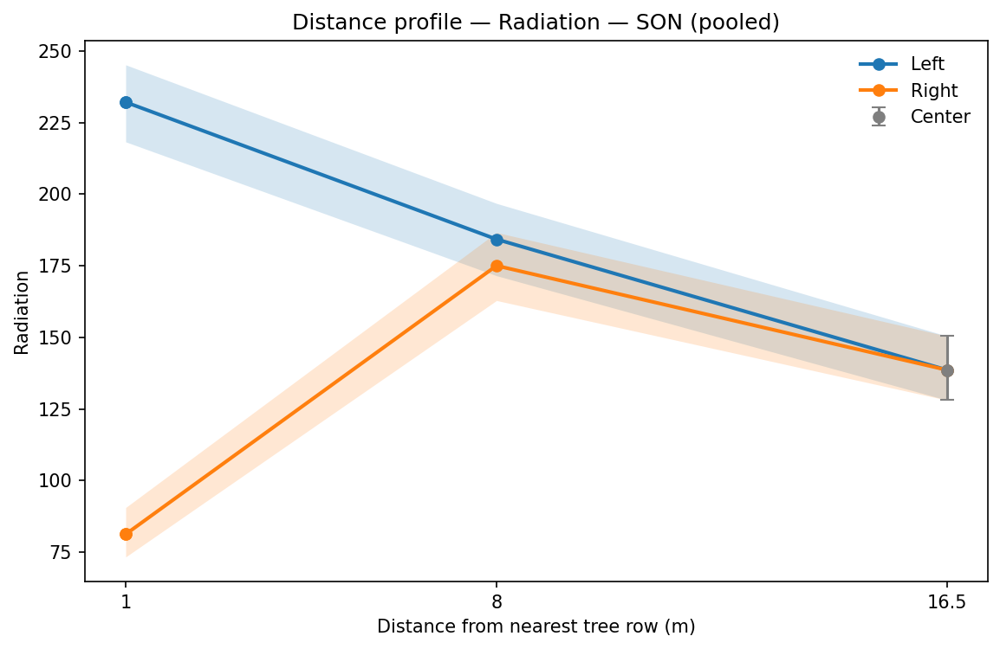

Saved: q2_figs/season/radiation_profile_season_SON_pooled.png | q2_figs/season/radiation_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


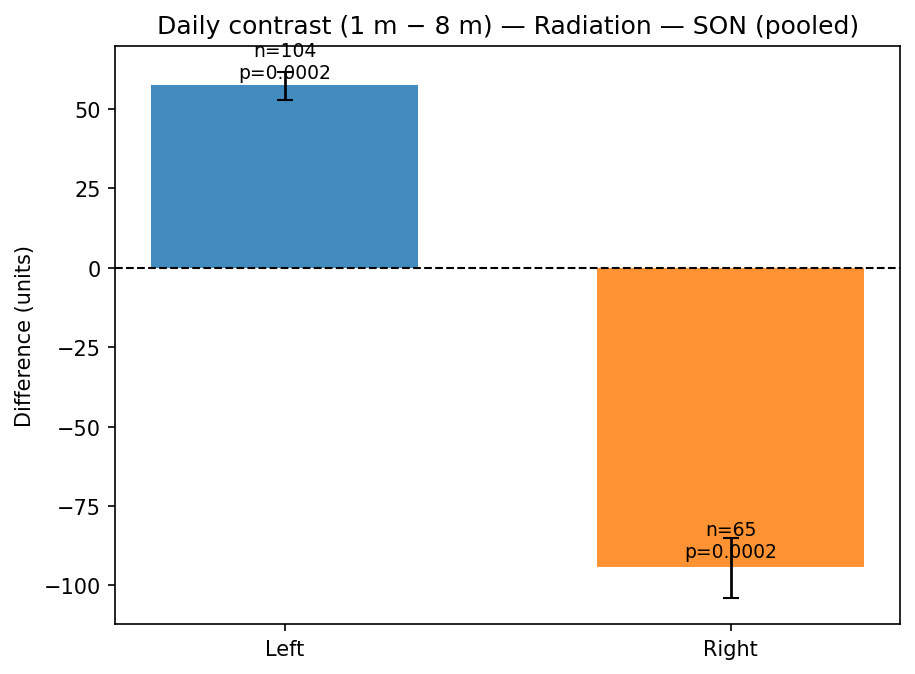

Saved: q2_figs/season/radiation_contrast_season_SON_pooled.png | q2_figs/season/radiation_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


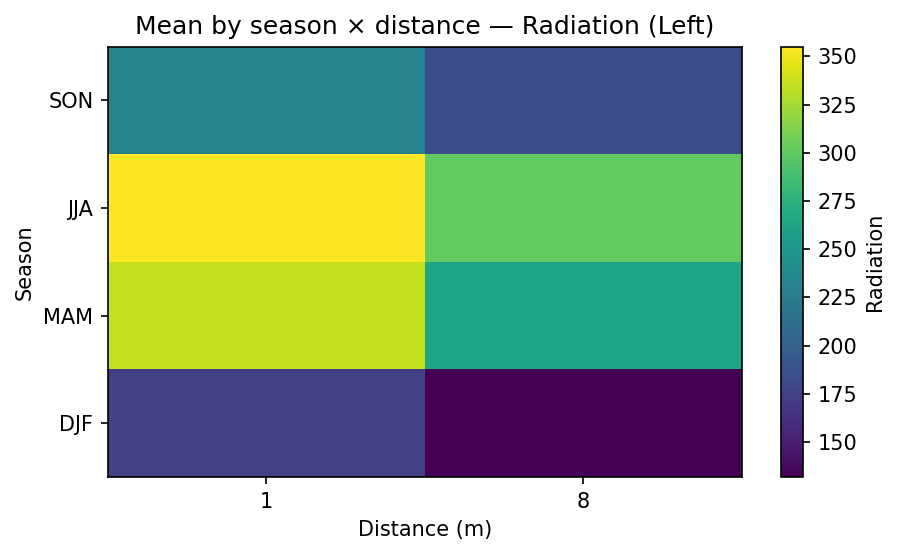

Saved: q2_figs/season/radiation_heatmap_season_L.png | q2_figs/season/radiation_heatmap_season_L.pdf


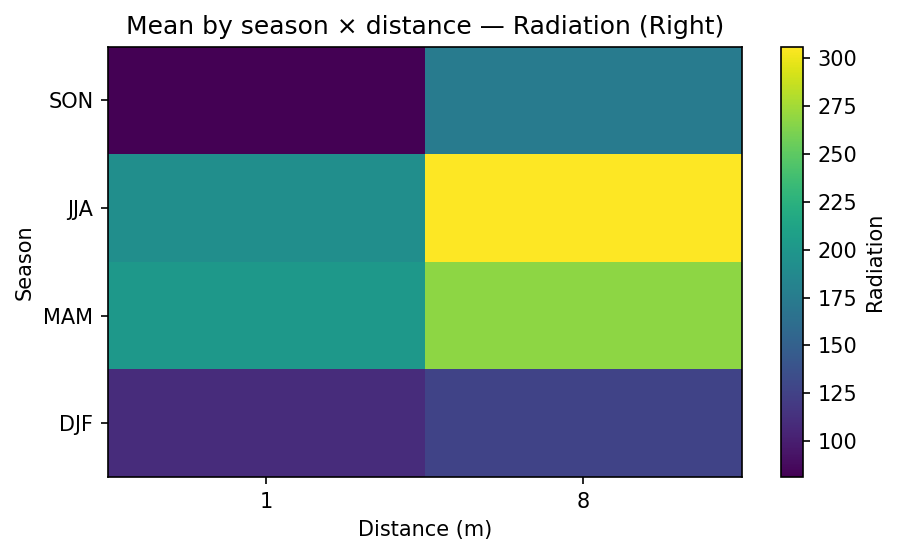

Saved: q2_figs/season/radiation_heatmap_season_R.png | q2_figs/season/radiation_heatmap_season_R.pdf


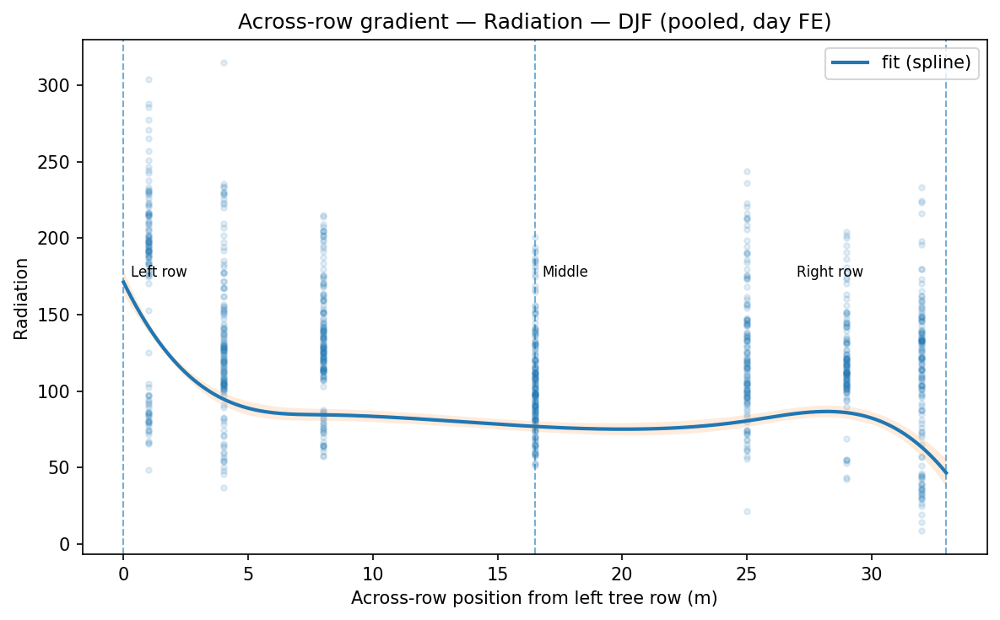

Saved: q2_figs/season/setup_continuous_radiation_season_DJF.png | q2_figs/season/setup_continuous_radiation_season_DJF.pdf


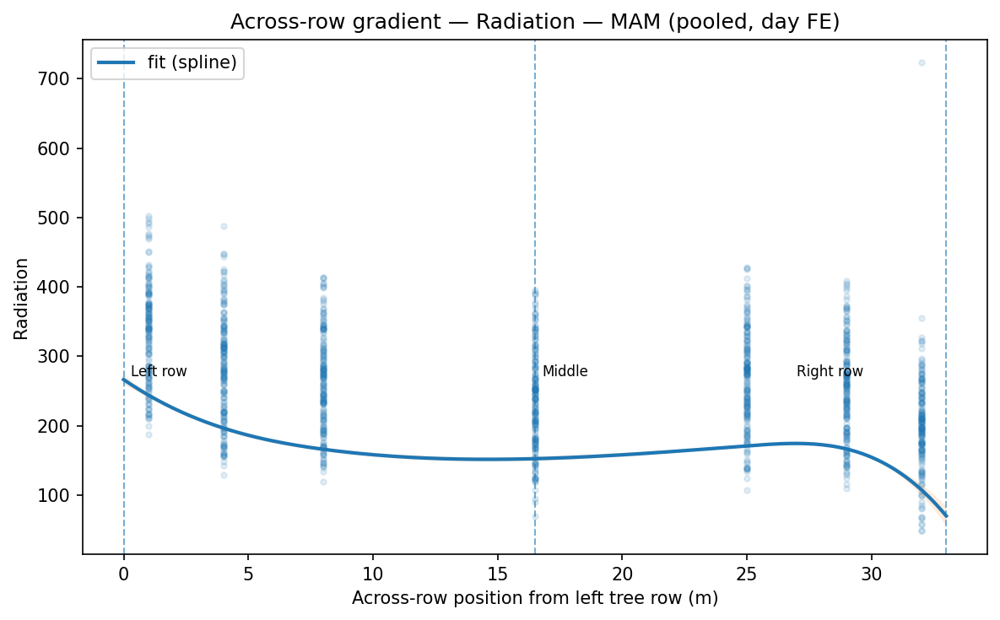

Saved: q2_figs/season/setup_continuous_radiation_season_MAM.png | q2_figs/season/setup_continuous_radiation_season_MAM.pdf


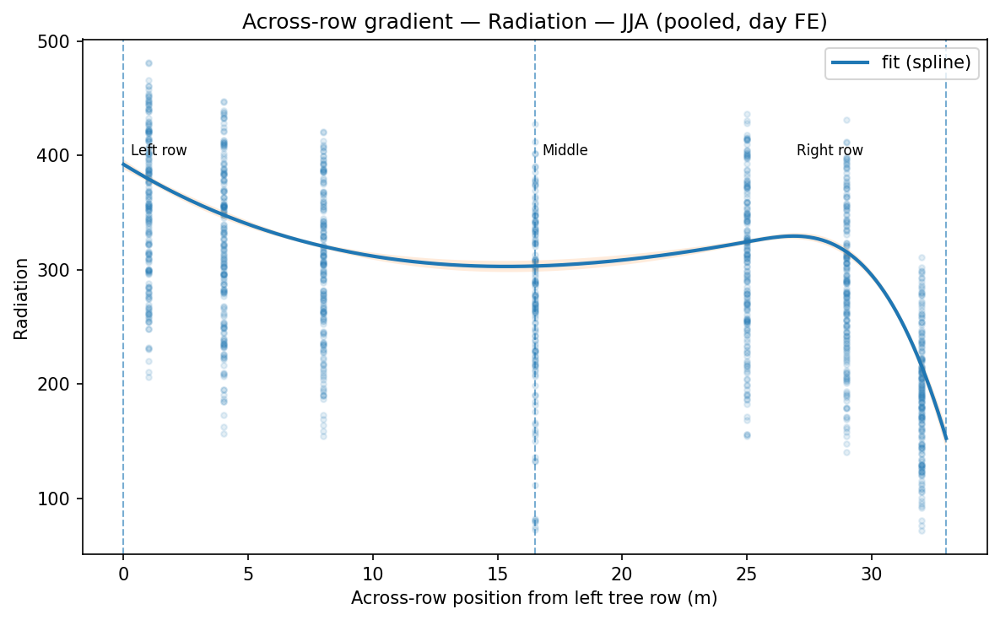

Saved: q2_figs/season/setup_continuous_radiation_season_JJA.png | q2_figs/season/setup_continuous_radiation_season_JJA.pdf


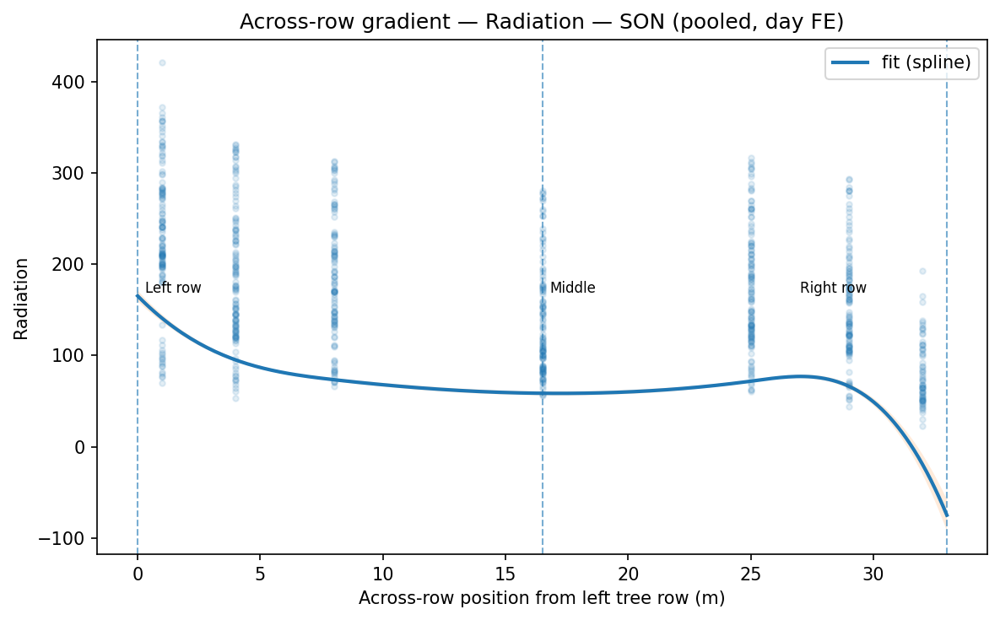

Saved: q2_figs/season/setup_continuous_radiation_season_SON.png | q2_figs/season/setup_continuous_radiation_season_SON.pdf
[season] snapped 2 → 1


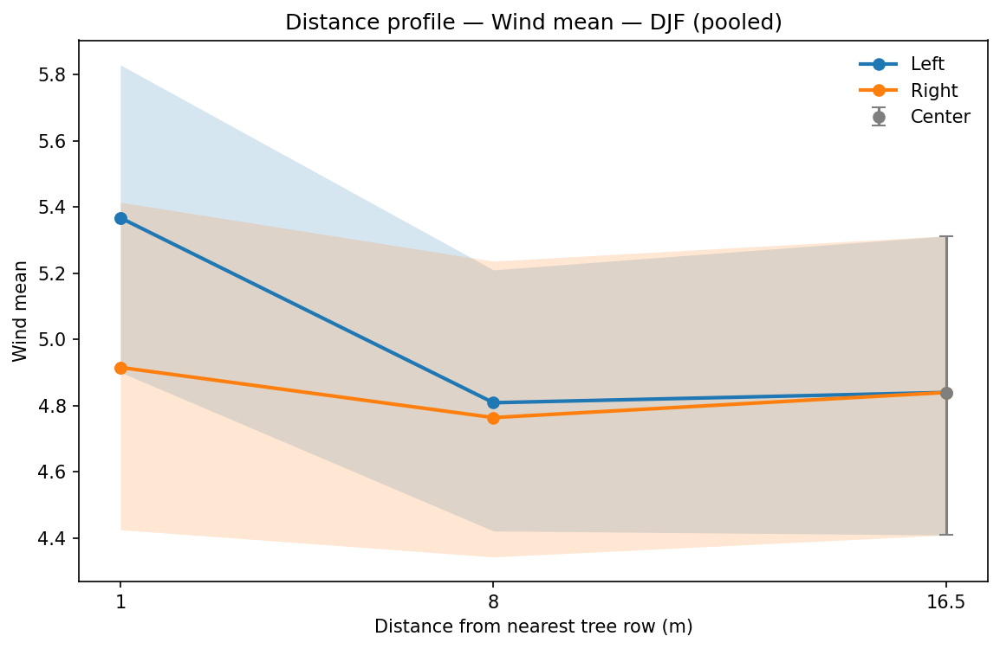

Saved: q2_figs/season/wind_mean_profile_season_DJF_pooled.png | q2_figs/season/wind_mean_profile_season_DJF_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


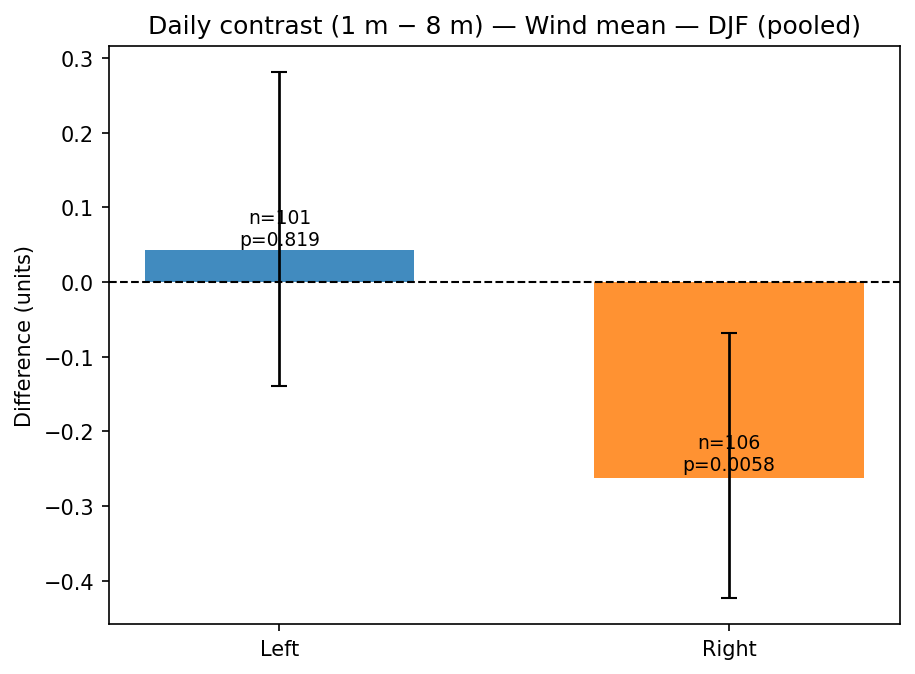

Saved: q2_figs/season/wind_mean_contrast_season_DJF_pooled.png | q2_figs/season/wind_mean_contrast_season_DJF_pooled.pdf
[season] snapped 2 → 1


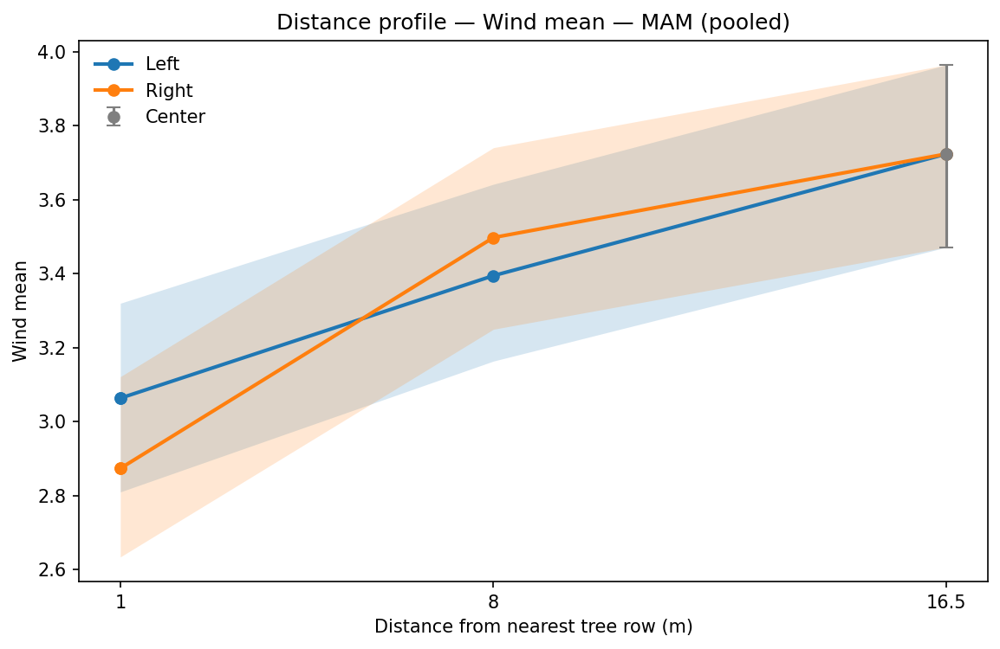

Saved: q2_figs/season/wind_mean_profile_season_MAM_pooled.png | q2_figs/season/wind_mean_profile_season_MAM_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


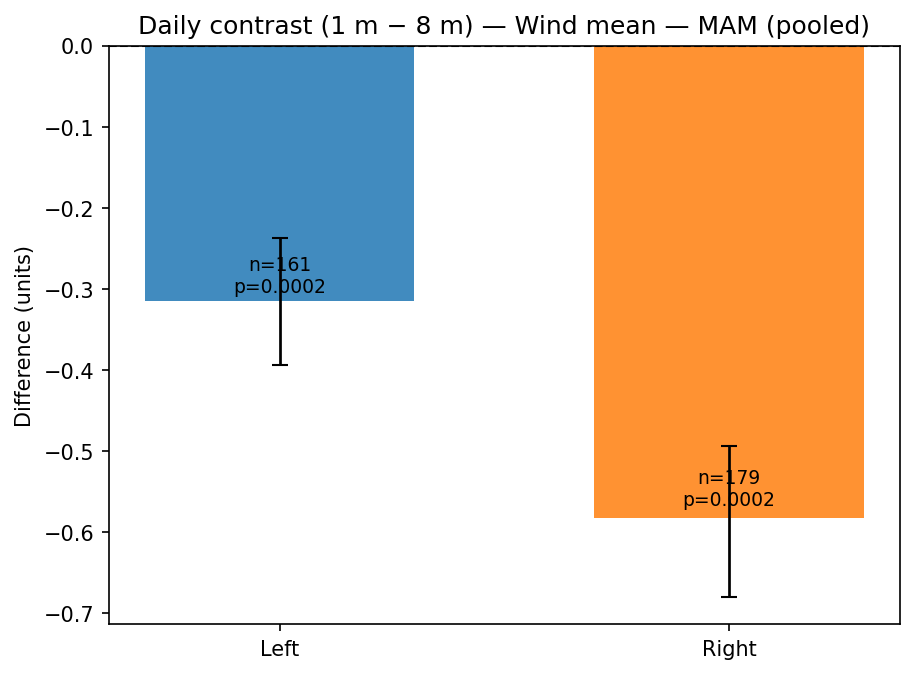

Saved: q2_figs/season/wind_mean_contrast_season_MAM_pooled.png | q2_figs/season/wind_mean_contrast_season_MAM_pooled.pdf
[season] snapped 2 → 1


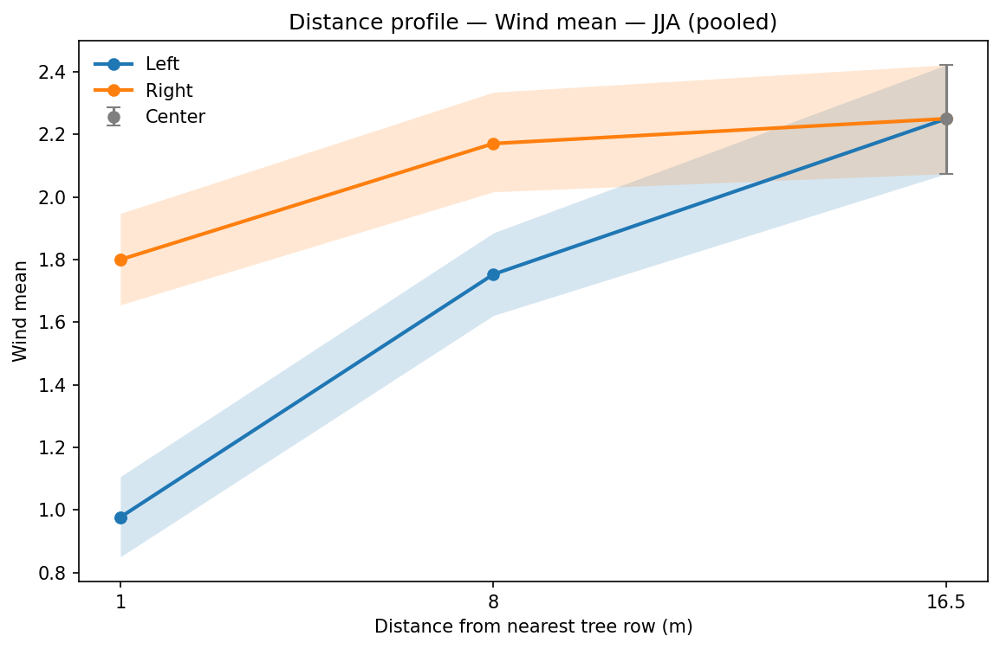

Saved: q2_figs/season/wind_mean_profile_season_JJA_pooled.png | q2_figs/season/wind_mean_profile_season_JJA_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


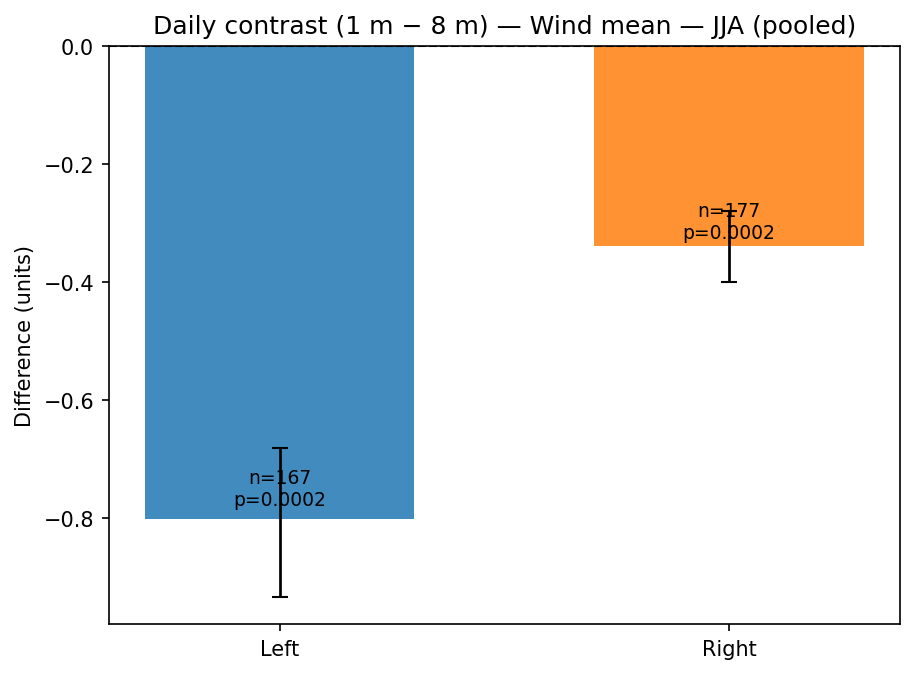

Saved: q2_figs/season/wind_mean_contrast_season_JJA_pooled.png | q2_figs/season/wind_mean_contrast_season_JJA_pooled.pdf
[season] snapped 2 → 1


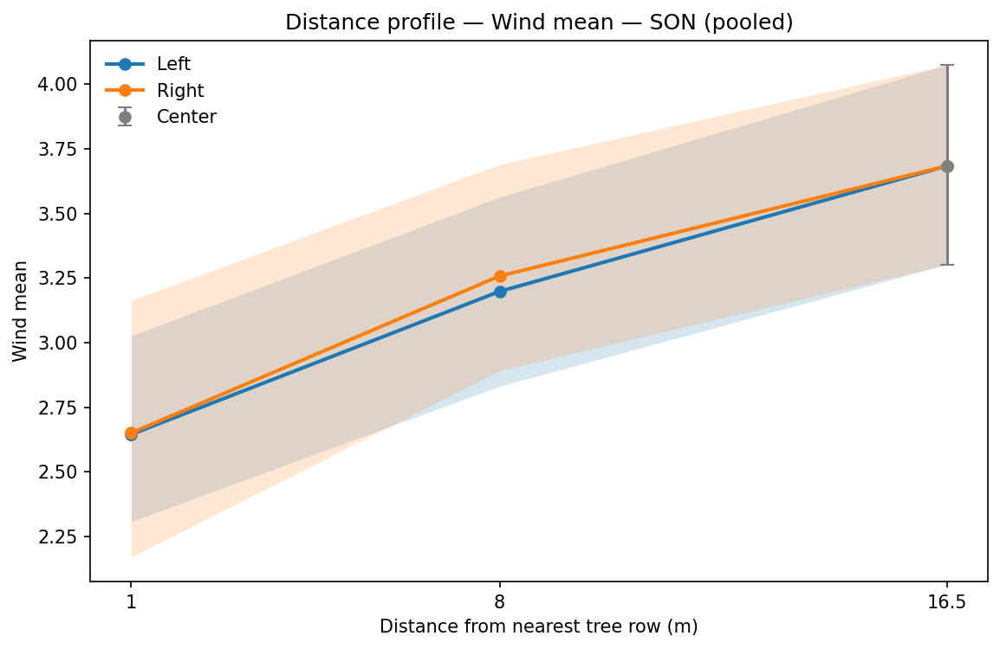

Saved: q2_figs/season/wind_mean_profile_season_SON_pooled.png | q2_figs/season/wind_mean_profile_season_SON_pooled.pdf
[season] snapped 2 → 1


/tmp/ipython-input-1647984376.py:237: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
/tmp/ipython-input-1647984376.py:241: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")


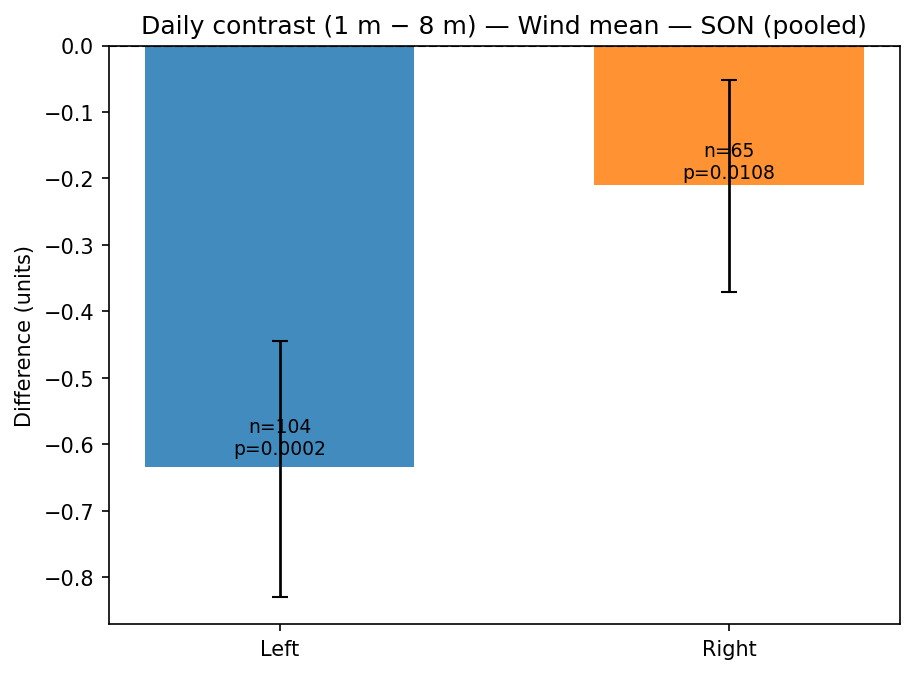

Saved: q2_figs/season/wind_mean_contrast_season_SON_pooled.png | q2_figs/season/wind_mean_contrast_season_SON_pooled.pdf
[season] snapped 2 → 1


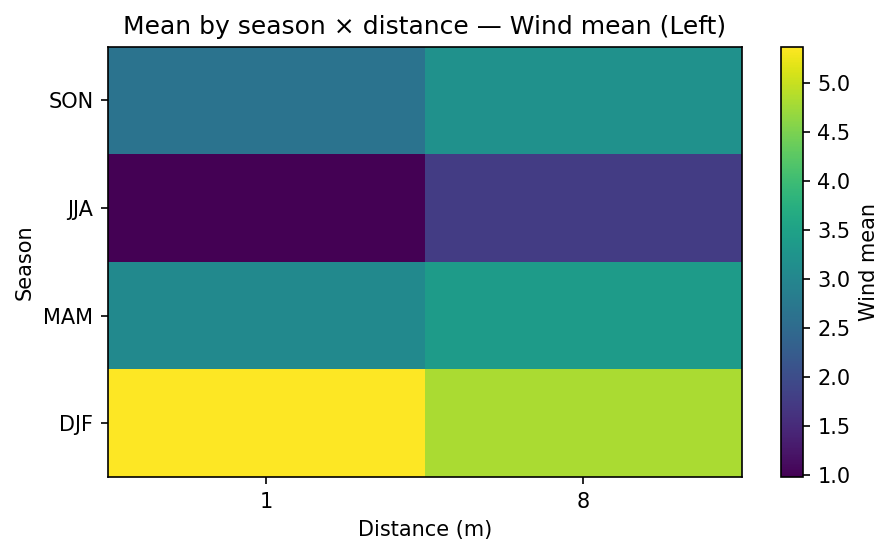

Saved: q2_figs/season/wind_mean_heatmap_season_L.png | q2_figs/season/wind_mean_heatmap_season_L.pdf


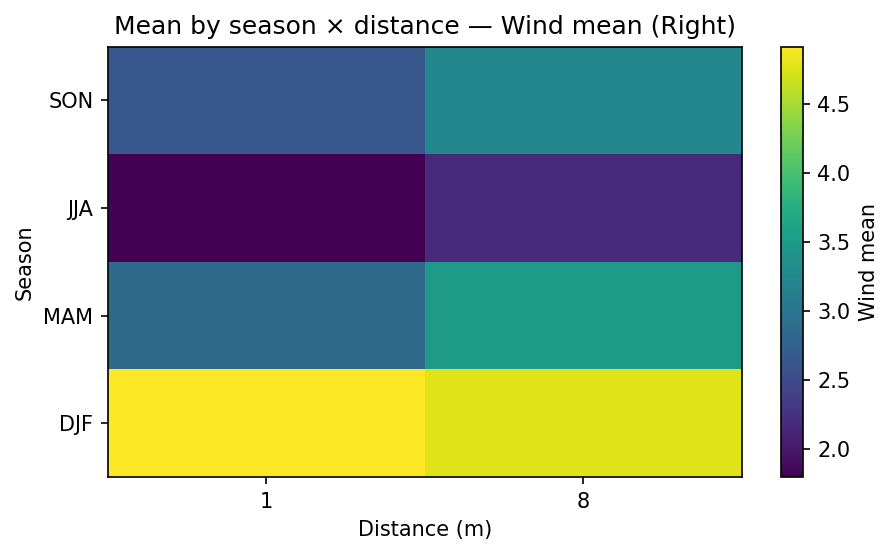

Saved: q2_figs/season/wind_mean_heatmap_season_R.png | q2_figs/season/wind_mean_heatmap_season_R.pdf


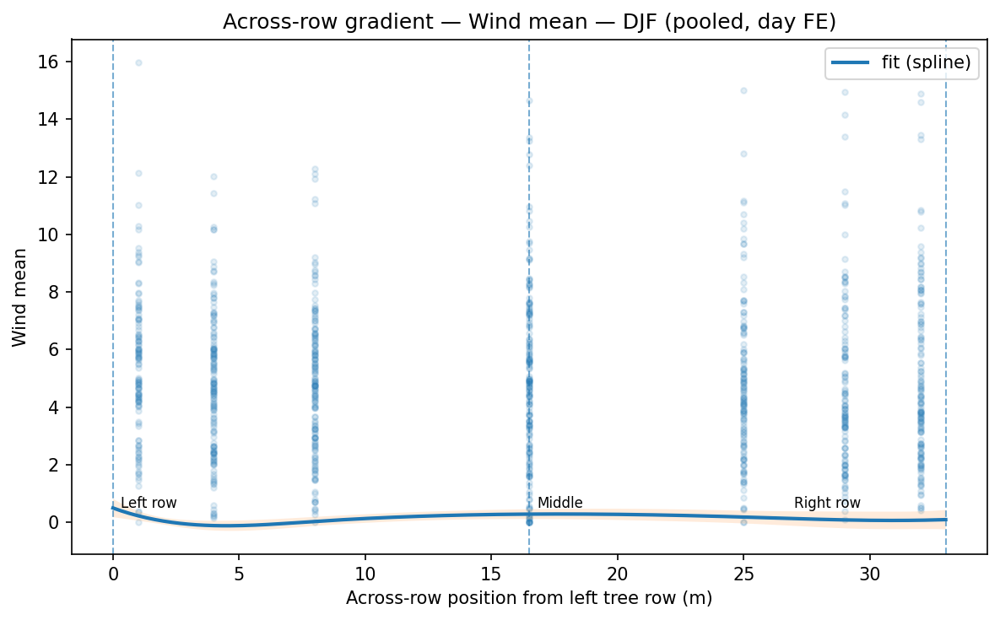

Saved: q2_figs/season/setup_continuous_wind_mean_season_DJF.png | q2_figs/season/setup_continuous_wind_mean_season_DJF.pdf


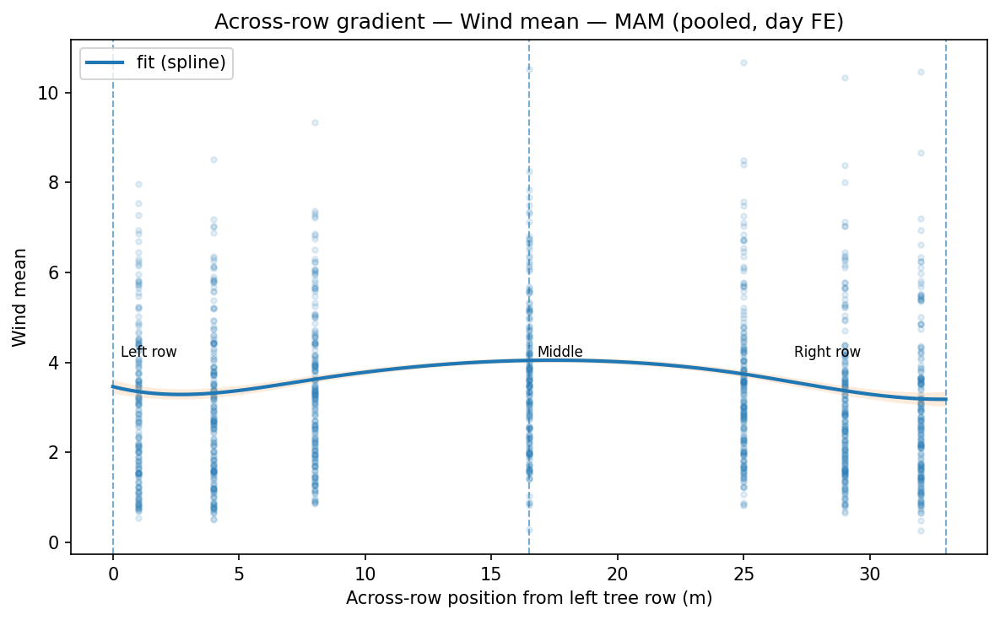

Saved: q2_figs/season/setup_continuous_wind_mean_season_MAM.png | q2_figs/season/setup_continuous_wind_mean_season_MAM.pdf


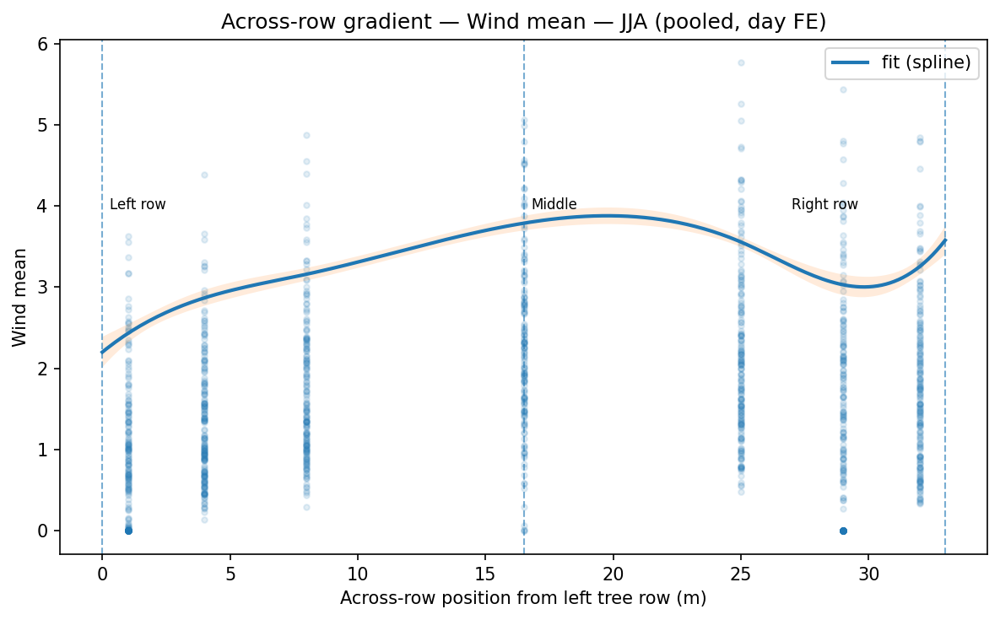

Saved: q2_figs/season/setup_continuous_wind_mean_season_JJA.png | q2_figs/season/setup_continuous_wind_mean_season_JJA.pdf


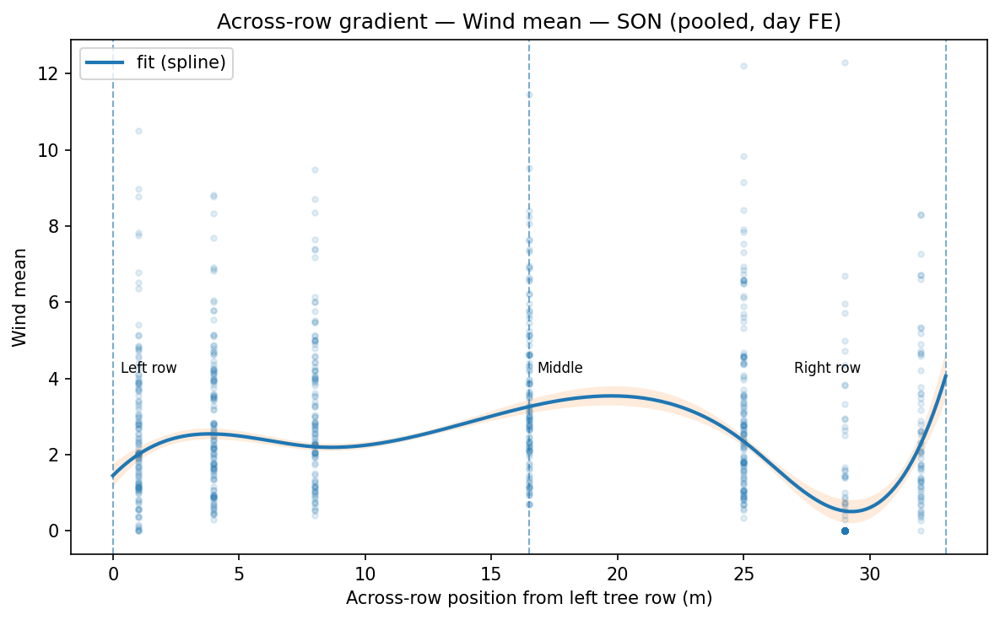

Saved: q2_figs/season/setup_continuous_wind_mean_season_SON.png | q2_figs/season/setup_continuous_wind_mean_season_SON.pdf


In [12]:
# ===================== SEASONAL PLOTTING (POOLED ACROSS NODES) =====================
# Drop this in after you've built `dn` (daily per-node means). If you don't have VAR_COLS,
# the code will detect variables automatically.

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import statsmodels.formula.api as smf
from patsy import bs

# ---- Config / output dirs ----
SEASONS = ["DJF","MAM","JJA","SON"]
CONNECT_DISTS = [1.0, 2.0, 8.0, 16.0]      # desired path; snapping handled
ROW_SPACING_M = 33.0
FIGDIR = "q2_figs"
FIGDIR_SEASON = os.path.join(FIGDIR, "season")
os.makedirs(FIGDIR, exist_ok=True)
os.makedirs(FIGDIR_SEASON, exist_ok=True)

# ---- Canonical AF geometry (used if distance_m/side missing) ----
_DIST_MAP = {"node_182":1.0, "node_187":4.0, "node_179":8.0, "node_183":16.5,
             "node_181":8.0, "node_186":4.0, "node_184":1.0}
_SIDE_MAP = {"node_182":"L","node_187":"L","node_179":"L",
             "node_183":"C","node_181":"R","node_186":"R","node_184":"R"}

COLOR_L = "#1f77b4"  # left
COLOR_R = "#ff7f0e"  # right
COLOR_C = "#7f7f7f"  # center

# ---- Minimal variable detector (used if VAR_COLS not defined) ----
def _pick(d, *cands):
    for c in cands:
        if c in d.columns: return c
    return None

def detect_var_cols(d):
    return {k:v for k,v in {
        "Soil moisture":   _pick(d, "soil_moisture__comp", "ground_humidity__comp",
                                  "ground_humidity_0__pref", "ground_humidity_0_clean", "ground_humidity_0"),
        "Soil temperature":_pick(d, "soil_temp__comp", "ground_temp__comp",
                                  "ground_temp_0__pref", "ground_temp_0_clean", "ground_temp_0"),
        "Air temp":        _pick(d, "temperature__pref", "temperature"),
        "RH":              _pick(d, "humidity__pref", "humidity"),
        "Radiation":       _pick(d, "global_radiation__pref", "global_radiation_clean", "global_radiation"),
        "Wind mean":       _pick(d, "wind_speed_mean__pref", "wind_speed_mean_clean", "wind_speed_mean"),
    }.items() if v is not None}

# ---- Guards & helpers ----
def _ensure_node_side_dist(df):
    g = df.copy()
    # date
    if "_date" not in g.columns:
        if "_ts" in g.columns:
            g["_date"] = pd.to_datetime(g["_ts"], errors="coerce").dt.floor("D")
        else:
            cand = next((c for c in g.columns if "timestamp" in c.lower()), None)
            assert cand, "No _date/_ts/timestamp column found"
            g["_date"] = pd.to_datetime(g[cand], errors="coerce").dt.floor("D")
    # node_key
    node_col = next((c for c in ("node_key","node","node_id") if c in g.columns), None)
    assert node_col, "Need a node or node_id column"
    if "node_key" not in g.columns:
        g["node_key"] = g[node_col].astype(str).apply(lambda s: s if s.startswith("node_") else f"node_{s}")
    # distance/side
    if "distance_m" not in g.columns or g["distance_m"].isna().all():
        g["distance_m"] = g["node_key"].map(_DIST_MAP).astype(float)
    if "side" not in g.columns or g["side"].isna().all():
        g["side"] = g["node_key"].map(_SIDE_MAP).astype("category")
    return g

def _add_season_cols(d):
    g = d.copy()
    dt = pd.to_datetime(g["_date"], errors="coerce")
    m = dt.dt.month
    g["season"] = np.where(m.isin([12,1,2]), "DJF",
                   np.where(m.isin([3,4,5]), "MAM",
                   np.where(m.isin([6,7,8]), "JJA", "SON")))
    g["season_year"] = dt.dt.year
    g.loc[m==12, "season_year"] = g.loc[m==12, "season_year"] + 1
    return g

def _snap_map(present_dists, desired=CONNECT_DISTS):
    present = np.array(sorted({float(x) for x in present_dists if np.isfinite(x)}), dtype=float)
    if present.size == 0: return {}
    mp = {}
    for t in desired:
        mp[float(t)] = float(present[np.abs(present - float(t)).argmin()])
        if abs(mp[float(t)] - float(t)) > 0.51:
            print(f"[season] snapped {t:g} → {mp[float(t)]:g}")
    return mp

def _mean_ci(vals, B=2000, seed=42):
    v = pd.to_numeric(pd.Series(vals), errors="coerce").to_numpy(float)
    v = v[np.isfinite(v)]
    if v.size == 0: return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    boots = v[rng.integers(0, v.size, (B, v.size))].mean(axis=1)
    lo, hi = np.percentile(boots, [2.5, 97.5])
    return float(v.mean()), float(lo), float(hi)

def _perm_pvalue(diffs, reps=5000, seed=123):
    v = np.asarray(diffs, float)
    v = v[np.isfinite(v)]
    n = v.size
    if n < 5: return np.nan
    rng = np.random.default_rng(seed)
    signs = rng.choice([-1,1], size=(reps, n))
    Tobs = v.mean()
    Tperm = (v * signs).mean(axis=1)
    return ((np.abs(Tperm) >= abs(Tobs)).mean() * reps + 1) / (reps + 1)

def _unique_order_present(agg, snapped_list):
    present = sorted(agg["distance_m"].astype(float).unique())
    out = []
    for x in snapped_list:
        if any(np.isclose(x, p) for p in present) and not any(np.isclose(x, y) for y in out):
            out.append(float(x))
    return out if out else present

# ---- Core: node-equal daily → pooled per day ----
def _pooled_per_day(d, ycol, extra_keys=None):
    """
    Daily, node-equal pooling.
    - First: mean per (_date, node_key, side, distance_m, *extra_keys)
    - Then:  mean across node_key (equal-weight pooling) keeping other keys.
    """
    keys = ["_date", "node_key", "side", "distance_m"]
    if extra_keys:
        for k in extra_keys:
            if k not in keys:
                keys.append(k)

    per_node_day = d.groupby(keys, observed=True)[ycol].mean().reset_index()
    pool_keys = [k for k in keys if k != "node_key"]
    per_day = per_node_day.groupby(pool_keys, observed=True)[ycol].mean().reset_index()
    return per_day

# ================= Plots =================

def plot_distance_profiles_season(dsrc, ycol, label, season, season_year=None):
    """Lines connect 1→2→8 and end at center (≈16). Node-pooled."""
    d = _add_season_cols(_ensure_node_side_dist(dsrc))
    d = d[d["season"].eq(season)].copy()
    if season_year is not None:
        d = d[d["season_year"].eq(int(season_year))].copy()
    need = ["_date","node_key","side","distance_m", ycol]
    d = d[need].dropna()
    if d.empty:
        print(f"[profiles-season] Skip {label} {season}: no data"); return

    per_day = _pooled_per_day(d, ycol)
    present = per_day["distance_m"].astype(float).unique()
    snap = _snap_map(present, CONNECT_DISTS)

    # Center (snapped target = last of CONNECT_DISTS)
    center_snap = snap.get(CONNECT_DISTS[-1], CONNECT_DISTS[-1])
    cc = per_day[(per_day["side"]=="C") & np.isclose(per_day["distance_m"].astype(float), center_snap)]
    c_mu=c_lo=c_hi=np.nan
    if len(cc): c_mu,c_lo,c_hi = _mean_ci(cc[ycol])

    rows=[]
    for side in ("L","R"):
        g = per_day[per_day["side"]==side]
        for t in CONNECT_DISTS[:-1]:  # 1,2,8
            sdist = snap.get(t, t)
            gg = g[np.isclose(g["distance_m"].astype(float), sdist)]
            if len(gg):
                mu,lo,hi = _mean_ci(gg[ycol]); rows.append((side, float(sdist), mu, lo, hi))
        if np.isfinite(c_mu):
            rows.append((side, float(center_snap), c_mu, c_lo, c_hi))

    agg = pd.DataFrame(rows, columns=["side","distance_m","mean","lo","hi"])
    if agg.empty:
        print(f"[profiles-season] Skip {label} {season}: distances missing"); return

    desired = _unique_order_present(agg, [snap.get(x, x) for x in CONNECT_DISTS])
    agg["distance_m"] = pd.Categorical(agg["distance_m"].astype(float), categories=desired, ordered=True)
    agg = agg.sort_values(["side","distance_m"])

    plt.figure(figsize=(7.8,5.1))
    for side, color in [("L", COLOR_L), ("R", COLOR_R)]:
        g = agg[agg["side"]==side]
        if len(g):
            x = g["distance_m"].astype(float).values
            plt.plot(x, g["mean"], marker="o", lw=2, color=color, label=("Left" if side=="L" else "Right"))
            plt.fill_between(x, g["lo"], g["hi"], alpha=0.18, color=color, linewidth=0)
    if np.isfinite(c_mu):
        plt.errorbar([float(center_snap)], [c_mu], yerr=[[c_mu-c_lo],[c_hi-c_mu]],
                     fmt="o", color=COLOR_C, ecolor=COLOR_C, capsize=4, label="Center")

    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.xticks(desired, [int(x) if abs(x-round(x))<1e-9 else f"{x:g}" for x in desired])
    title = f"Distance profile — {label} — {season} (pooled)"
    if season_year is not None: title += f" — season-year {int(season_year)}"
    plt.title(title); plt.xlabel("Distance from nearest tree row (m)"); plt.ylabel(label)
    plt.legend(frameon=False); plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_profile_season_{season}" + (f"_{int(season_year)}" if season_year else "") + "_pooled"
    out_png = os.path.join(FIGDIR_SEASON, base + ".png")
    out_pdf = os.path.join(FIGDIR_SEASON, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

def plot_contrast_bars_season(dsrc, ycol, label, season, season_year=None):
    """Daily paired diffs (1 m − 8 m) per side, node-pooled, with CI + sign-permutation p."""
    d = _add_season_cols(_ensure_node_side_dist(dsrc))
    d = d[d["season"].eq(season)].copy()
    if season_year is not None:
        d = d[d["season_year"].eq(int(season_year))].copy()
    need = ["_date","node_key","side","distance_m", ycol]
    d = d[need].dropna()
    if d.empty:
        print(f"[contrast-season] Skip {label} {season}: no data"); return

    per_day = _pooled_per_day(d, ycol)
    present = per_day["distance_m"].astype(float).unique()
    snap = _snap_map(present, CONNECT_DISTS)

    d1 = per_day[np.isclose(per_day["distance_m"].astype(float), snap.get(1.0, 1.0))]
    d8 = per_day[np.isclose(per_day["distance_m"].astype(float), snap.get(8.0, 8.0))]

    rows=[]
    for side in ("L","R"):
        g1 = d1[d1["side"]==side].set_index("_date")[ycol]
        g8 = d8[d8["side"]==side].set_index("_date")[ycol]
        idx = g1.index.intersection(g8.index)
        diffs = (g1.loc[idx] - g8.loc[idx]).dropna().values
        if diffs.size:
            mu,lo,hi = _mean_ci(diffs); p = _perm_pvalue(diffs)
            rows.append((side, diffs.size, mu, lo, hi, p))
    if not rows:
        print(f"[contrast-season] Skip {label} {season}: no paired 1m/8m days"); return

    tab = pd.DataFrame(rows, columns=["side","n_days","mean","lo","hi","p"])
    plt.figure(figsize=(6.2,4.6))
    for i, side in enumerate(["L","R"]):
        r = tab[tab["side"]==side]
        if len(r):
            mu,lo,hi,p = float(r["mean"]), float(r["lo"]), float(r["hi"]), float(r["p"])
            col = COLOR_L if side=="L" else COLOR_R
            plt.bar(i, mu, color=col, alpha=0.85, width=0.6)
            plt.errorbar(i, mu, yerr=[[mu-lo],[hi-mu]], ecolor="black", capsize=4, lw=1.3, fmt="none")
            txt = f"n={int(r['n_days'])}" + (f"\np={p:.3g}" if np.isfinite(p) else "")
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), txt, ha="center", va="bottom", fontsize=9)
    ttl = f"Daily contrast (1 m − 8 m) — {label} — {season} (pooled)"
    if season_year is not None: ttl += f" — season-year {int(season_year)}"
    plt.title(ttl); plt.ylabel("Difference (units)"); plt.xticks([0,1], ["Left","Right"])
    plt.axhline(0, color="k", lw=1, ls="--"); plt.tight_layout()
    base = f"{label.replace(' ','_').lower()}_contrast_season_{season}" + (f"_{int(season_year)}" if season_year else "") + "_pooled"
    out_png = os.path.join(FIGDIR_SEASON, base + ".png")
    out_pdf = os.path.join(FIGDIR_SEASON, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

def plot_season_distance_heatmap(dsrc, ycol, label):
    """Season × distance heatmap (per side), node-pooled (keeps `season`)."""
    d = _add_season_cols(_ensure_node_side_dist(dsrc))
    need = ["_date","node_key","side","distance_m","season", ycol]
    d = d[need].dropna()
    if d.empty:
        print(f"[heatmap-season] Skip {label}: no data"); return

    per_day = _pooled_per_day(d, ycol, extra_keys=["season"])
    present = per_day["distance_m"].astype(float).unique()
    snap = _snap_map(present, CONNECT_DISTS)
    cols = [snap.get(x, x) for x in CONNECT_DISTS]
    cols = [c for i, c in enumerate(cols) if c not in cols[:i]]  # dedup

    for side, color in [("L", COLOR_L), ("R", COLOR_R)]:
        g = per_day[per_day["side"]==side]
        if g.empty:
            continue
        M = g.groupby(["season","distance_m"], observed=True)[ycol].mean().reset_index()
        piv = M.pivot(index="season", columns="distance_m", values=ycol)
        keep = [c for c in cols if c in piv.columns]
        if not keep:
            print(f"[heatmap-season] {label} ({side}) has no snapped distances present.");
            continue
        piv = piv.reindex(index=SEASONS, columns=keep)

        plt.figure(figsize=(6.2,3.8))
        im = plt.imshow(piv.values, aspect="auto", origin="lower")
        plt.xticks(np.arange(len(keep)), [int(c) if abs(c-round(c))<1e-9 else f"{c:g}" for c in keep])
        plt.yticks(np.arange(len(SEASONS)), SEASONS)
        plt.ylabel("Season"); plt.xlabel("Distance (m)")
        plt.title(f"Mean by season × distance — {label} ({'Left' if side=='L' else 'Right'})")
        cbar = plt.colorbar(im); cbar.ax.set_ylabel(label)
        base = f"{label.replace(' ','_').lower()}_heatmap_season_{'L' if side=='L' else 'R'}"
        out_png = os.path.join(FIGDIR_SEASON, base + ".png")
        out_pdf = os.path.join(FIGDIR_SEASON, base + ".pdf")
        plt.tight_layout(); plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
        print("Saved:", out_png, "|", out_pdf)

def plot_acrossrow_curve_season(dsrc, ycol, label, season, season_year=None, df_spline=5):
    """Across-row smooth curve within a season (day fixed effects, clustered by day)."""
    d = _add_season_cols(_ensure_node_side_dist(dsrc))
    d = d[d["season"].eq(season)].copy()
    if season_year is not None:
        d = d[d["season_year"].eq(int(season_year))].copy()
    if d.empty:
        print(f"[across-season] Skip {label} {season}: no data"); return

    d["across_pos"] = np.where(d["side"].astype(str)=="L", d["distance_m"],
                        np.where(d["side"].astype(str)=="R", ROW_SPACING_M - d["distance_m"], ROW_SPACING_M/2.0))
    d = d[["across_pos","_date", ycol]].dropna()
    if len(d) < 50:
        print(f"[across-season] Skip {label} {season}: too few points"); return
    d["day_str"] = pd.to_datetime(d["_date"]).dt.strftime("%Y-%m-%d")

    xgrid = np.linspace(0.0, ROW_SPACING_M, 200)
    Xnew = pd.DataFrame({"across_pos": xgrid, "day_str": [d["day_str"].iloc[0]]*len(xgrid)})

    try:
        fit = smf.ols(
            f"{ycol} ~ bs(across_pos, df={df_spline}, degree=3, include_intercept=False, lower_bound=0, upper_bound={ROW_SPACING_M}) + C(day_str)",
            data=d
        ).fit(cov_type="cluster", cov_kwds={"groups": d["day_str"]})
        sf = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = sf["mean"].values, sf["mean_ci_lower"].values, sf["mean_ci_upper"].values
        method = "spline"
    except Exception:
        fit = smf.ols(f"{ycol} ~ I(across_pos) + I(across_pos**2) + I(across_pos**3) + C(day_str)", data=d) \
              .fit(cov_type="cluster", cov_kwds={"groups": d["day_str"]})
        sf = fit.get_prediction(Xnew).summary_frame(alpha=0.05)
        yhat, lo, hi = sf["mean"].values, sf["mean_ci_lower"].values, sf["mean_ci_upper"].values
        method = "poly"

    plt.figure(figsize=(8,5))
    samp = d if len(d) <= 8000 else d.sample(8000, random_state=42)
    plt.scatter(samp["across_pos"], samp[ycol], s=10, alpha=0.12)
    plt.plot(xgrid, yhat, lw=2, label=f"fit ({method})")
    plt.fill_between(xgrid, lo, hi, alpha=0.15, linewidth=0)
    for x, st in [(0,"Left row"), (ROW_SPACING_M/2,"Middle"), (ROW_SPACING_M,"Right row")]:
        plt.axvline(x, ls="--", lw=1, alpha=0.6);
        plt.text(x + (0.3 if x==0 else -6 if x==ROW_SPACING_M else 0.3),
                 np.nanmax(yhat) + 0.02*(abs(np.nanmax(yhat))+1e-9), st, fontsize=8)
    ttl = f"Across-row gradient — {label} — {season} (pooled, day FE)"
    if season_year is not None: ttl += f" — season-year {int(season_year)}"
    plt.title(ttl); plt.xlabel("Across-row position from left tree row (m)"); plt.ylabel(label)
    plt.legend(); plt.tight_layout()
    base = f"setup_continuous_{label.replace(' ','_').lower()}_season_{season}" + (f"_{int(season_year)}" if season_year else "")
    out_png = os.path.join(FIGDIR_SEASON, base + ".png")
    out_pdf = os.path.join(FIGDIR_SEASON, base + ".pdf")
    plt.savefig(out_png, dpi=300); plt.savefig(out_pdf); plt.show()
    print("Saved:", out_png, "|", out_pdf)

# ================= RUNNER =================
# Choose the source table: `dn` (daily per-node means) is ideal.
_src = dn.copy()  # if you want to run directly on `af`, it also works.

# Variable mapping (use your existing VAR_COLS if set; else detect)
if 'VAR_COLS' not in globals():
    VAR_COLS = detect_var_cols(_src)
print("Variables found:", VAR_COLS)

for label, col in VAR_COLS.items():
    for s in SEASONS:
        plot_distance_profiles_season(_src, col, label, season=s, season_year=None)
        plot_contrast_bars_season(_src, col, label, season=s, season_year=None)
    plot_season_distance_heatmap(_src, col, label)
    for s in SEASONS:
        plot_acrossrow_curve_season(_src, col, label, season=s, season_year=None)


In [13]:
# === One-off: collect all seasonal PDFs into a clean folder ===
import os, glob, shutil

SRC = "q2_figs/season"
DST = "q2_figs/season_pdf"
os.makedirs(DST, exist_ok=True)

pdfs = glob.glob(os.path.join(SRC, "*.pdf"))
for p in pdfs:
    shutil.copy2(p, os.path.join(DST, os.path.basename(p)))

print(f"Copied {len(pdfs)} PDFs to {DST}")


Copied 84 PDFs to q2_figs/season_pdf


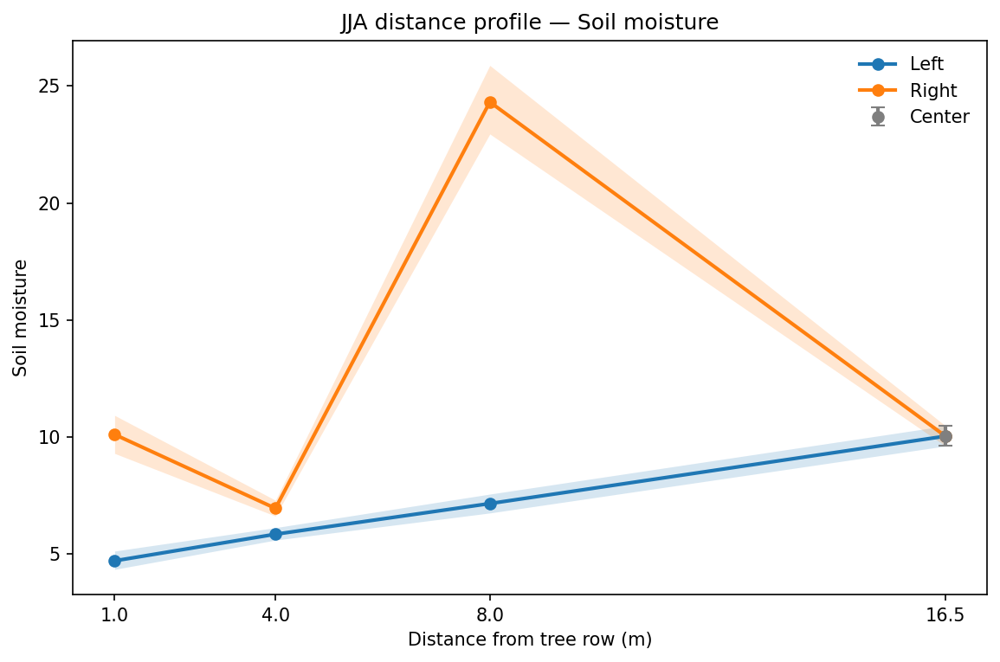

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_profile.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_profile.pdf


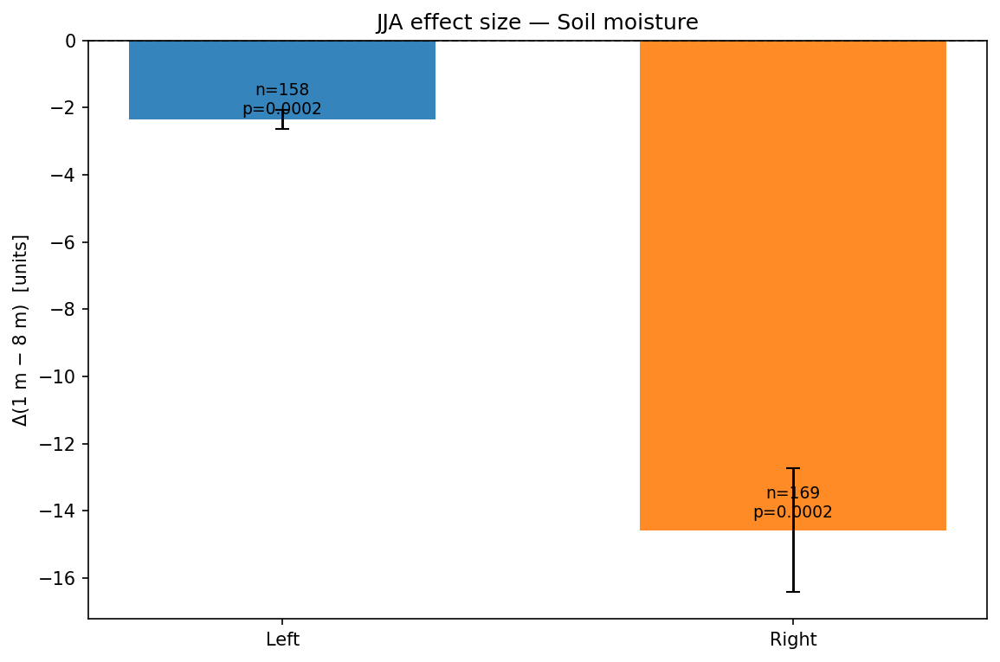

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_delta_1v8.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_delta_1v8.pdf


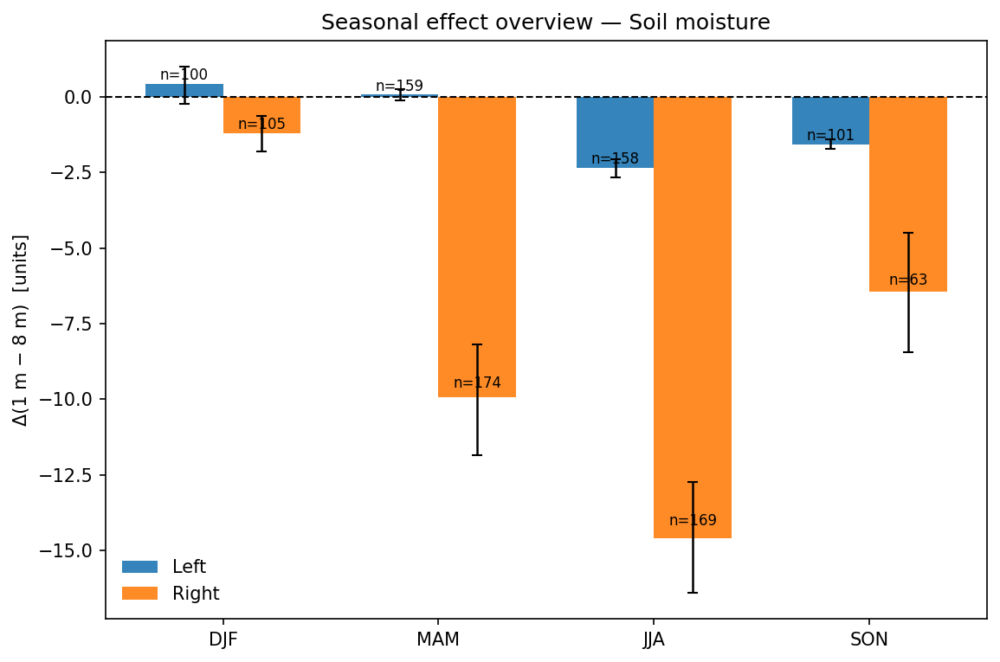

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_season_overview_1v8.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/soil_moisture/summary_JJA.csv


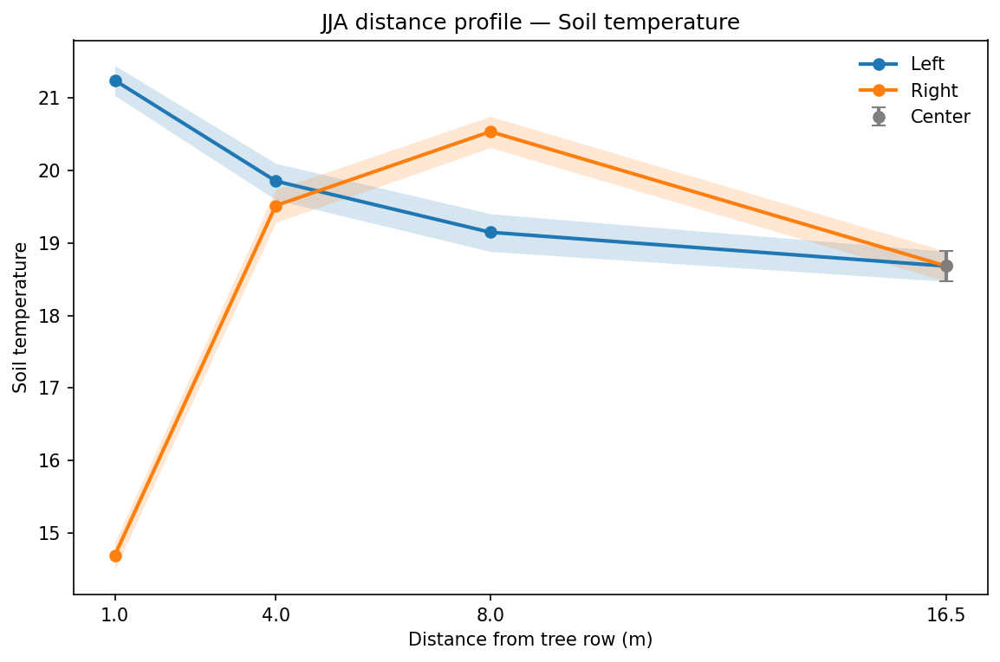

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_profile.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_profile.pdf


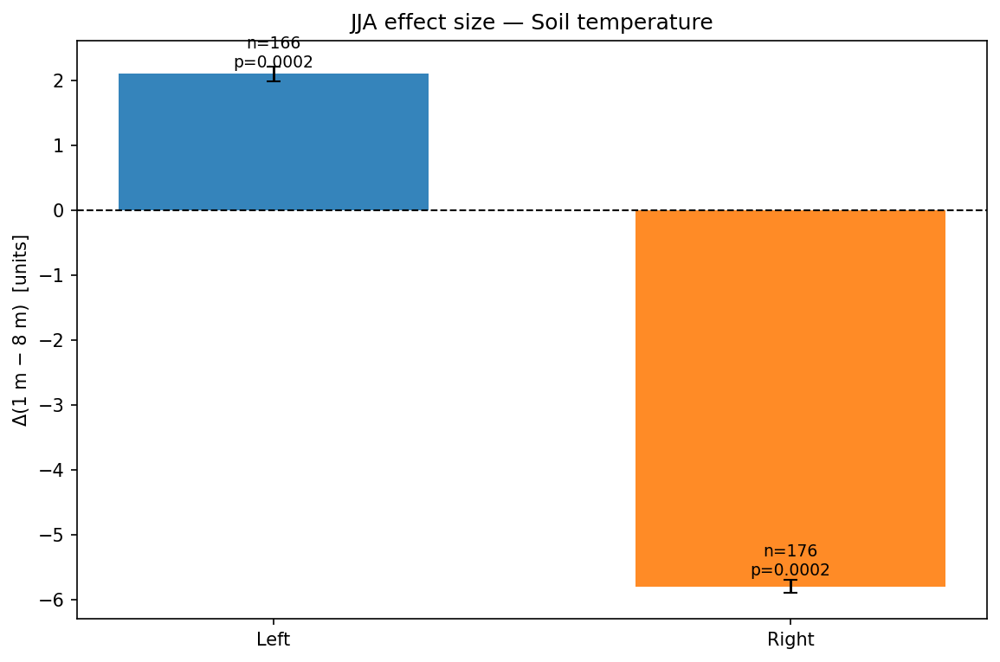

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_delta_1v8.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_delta_1v8.pdf


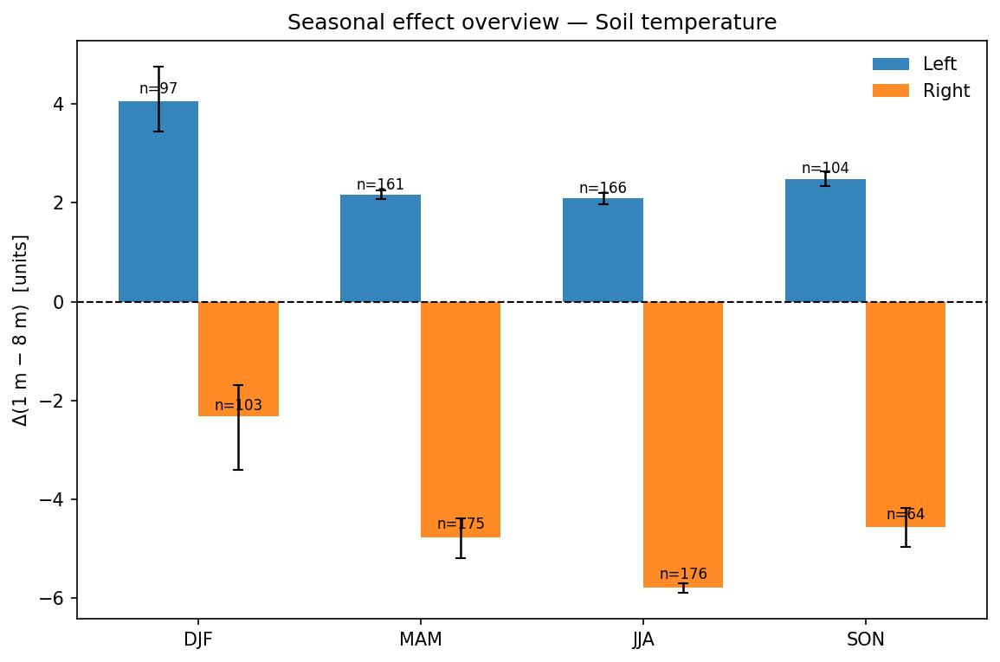

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_season_overview_1v8.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/soil_temperature/summary_JJA.csv


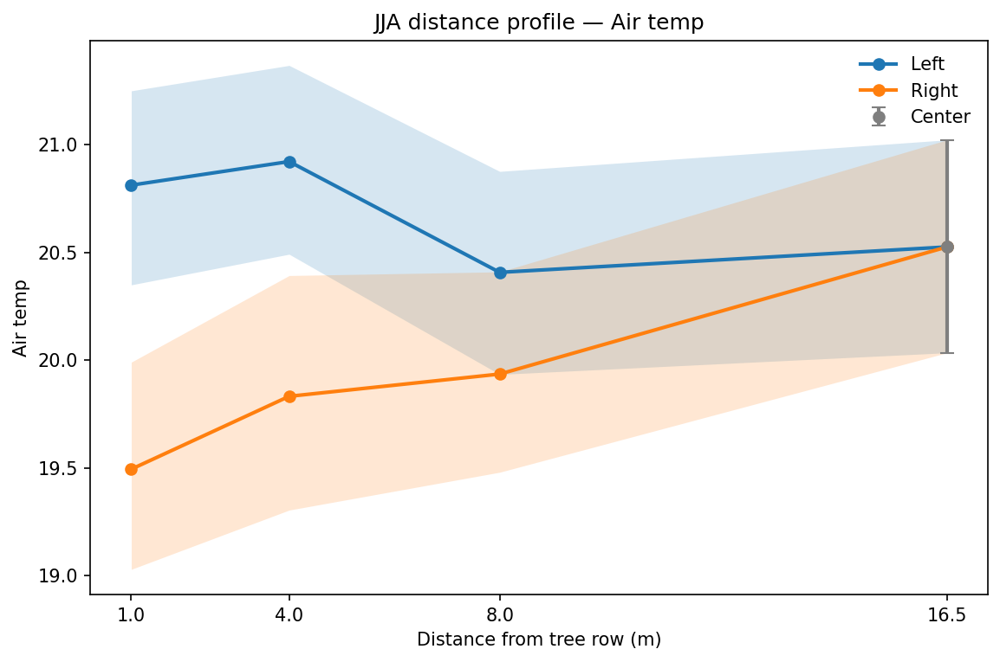

Saved: q2_reports/gradient_essence/air_temp/air_temp_jja_profile.png | q2_reports/gradient_essence/air_temp/air_temp_jja_profile.pdf


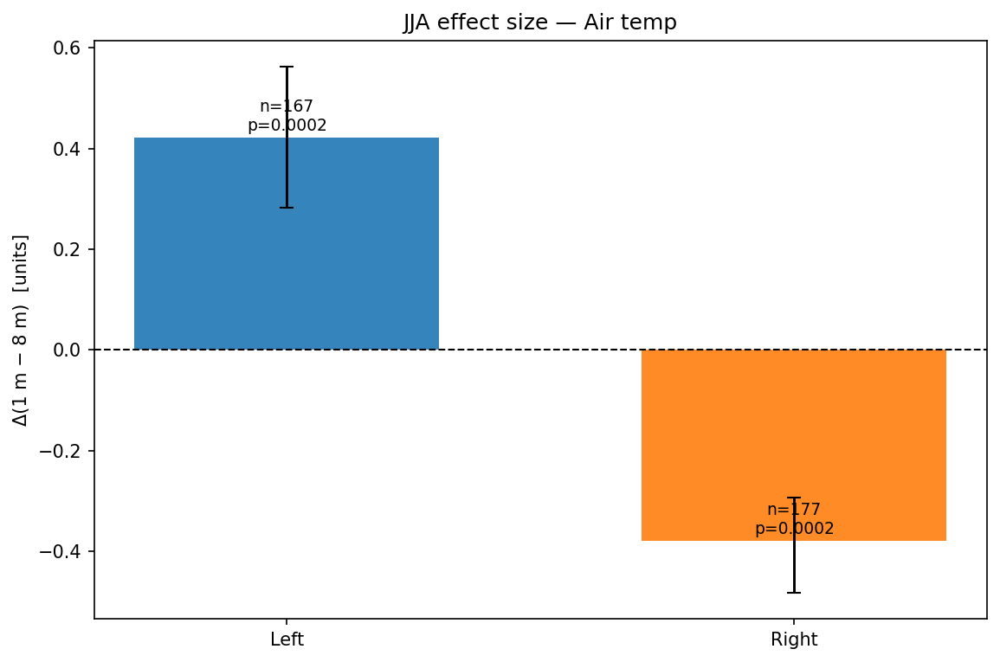

Saved: q2_reports/gradient_essence/air_temp/air_temp_jja_delta_1v8.png | q2_reports/gradient_essence/air_temp/air_temp_jja_delta_1v8.pdf


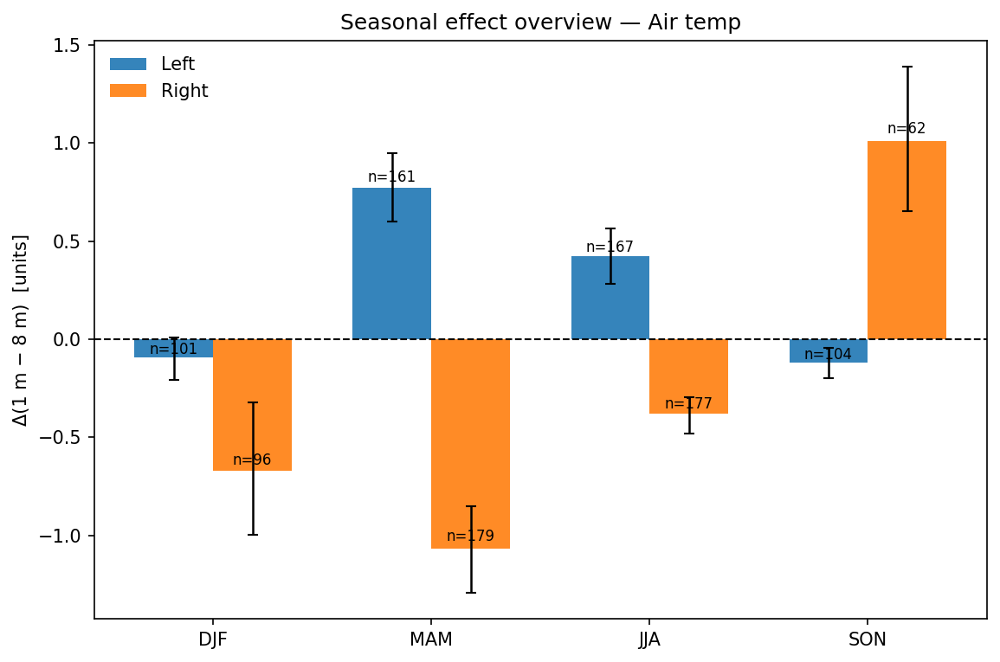

Saved: q2_reports/gradient_essence/air_temp/air_temp_season_overview_1v8.png | q2_reports/gradient_essence/air_temp/air_temp_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/air_temp/summary_JJA.csv


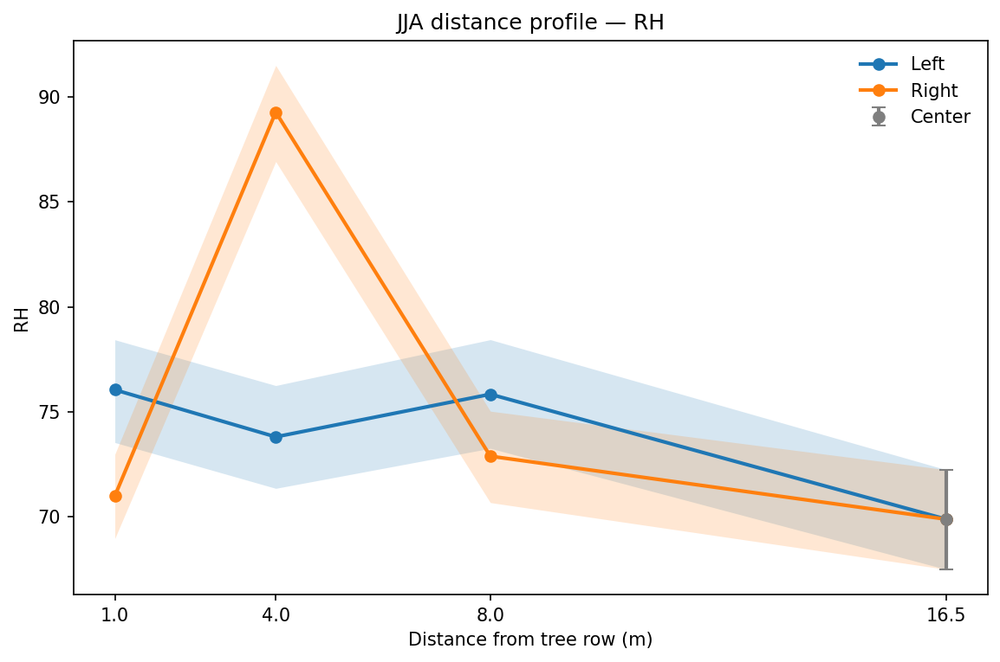

Saved: q2_reports/gradient_essence/rh/rh_jja_profile.png | q2_reports/gradient_essence/rh/rh_jja_profile.pdf


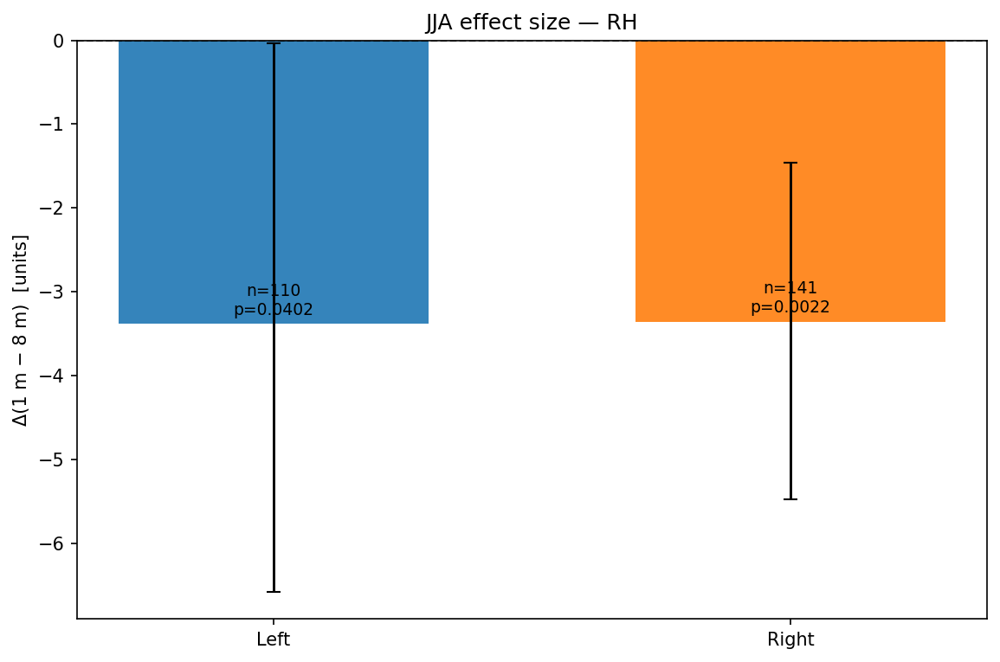

Saved: q2_reports/gradient_essence/rh/rh_jja_delta_1v8.png | q2_reports/gradient_essence/rh/rh_jja_delta_1v8.pdf


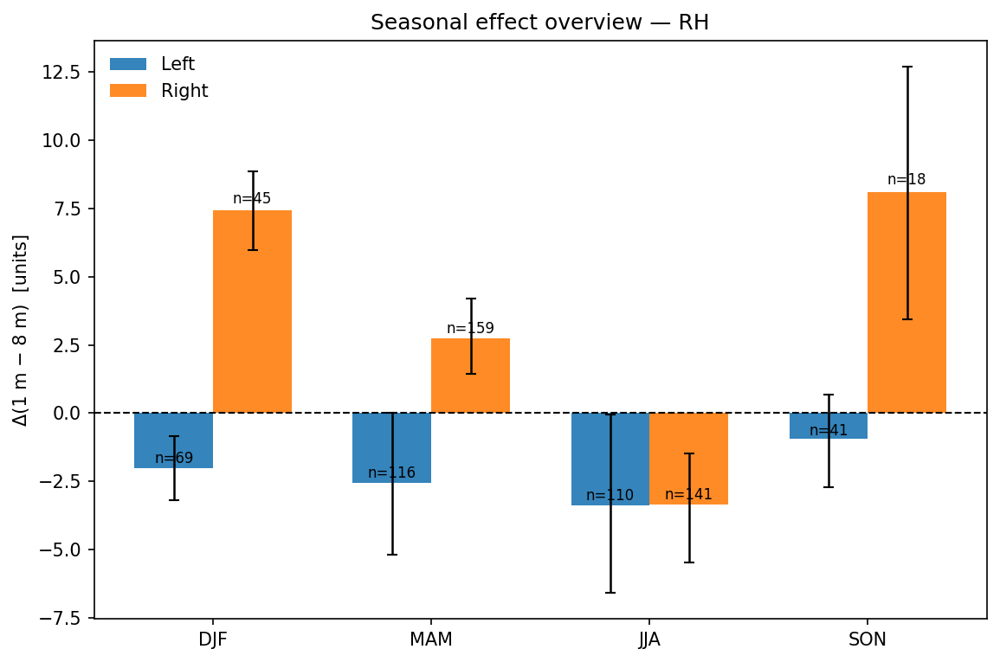

Saved: q2_reports/gradient_essence/rh/rh_season_overview_1v8.png | q2_reports/gradient_essence/rh/rh_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/rh/summary_JJA.csv


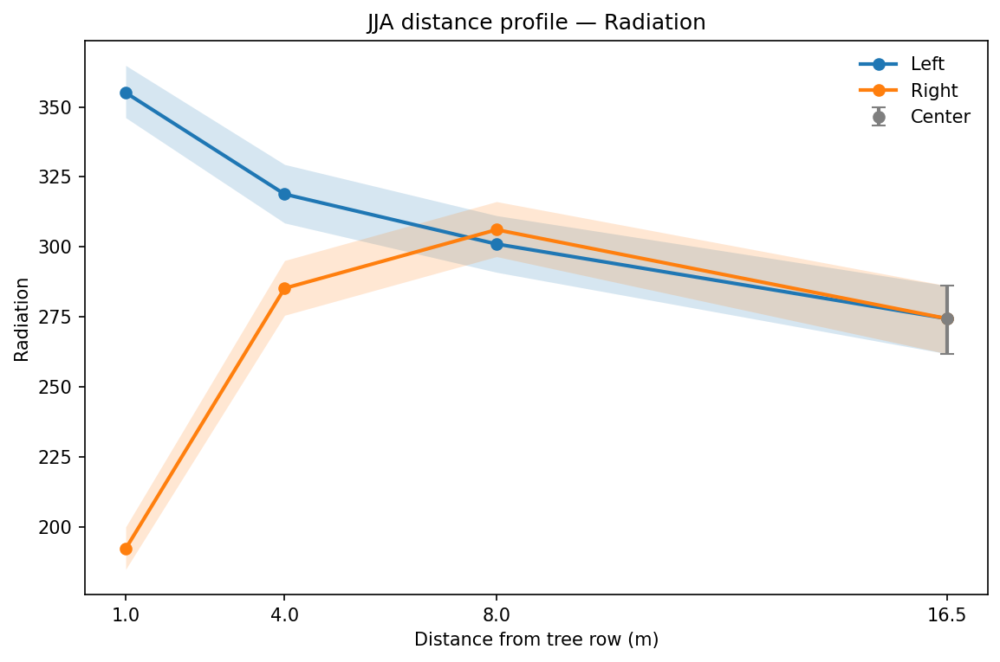

Saved: q2_reports/gradient_essence/radiation/radiation_jja_profile.png | q2_reports/gradient_essence/radiation/radiation_jja_profile.pdf


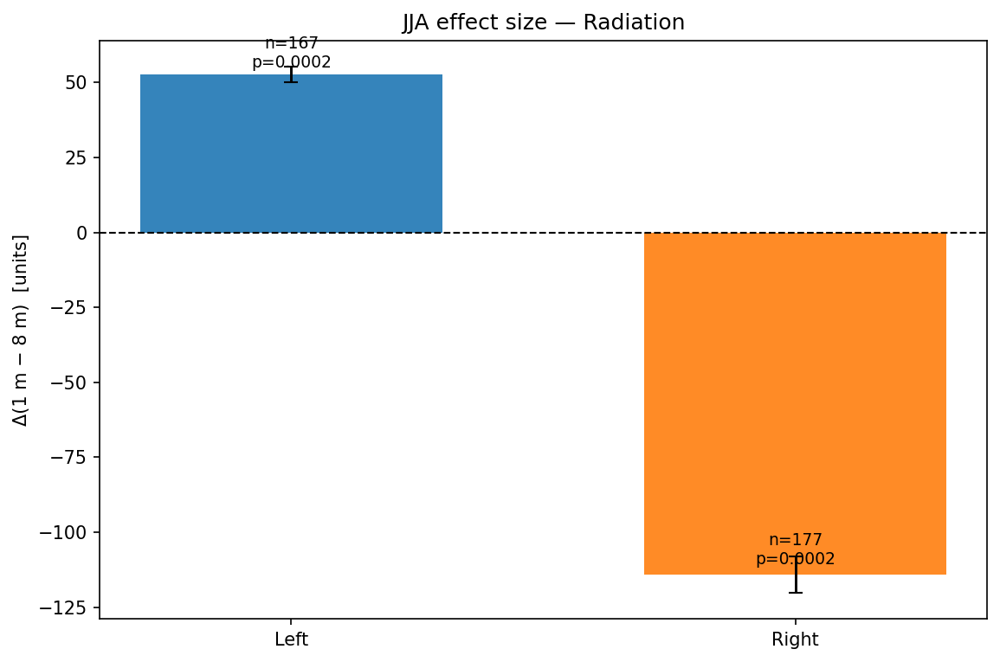

Saved: q2_reports/gradient_essence/radiation/radiation_jja_delta_1v8.png | q2_reports/gradient_essence/radiation/radiation_jja_delta_1v8.pdf


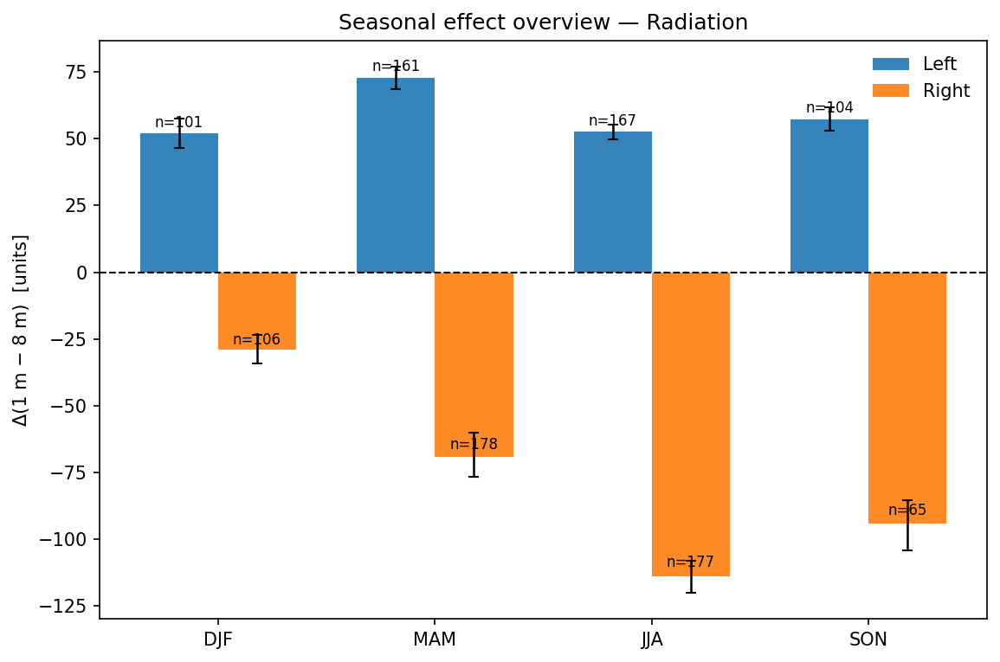

Saved: q2_reports/gradient_essence/radiation/radiation_season_overview_1v8.png | q2_reports/gradient_essence/radiation/radiation_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/radiation/summary_JJA.csv


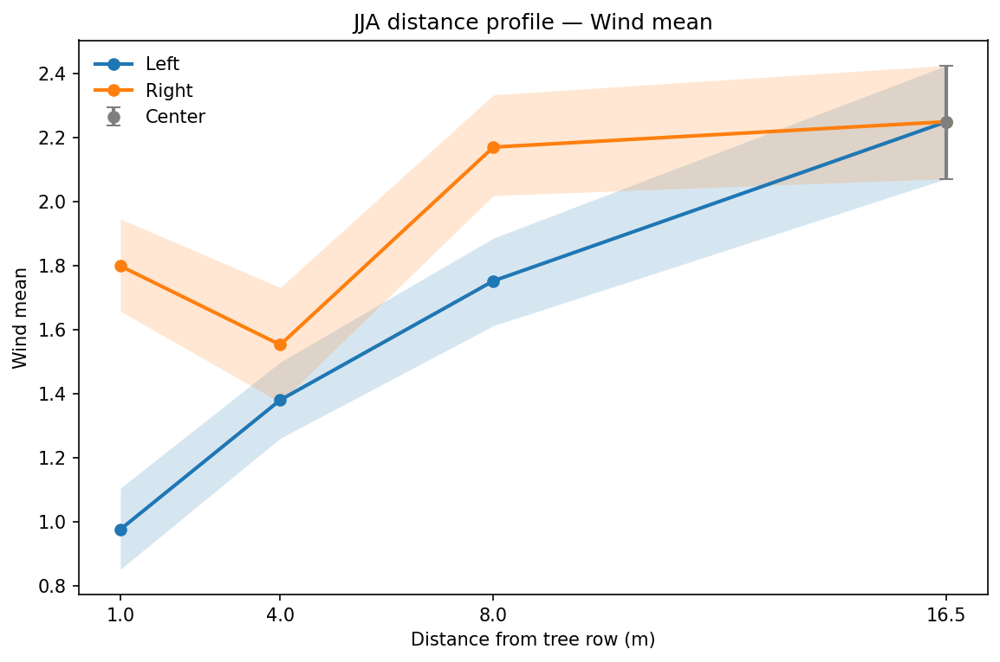

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_jja_profile.png | q2_reports/gradient_essence/wind_mean/wind_mean_jja_profile.pdf


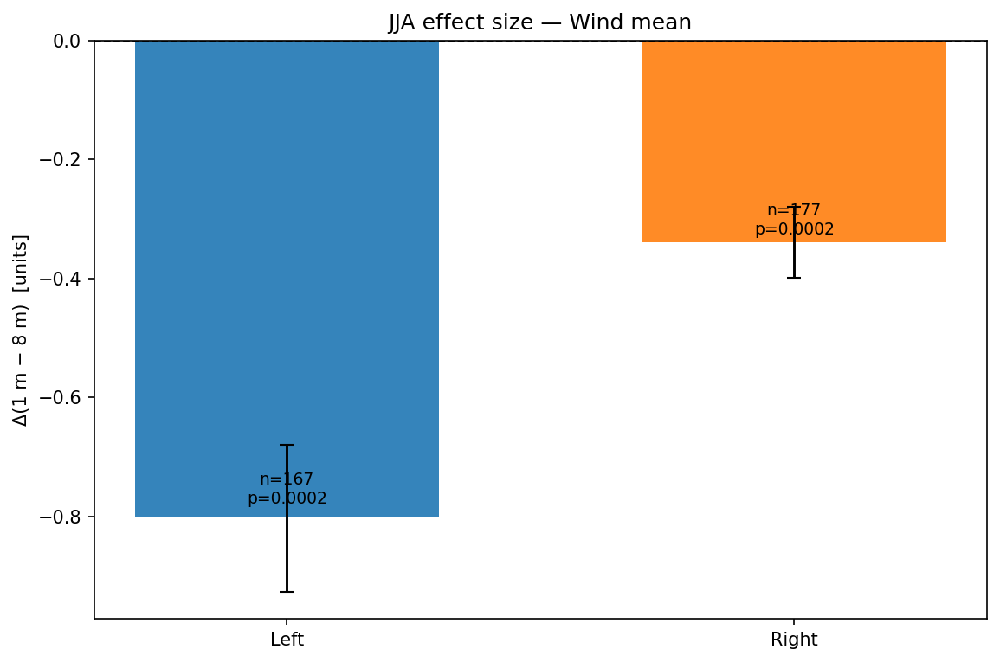

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_jja_delta_1v8.png | q2_reports/gradient_essence/wind_mean/wind_mean_jja_delta_1v8.pdf


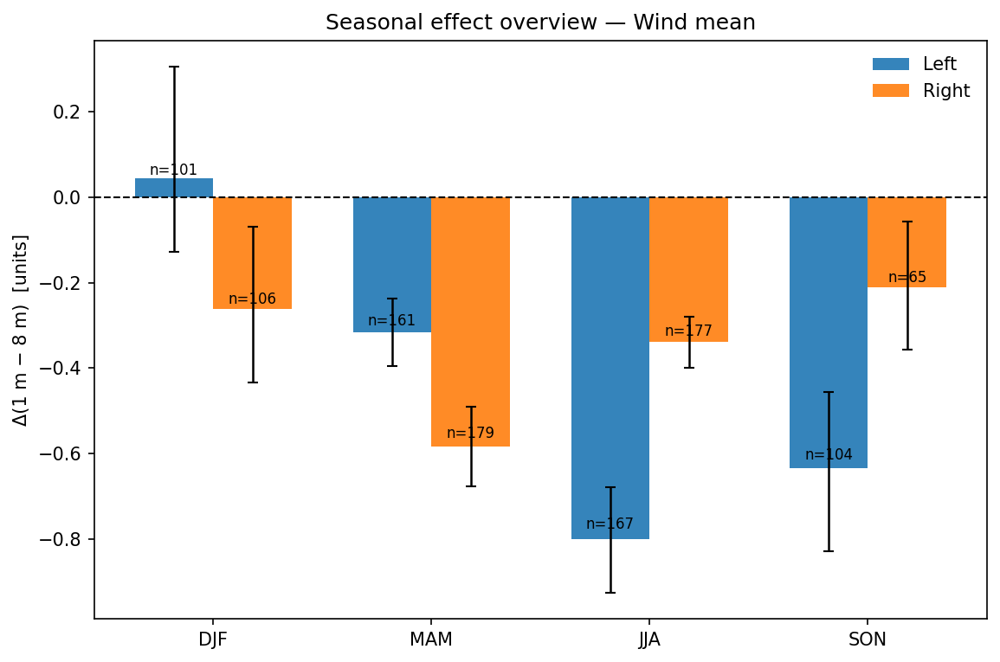

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_season_overview_1v8.png | q2_reports/gradient_essence/wind_mean/wind_mean_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/wind_mean/summary_JJA.csv

[Gradient Essence] Done.


In [18]:
# ====================== Q2 — Gradient Essence (minimal) ======================
# Exports per variable:
#  1) JJA distance profile (1→4→8→16.5, L/R lines, 95% CIs)
#  2) JJA Δ(1–8) bars (L/R, CI, n, p)
#  3) Season overview Δ(1–8) bars (DJF/MAM/JJA/SON × L/R)
#  4) Tiny summary table for JJA
#
# Outputs go to: q2_reports/gradient_essence/<var_slug>/*.png|.pdf and summary.csv

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt

ESSENCE_DIR = "q2_reports/gradient_essence"
os.makedirs(ESSENCE_DIR, exist_ok=True)

# --- Colors (keep consistent with your gradient work)
COLOR_L = "#1f77b4"  # Left  (blue)
COLOR_R = "#ff7f0e"  # Right (orange)
COLOR_C = "#7f7f7f"  # Center (gray)
DIST_ORDER = [1.0, 4.0, 8.0, 16.5]
SEASONS = ["DJF","MAM","JJA","SON"]

# --- Light mpl defaults (no seaborn)
plt.rcParams["figure.figsize"] = (7.8, 5.2)
plt.rcParams["figure.dpi"] = 150

# --- Safety helpers (local copies to avoid name clashes)
def _bootstrap_mean_ci(vals, B=2000, seed=123, q=(2.5,97.5)):
    v = pd.to_numeric(pd.Series(vals), errors="coerce").to_numpy(float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (np.nan, np.nan, np.nan)
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, v.size, size=(B, v.size))
    boots = v[idx].mean(axis=1)
    lo, hi = np.percentile(boots, list(q))
    return float(v.mean()), float(lo), float(hi)

def _paired_perm_p(diffs, reps=5000, seed=123):
    d = np.asarray(pd.to_numeric(pd.Series(diffs), errors="coerce"), float)
    d = d[np.isfinite(d)]
    n = d.size
    if n < 5: return np.nan
    rng = np.random.default_rng(seed)
    T_obs = d.mean()
    signs = rng.choice([-1,1], size=(reps, n))
    T_perm = (d * signs).mean(axis=1)
    p = (np.abs(T_perm) >= abs(T_obs)).mean()
    return (p * reps + 1) / (reps + 1)

# --- Ensure minimal columns on a copy of dn
def _ensure_cols(dsrc: pd.DataFrame) -> pd.DataFrame:
    d = dsrc.copy()
    # date
    if "_date" not in d.columns:
        for c in ["_ts","timestamp","timestamp_iso"]:
            if c in d.columns:
                d["_date"] = pd.to_datetime(d[c], errors="coerce").dt.floor("D"); break
        assert "_date" in d.columns, "Need a date-like column."
    # node label (optional, only for prints)
    if "node_key" not in d.columns:
        if "node" in d.columns:
            d["node_key"] = np.where(d["node"].astype(str).str.startswith("node_"),
                                     d["node"].astype(str),
                                     "node_" + d["node"].astype(str))
        elif "node_id" in d.columns:
            d["node_key"] = "node_" + d["node_id"].astype(str)
    # side / distance
    if "distance_m" not in d.columns or d["distance_m"].isna().all():
        dist_map = {"node_182":1.0,"node_187":4.0,"node_179":8.0,"node_183":16.5,"node_181":8.0,"node_186":4.0,"node_184":1.0}
        d["distance_m"] = d["node_key"].map(dist_map).astype(float)
    if "side" not in d.columns or d["side"].isna().all():
        side_map = {"node_182":"L","node_187":"L","node_179":"L",
                    "node_183":"C","node_181":"R","node_186":"R","node_184":"R"}
        d["side"] = d["node_key"].map(side_map).astype("category")
    # month / season
    d["_month"] = pd.to_datetime(d["_date"]).dt.month
    d["_season"] = d["_month"].map({12:"DJF",1:"DJF",2:"DJF",
                                    3:"MAM",4:"MAM",5:"MAM",
                                    6:"JJA",7:"JJA",8:"JJA",
                                    9:"SON",10:"SON",11:"SON"})
    return d

# --- Δ(1–8) paired daily difference for a given season & side
def _delta_1v8(dsrc, ycol, season, side, min_days=5):
    d = dsrc[(dsrc["_season"]==season)].copy()
    g = d[(d["side"]==side) & (d["distance_m"].isin([1.0,8.0]))] \
          .pivot_table(index="_date", columns="distance_m", values=ycol, aggfunc="mean")
    if (1.0 in g.columns) and (8.0 in g.columns):
        diffs = (pd.to_numeric(g[1.0], errors="coerce") - pd.to_numeric(g[8.0], errors="coerce")).dropna()
        n = diffs.size
        if n >= min_days:
            mu, lo, hi = _bootstrap_mean_ci(diffs)
            p = _paired_perm_p(diffs)
            return {"mean":mu, "lo":lo, "hi":hi, "p":p, "n":int(n)}
    return {"mean":np.nan, "lo":np.nan, "hi":np.nan, "p":np.nan, "n":int(0)}

# --- JJA distance profile (connect to 16.5 for both sides)
def plot_jja_profile(dsrc, ycol, label, outdir):
    d = dsrc[dsrc["_season"]=="JJA"][["_date","side","distance_m",ycol]].dropna()
    if d.empty:
        print(f"[profile] Skip {label}: no JJA data"); return
    # per day mean by (side,dist)
    per_day = d.groupby(["_date","side","distance_m"], observed=True)[ycol].mean().reset_index()
    # center stats once
    c = per_day[(per_day["side"]=="C") & (per_day["distance_m"].astype(float)==16.5)]
    c_mu=c_lo=c_hi=np.nan
    if len(c): c_mu,c_lo,c_hi = _bootstrap_mean_ci(c[ycol])
    # side curves + append center
    rows=[]
    for side in ["L","R"]:
        g = per_day[per_day["side"]==side]
        for dist, gg in g.groupby("distance_m", observed=True):
            dist=float(dist)
            if dist in (1.0,4.0,8.0):
                mu,lo,hi = _bootstrap_mean_ci(gg[ycol]); rows.append((side, dist, mu, lo, hi))
        if np.isfinite(c_mu):
            rows.append((side, 16.5, c_mu, c_lo, c_hi))
    agg = pd.DataFrame(rows, columns=["side","distance_m","mean","lo","hi"])
    if agg.empty:
        print(f"[profile] Skip {label}: missing distances"); return
    # plot
    plt.figure()
    for side, color in [("L", COLOR_L), ("R", COLOR_R)]:
        g = agg[agg["side"]==side].sort_values("distance_m")
        if len(g):
            x = g["distance_m"].values
            plt.plot(x, g["mean"], marker="o", lw=2, color=color, label=("Left" if side=="L" else "Right"))
            plt.fill_between(x, g["lo"], g["hi"], alpha=0.18, color=color, linewidth=0)
    if np.isfinite(c_mu):
        plt.errorbar([16.5],[c_mu], yerr=[[c_mu-c_lo],[c_hi-c_mu]],
                     fmt="o", color=COLOR_C, ecolor=COLOR_C, elinewidth=2, capsize=4, label="Center")
    plt.xticks(DIST_ORDER, [str(x) for x in DIST_ORDER])
    plt.xlabel("Distance from tree row (m)"); plt.ylabel(label)
    plt.title(f"JJA distance profile — {label}")
    plt.legend(frameon=False)
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_jja_profile")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")

# --- JJA Δ(1–8) bars (L/R)
def plot_jja_delta_bars(dsrc, ycol, label, outdir):
    L = _delta_1v8(dsrc, ycol, "JJA", "L")
    R = _delta_1v8(dsrc, ycol, "JJA", "R")
    if np.isnan(L["mean"]) and np.isnan(R["mean"]):
        print(f"[effect JJA] Skip {label}: no paired 1–8 days"); return
    plt.figure()
    xs=[]; xt=[];
    for i,(side,res) in enumerate([("L",L),("R",R)]):
        if not np.isnan(res["mean"]):
            xs.append(i); xt.append("Left" if side=="L" else "Right")
            col = COLOR_L if side=="L" else COLOR_R
            mu,lo,hi,p,n = res["mean"],res["lo"],res["hi"],res["p"],res["n"]
            plt.bar(i, mu, color=col, alpha=0.9, width=0.6)
            if np.isfinite(lo) and np.isfinite(hi):
                plt.errorbar(i, mu, yerr=[[mu-lo],[hi-mu]], fmt="none", ecolor="black", capsize=4, lw=1.4)
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={n}\np={p:.3g}", ha="center", va="bottom", fontsize=9)
    plt.axhline(0, color="k", lw=1, ls="--")
    plt.xticks(xs, xt)
    plt.ylabel("Δ(1 m − 8 m)  [units]"); plt.title(f"JJA effect size — {label}")
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_jja_delta_1v8")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")

# --- Season overview: grouped bars by season (each has L/R)
def plot_season_overview_bars(dsrc, ycol, label, outdir):
    rows=[]
    for s in SEASONS:
        rows.append({"season":s, "side":"L", **_delta_1v8(dsrc, ycol, s, "L")})
        rows.append({"season":s, "side":"R", **_delta_1v8(dsrc, ycol, s, "R")})
    tab = pd.DataFrame(rows)
    if tab["n"].max() == 0:
        print(f"[season bars] Skip {label}: no paired 1–8 days"); return
    # plot
    plt.figure()
    x = np.arange(len(SEASONS))
    w = 0.36
    for j,(side,colr,off) in enumerate([("L",COLOR_L,-w/2),("R",COLOR_R,+w/2)]):
        t = tab[tab["side"]==side].set_index("season").reindex(SEASONS)
        plt.bar(x+off, t["mean"].values, width=w, color=colr, alpha=0.9, label=("Left" if side=="L" else "Right"))
        # CI bars
        for k,s in enumerate(SEASONS):
            mu,lo,hi = t.loc[s,"mean"], t.loc[s,"lo"], t.loc[s,"hi"]
            if np.isfinite(mu) and np.isfinite(lo) and np.isfinite(hi):
                plt.errorbar(x[k]+off, mu, yerr=[[mu-lo],[hi-mu]], fmt="none", ecolor="black", capsize=3, lw=1.2)
            # n text (only if any data)
            n = t.loc[s,"n"]
            if n>0 and np.isfinite(mu):
                plt.text(x[k]+off, mu + 0.02*(abs(mu)+1e-9), f"n={int(n)}", ha="center", va="bottom", fontsize=8)
    plt.axhline(0, color="k", lw=1, ls="--")
    plt.xticks(x, SEASONS)
    plt.ylabel("Δ(1 m − 8 m)  [units]")
    plt.title(f"Seasonal effect overview — {label}")
    plt.legend(frameon=False)
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_season_overview_1v8")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")
    # return table for optional inspection
    return tab

# --- Tiny summary table (JJA only)
def write_jja_summary_row(dsrc, ycol, label, outdir):
    L = _delta_1v8(dsrc, ycol, "JJA", "L")
    R = _delta_1v8(dsrc, ycol, "JJA", "R")
    row = {
        "label": label,
        "L_mean": L["mean"], "L_lo": L["lo"], "L_hi": L["hi"], "L_p": L["p"], "L_n": L["n"],
        "R_mean": R["mean"], "R_lo": R["lo"], "R_hi": R["hi"], "R_p": R["p"], "R_n": R["n"],
    }
    fn = os.path.join(outdir, "summary_JJA.csv")
    pd.DataFrame([row]).to_csv(fn, index=False)
    print("Saved:", fn)

# ====================== RUN (per variable) ======================
_src = _ensure_cols(dn)

# If VAR_COLS is not present, build a minimal detector
if 'VAR_COLS' not in globals() or not isinstance(VAR_COLS, dict):
    def _pick(d, *cands):
        for c in cands:
            if c in d.columns: return c
        return None
    VAR_COLS = {
        "Soil moisture": _pick(_src, "soil_moisture__comp","ground_humidity_0__pref","ground_humidity_1__pref"),
        "Soil temperature": _pick(_src, "soil_temp__comp","ground_temp_0__pref","ground_temp_1__pref"),
        "Air temp": _pick(_src, "temperature__pref","temperature"),
        "Wind mean": _pick(_src, "wind_speed_mean__pref","wind_speed_mean"),
        "Radiation": _pick(_src, "global_radiation__pref","global_radiation"),
    }
    VAR_COLS = {k:v for k,v in VAR_COLS.items() if v is not None}

for label, col in VAR_COLS.items():
    var_slug = label.replace(" ","_").lower()
    outdir = os.path.join(ESSENCE_DIR, var_slug)
    os.makedirs(outdir, exist_ok=True)
    # 1) JJA profile with 16.5 connected
    plot_jja_profile(_src, col, label, outdir)
    # 2) JJA Δ(1–8) bars
    plot_jja_delta_bars(_src, col, label, outdir)
    # 3) Season overview bars (DJF/MAM/JJA/SON)
    _ = plot_season_overview_bars(_src, col, label, outdir)
    # 4) Tiny summary CSV (JJA)
    write_jja_summary_row(_src, col, label, outdir)

print("\n[Gradient Essence] Done.")


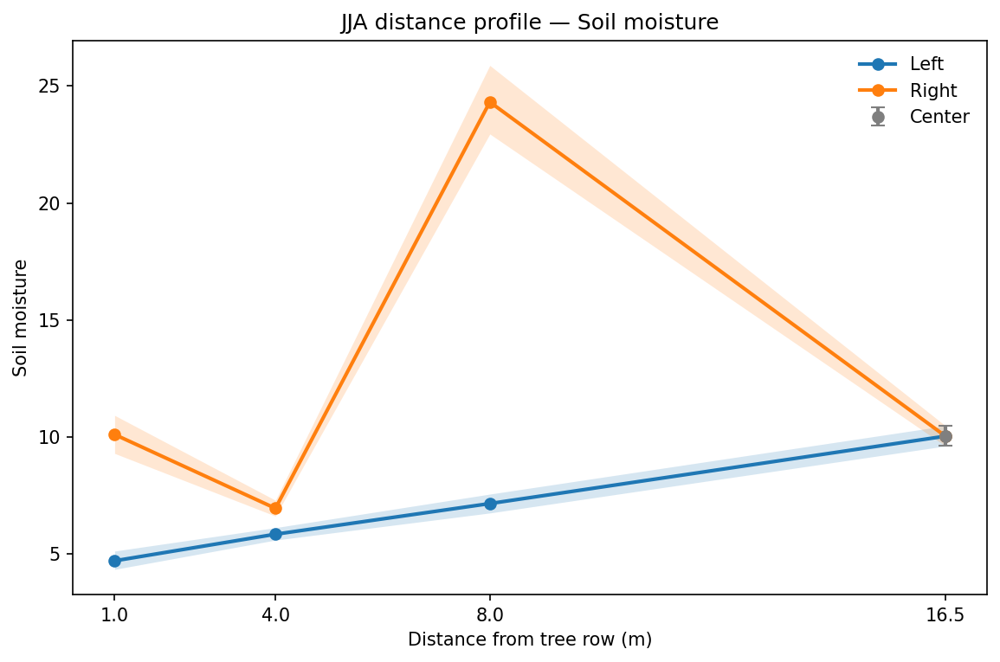

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_profile.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_profile.pdf


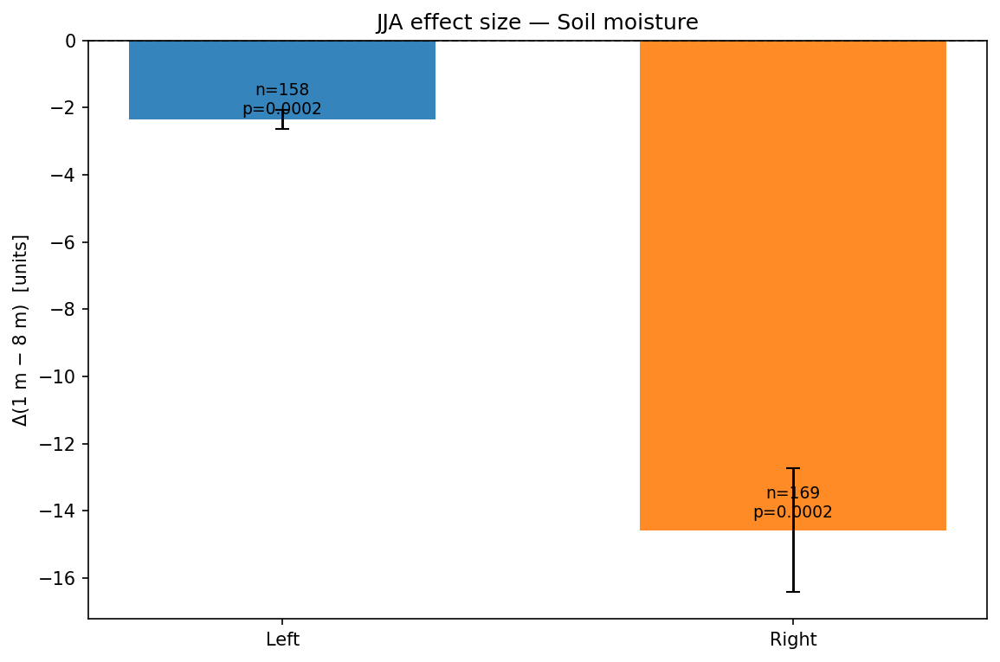

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_delta_1v8.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_jja_delta_1v8.pdf


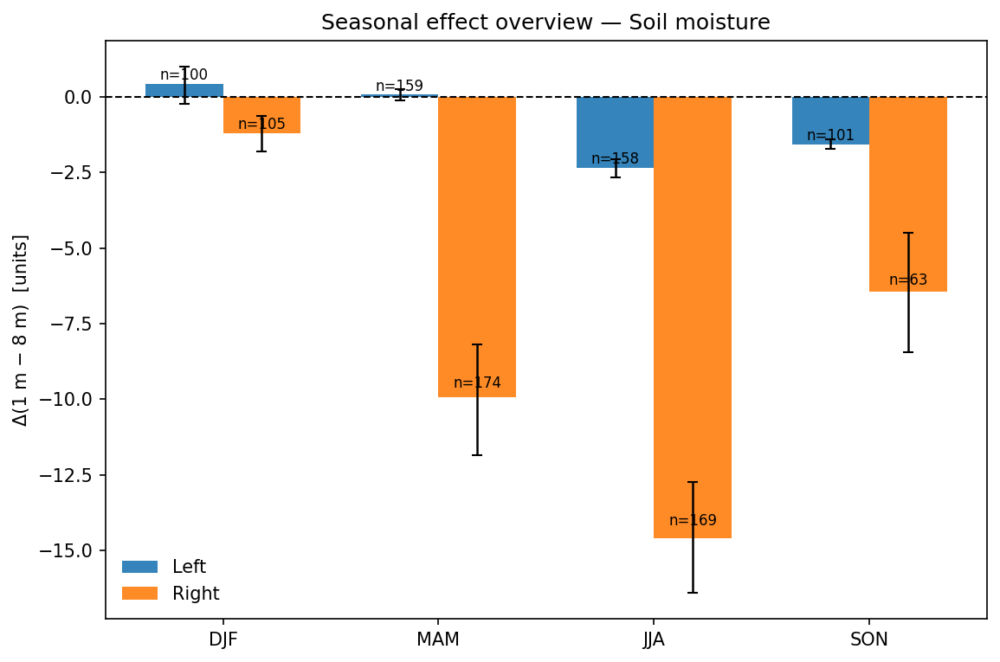

Saved: q2_reports/gradient_essence/soil_moisture/soil_moisture_season_overview_1v8.png | q2_reports/gradient_essence/soil_moisture/soil_moisture_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/soil_moisture/summary_JJA.csv


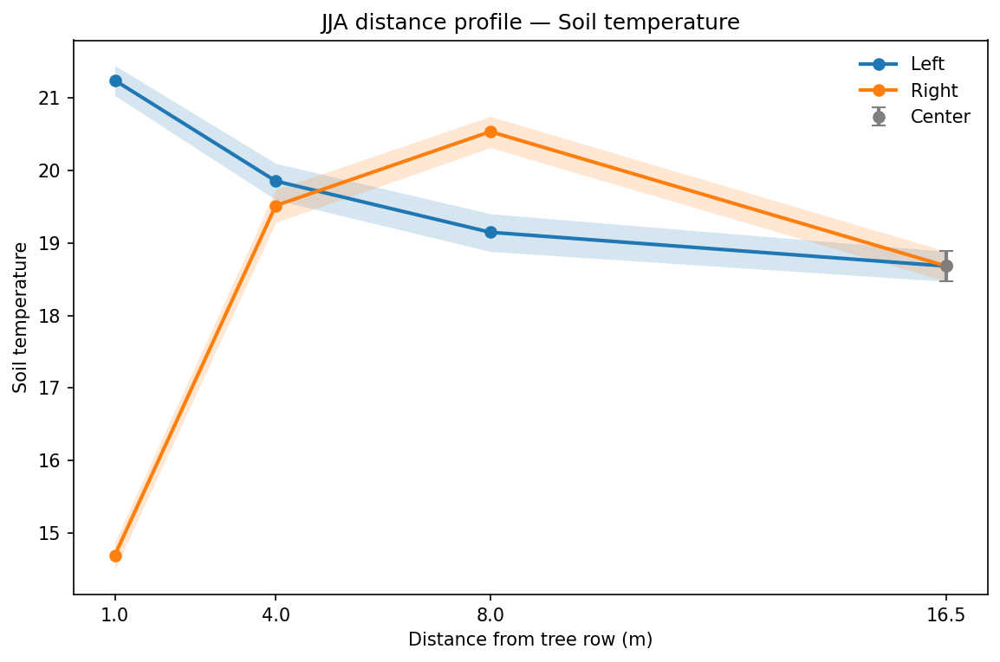

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_profile.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_profile.pdf


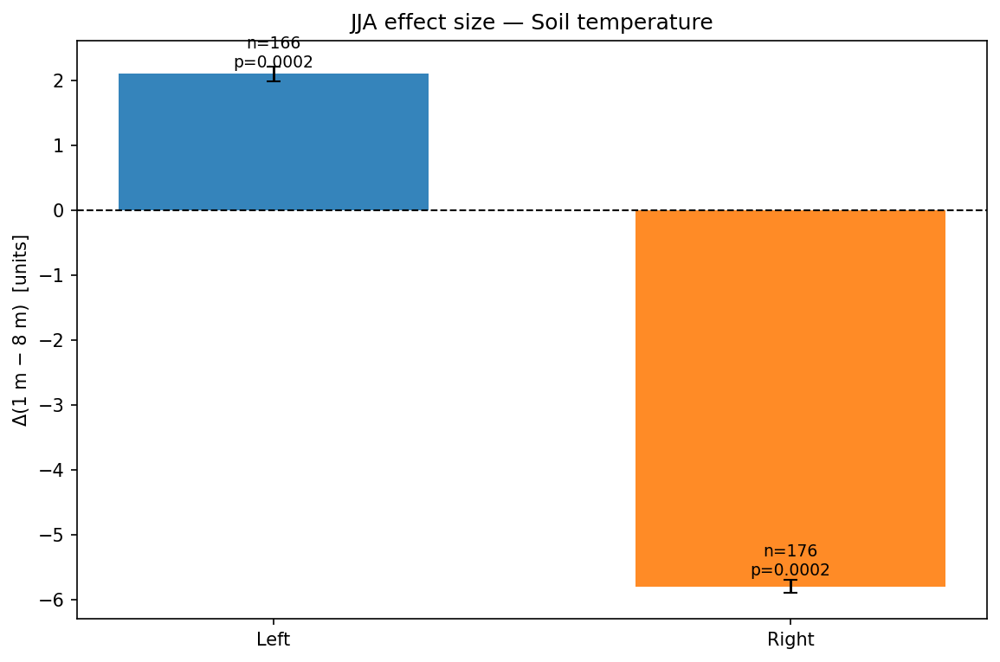

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_delta_1v8.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_jja_delta_1v8.pdf


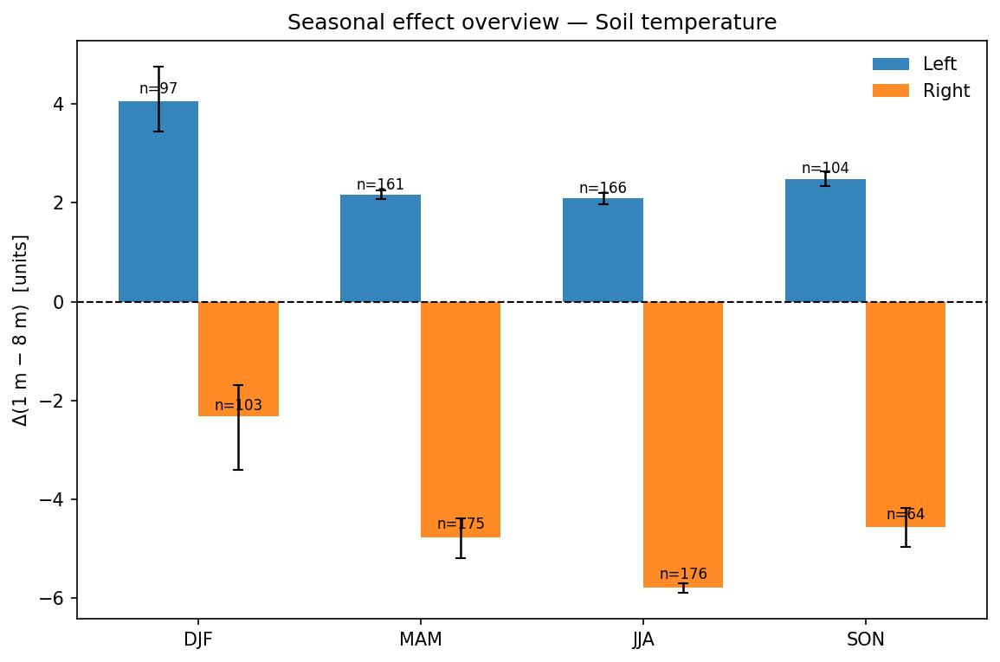

Saved: q2_reports/gradient_essence/soil_temperature/soil_temperature_season_overview_1v8.png | q2_reports/gradient_essence/soil_temperature/soil_temperature_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/soil_temperature/summary_JJA.csv


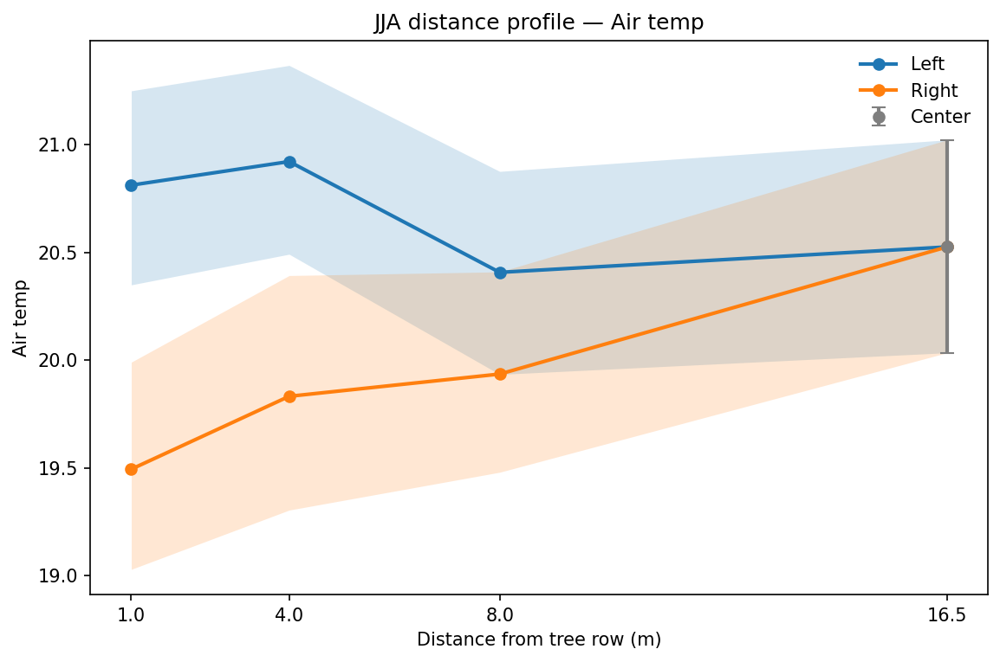

Saved: q2_reports/gradient_essence/air_temp/air_temp_jja_profile.png | q2_reports/gradient_essence/air_temp/air_temp_jja_profile.pdf


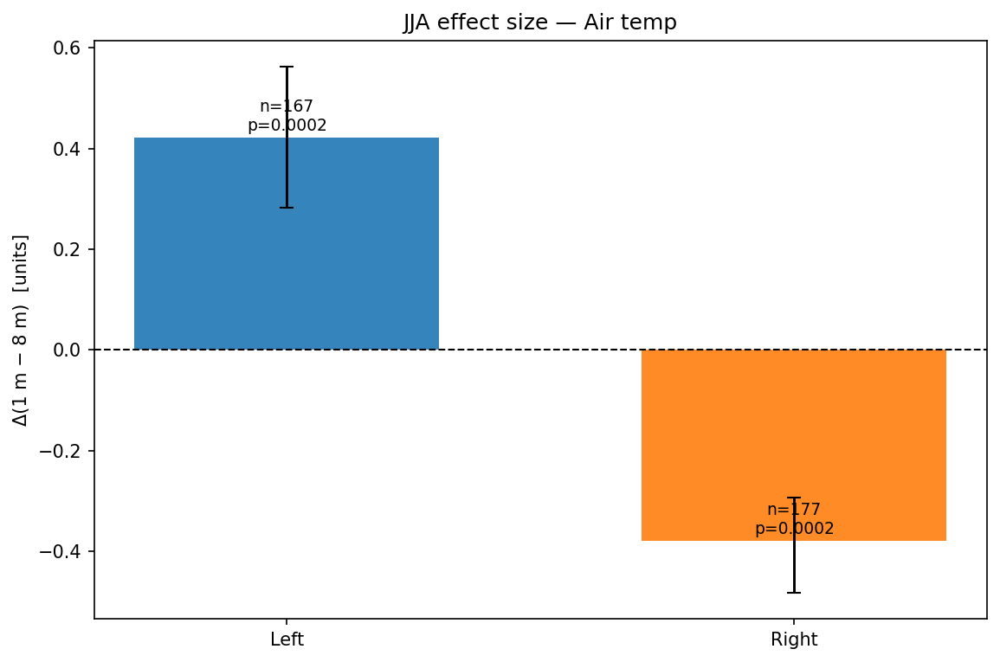

Saved: q2_reports/gradient_essence/air_temp/air_temp_jja_delta_1v8.png | q2_reports/gradient_essence/air_temp/air_temp_jja_delta_1v8.pdf


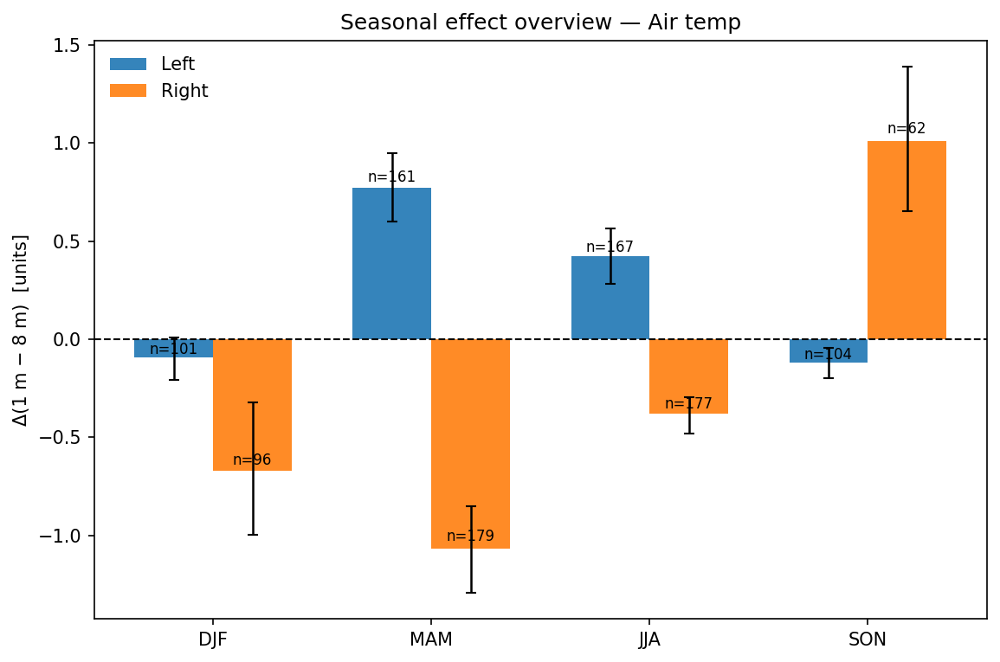

Saved: q2_reports/gradient_essence/air_temp/air_temp_season_overview_1v8.png | q2_reports/gradient_essence/air_temp/air_temp_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/air_temp/summary_JJA.csv


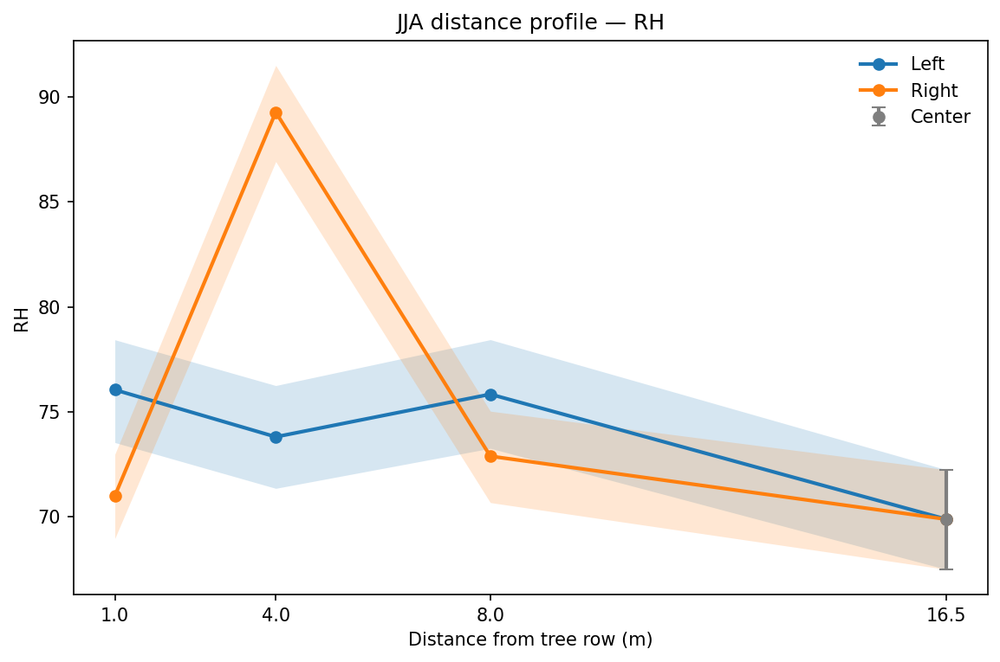

Saved: q2_reports/gradient_essence/rh/rh_jja_profile.png | q2_reports/gradient_essence/rh/rh_jja_profile.pdf


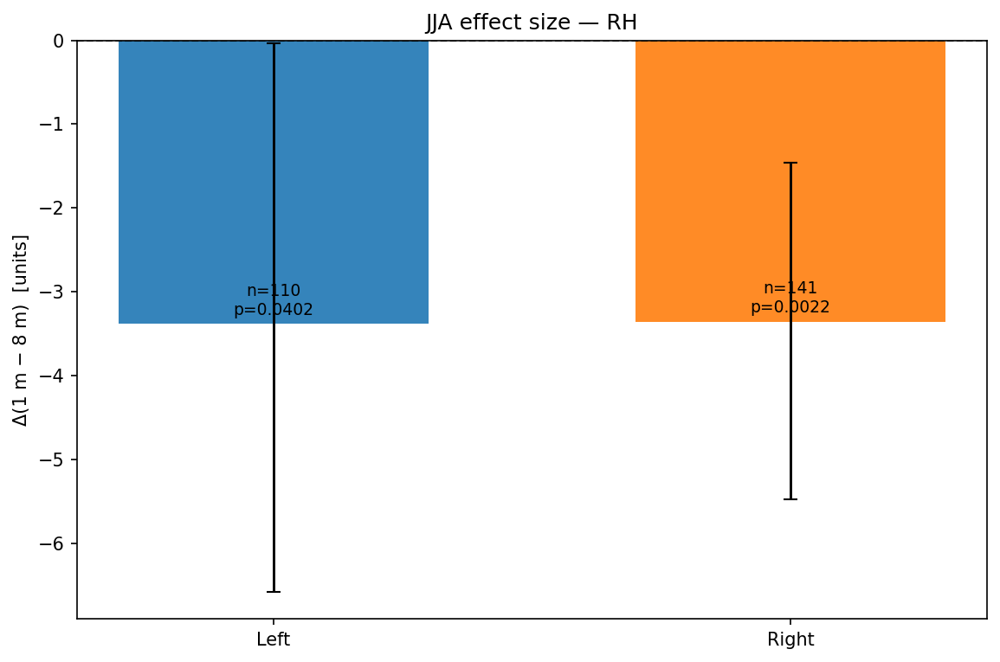

Saved: q2_reports/gradient_essence/rh/rh_jja_delta_1v8.png | q2_reports/gradient_essence/rh/rh_jja_delta_1v8.pdf


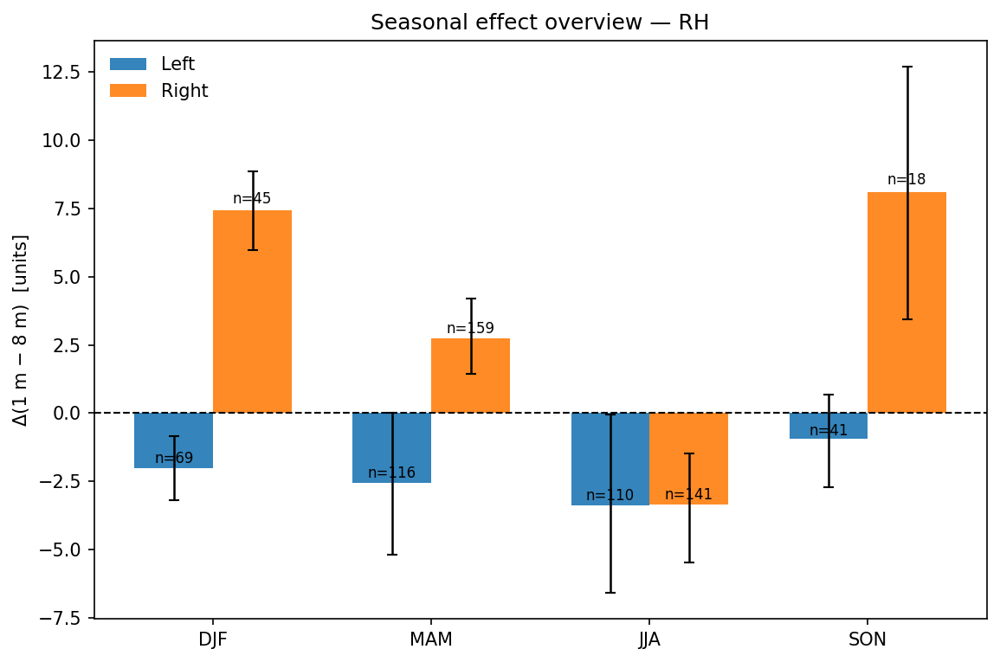

Saved: q2_reports/gradient_essence/rh/rh_season_overview_1v8.png | q2_reports/gradient_essence/rh/rh_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/rh/summary_JJA.csv


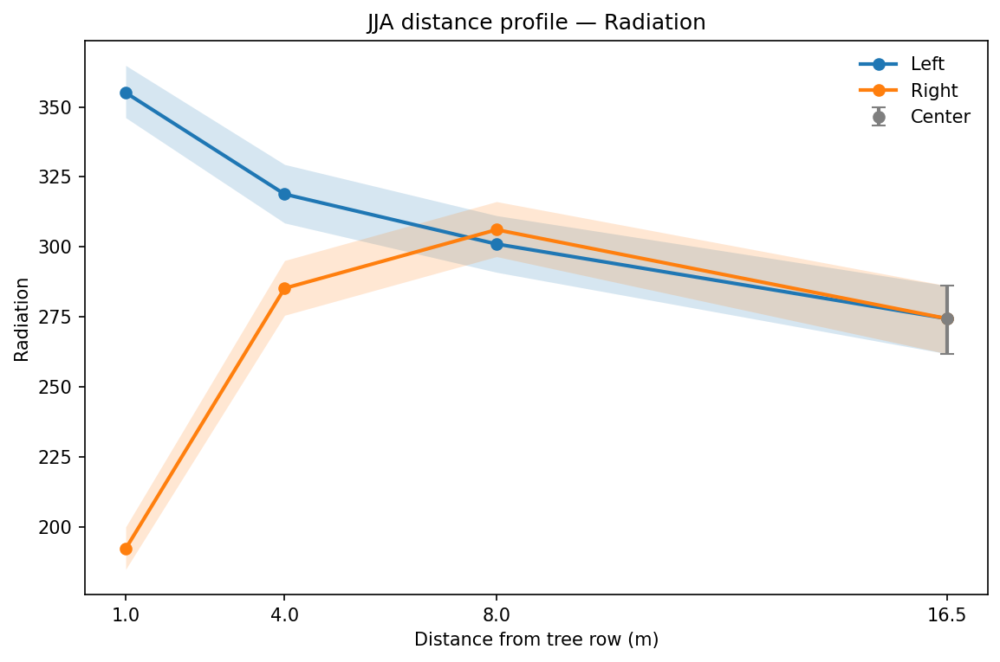

Saved: q2_reports/gradient_essence/radiation/radiation_jja_profile.png | q2_reports/gradient_essence/radiation/radiation_jja_profile.pdf


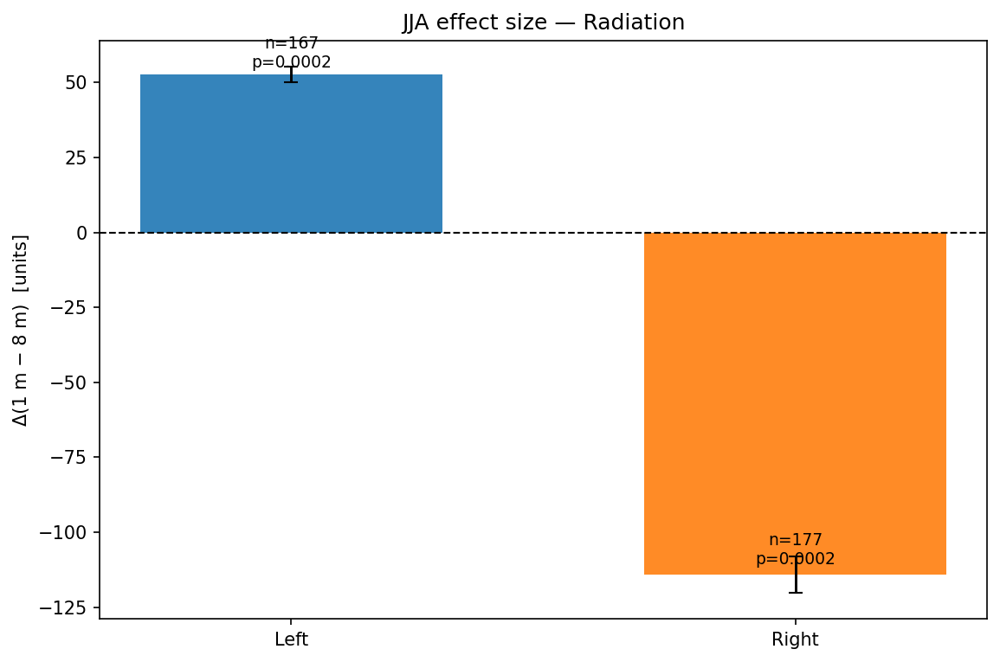

Saved: q2_reports/gradient_essence/radiation/radiation_jja_delta_1v8.png | q2_reports/gradient_essence/radiation/radiation_jja_delta_1v8.pdf


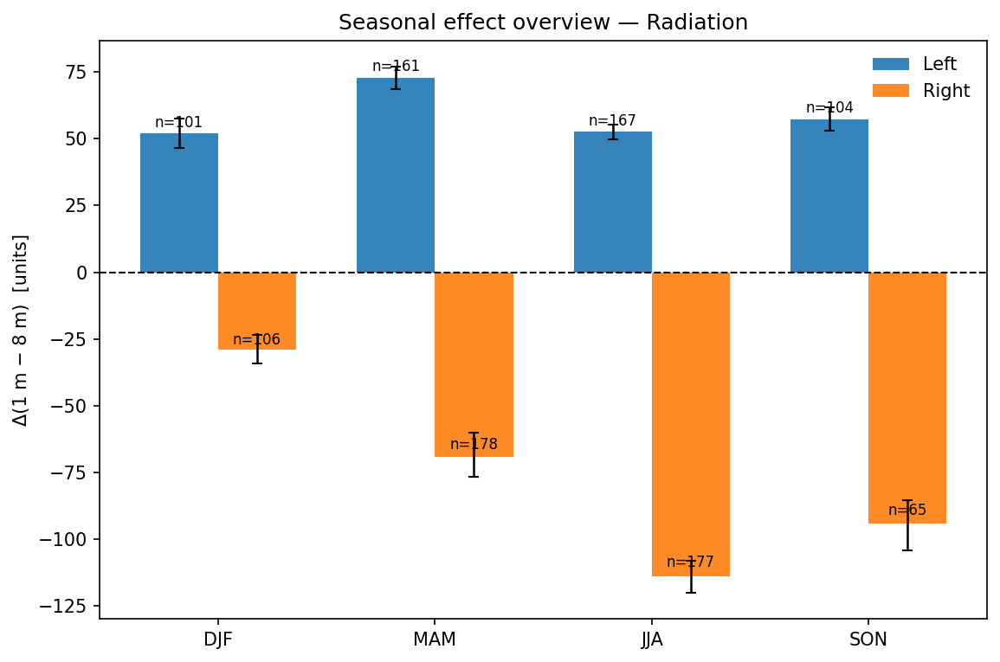

Saved: q2_reports/gradient_essence/radiation/radiation_season_overview_1v8.png | q2_reports/gradient_essence/radiation/radiation_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/radiation/summary_JJA.csv


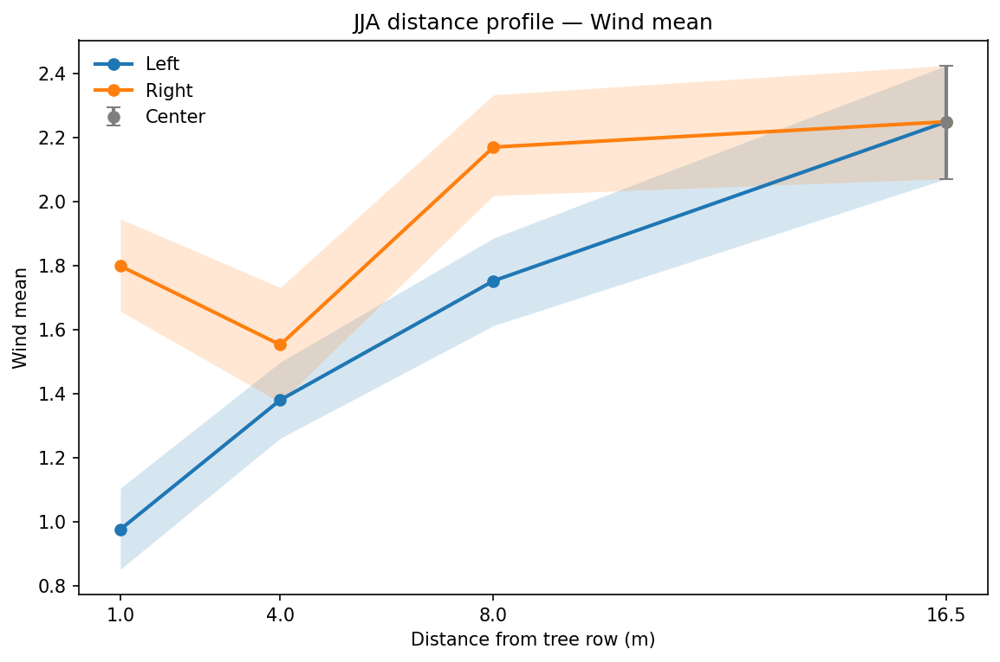

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_jja_profile.png | q2_reports/gradient_essence/wind_mean/wind_mean_jja_profile.pdf


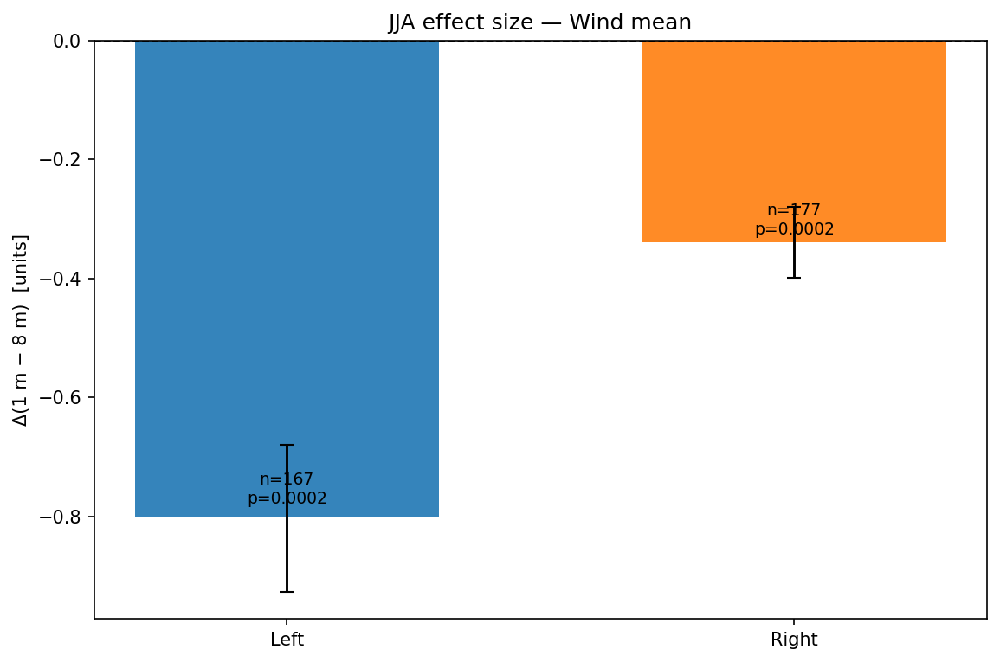

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_jja_delta_1v8.png | q2_reports/gradient_essence/wind_mean/wind_mean_jja_delta_1v8.pdf


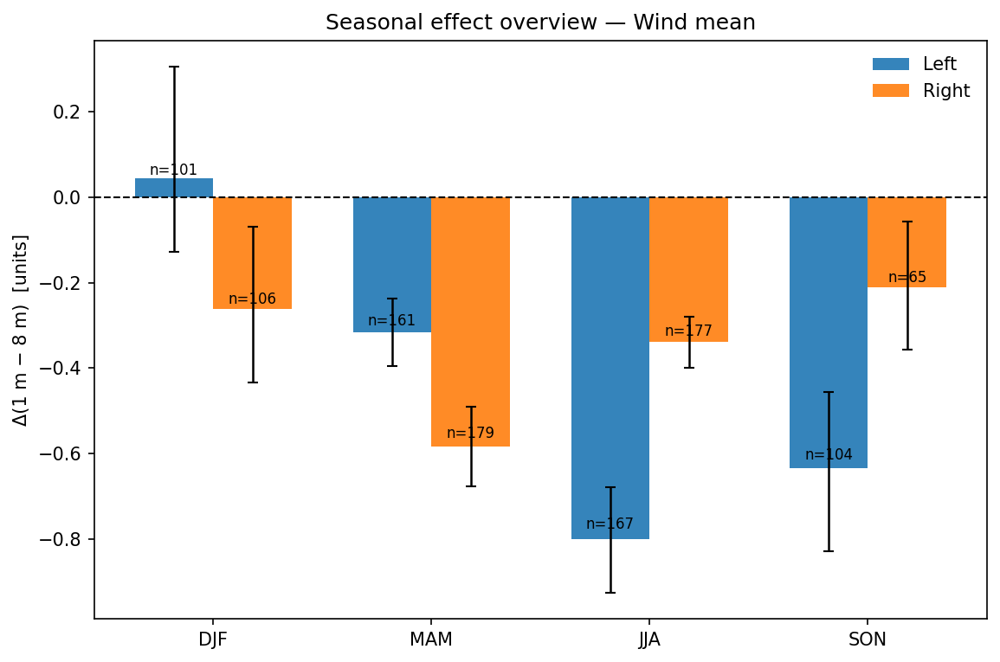

Saved: q2_reports/gradient_essence/wind_mean/wind_mean_season_overview_1v8.png | q2_reports/gradient_essence/wind_mean/wind_mean_season_overview_1v8.pdf
Saved: q2_reports/gradient_essence/wind_mean/summary_JJA.csv

[Gradient Essence] Done.


In [19]:
# ====================== Q2 — Gradient Essence (minimal) ======================
# Exports per variable:
#  1) JJA distance profile (1→4→8→16.5, L/R lines, 95% CIs)
#  2) JJA Δ(1–8) bars (L/R, CI, n, p)
#  3) Season overview Δ(1–8) bars (DJF/MAM/JJA/SON × L/R)
#  4) Tiny summary table for JJA
#
# Outputs go to: q2_reports/gradient_essence/<var_slug>/*.png|.pdf and summary.csv

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt

ESSENCE_DIR = "q2_reports/gradient_essence"
os.makedirs(ESSENCE_DIR, exist_ok=True)

# --- Colors (keep consistent with your gradient work)
COLOR_L = "#1f77b4"  # Left  (blue)
COLOR_R = "#ff7f0e"  # Right (orange)
COLOR_C = "#7f7f7f"  # Center (gray)
DIST_ORDER = [1.0, 4.0, 8.0, 16.5]
SEASONS = ["DJF","MAM","JJA","SON"]

# --- Light mpl defaults (no seaborn)
plt.rcParams["figure.figsize"] = (7.8, 5.2)
plt.rcParams["figure.dpi"] = 150

# --- Safety helpers (local copies to avoid name clashes)
def _bootstrap_mean_ci(vals, B=2000, seed=123, q=(2.5,97.5)):
    v = pd.to_numeric(pd.Series(vals), errors="coerce").to_numpy(float)
    v = v[np.isfinite(v)]
    if v.size == 0:
        return (np.nan, np.nan, np.nan)
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, v.size, size=(B, v.size))
    boots = v[idx].mean(axis=1)
    lo, hi = np.percentile(boots, list(q))
    return float(v.mean()), float(lo), float(hi)

def _paired_perm_p(diffs, reps=5000, seed=123):
    d = np.asarray(pd.to_numeric(pd.Series(diffs), errors="coerce"), float)
    d = d[np.isfinite(d)]
    n = d.size
    if n < 5: return np.nan
    rng = np.random.default_rng(seed)
    T_obs = d.mean()
    signs = rng.choice([-1,1], size=(reps, n))
    T_perm = (d * signs).mean(axis=1)
    p = (np.abs(T_perm) >= abs(T_obs)).mean()
    return (p * reps + 1) / (reps + 1)

# --- Ensure minimal columns on a copy of dn
def _ensure_cols(dsrc: pd.DataFrame) -> pd.DataFrame:
    d = dsrc.copy()
    # date
    if "_date" not in d.columns:
        for c in ["_ts","timestamp","timestamp_iso"]:
            if c in d.columns:
                d["_date"] = pd.to_datetime(d[c], errors="coerce").dt.floor("D"); break
        assert "_date" in d.columns, "Need a date-like column."
    # node label (optional, only for prints)
    if "node_key" not in d.columns:
        if "node" in d.columns:
            d["node_key"] = np.where(d["node"].astype(str).str.startswith("node_"),
                                     d["node"].astype(str),
                                     "node_" + d["node"].astype(str))
        elif "node_id" in d.columns:
            d["node_key"] = "node_" + d["node_id"].astype(str)
    # side / distance
    if "distance_m" not in d.columns or d["distance_m"].isna().all():
        dist_map = {"node_182":1.0,"node_187":4.0,"node_179":8.0,"node_183":16.5,"node_181":8.0,"node_186":4.0,"node_184":1.0}
        d["distance_m"] = d["node_key"].map(dist_map).astype(float)
    if "side" not in d.columns or d["side"].isna().all():
        side_map = {"node_182":"L","node_187":"L","node_179":"L",
                    "node_183":"C","node_181":"R","node_186":"R","node_184":"R"}
        d["side"] = d["node_key"].map(side_map).astype("category")
    # month / season
    d["_month"] = pd.to_datetime(d["_date"]).dt.month
    d["_season"] = d["_month"].map({12:"DJF",1:"DJF",2:"DJF",
                                    3:"MAM",4:"MAM",5:"MAM",
                                    6:"JJA",7:"JJA",8:"JJA",
                                    9:"SON",10:"SON",11:"SON"})
    return d

# --- Δ(1–8) paired daily difference for a given season & side
def _delta_1v8(dsrc, ycol, season, side, min_days=5):
    d = dsrc[(dsrc["_season"]==season)].copy()
    g = d[(d["side"]==side) & (d["distance_m"].isin([1.0,8.0]))] \
          .pivot_table(index="_date", columns="distance_m", values=ycol, aggfunc="mean")
    if (1.0 in g.columns) and (8.0 in g.columns):
        diffs = (pd.to_numeric(g[1.0], errors="coerce") - pd.to_numeric(g[8.0], errors="coerce")).dropna()
        n = diffs.size
        if n >= min_days:
            mu, lo, hi = _bootstrap_mean_ci(diffs)
            p = _paired_perm_p(diffs)
            return {"mean":mu, "lo":lo, "hi":hi, "p":p, "n":int(n)}
    return {"mean":np.nan, "lo":np.nan, "hi":np.nan, "p":np.nan, "n":int(0)}

# --- JJA distance profile (connect to 16.5 for both sides)
def plot_jja_profile(dsrc, ycol, label, outdir):
    d = dsrc[dsrc["_season"]=="JJA"][["_date","side","distance_m",ycol]].dropna()
    if d.empty:
        print(f"[profile] Skip {label}: no JJA data"); return
    # per day mean by (side,dist)
    per_day = d.groupby(["_date","side","distance_m"], observed=True)[ycol].mean().reset_index()
    # center stats once
    c = per_day[(per_day["side"]=="C") & (per_day["distance_m"].astype(float)==16.5)]
    c_mu=c_lo=c_hi=np.nan
    if len(c): c_mu,c_lo,c_hi = _bootstrap_mean_ci(c[ycol])
    # side curves + append center
    rows=[]
    for side in ["L","R"]:
        g = per_day[per_day["side"]==side]
        for dist, gg in g.groupby("distance_m", observed=True):
            dist=float(dist)
            if dist in (1.0,4.0,8.0):
                mu,lo,hi = _bootstrap_mean_ci(gg[ycol]); rows.append((side, dist, mu, lo, hi))
        if np.isfinite(c_mu):
            rows.append((side, 16.5, c_mu, c_lo, c_hi))
    agg = pd.DataFrame(rows, columns=["side","distance_m","mean","lo","hi"])
    if agg.empty:
        print(f"[profile] Skip {label}: missing distances"); return
    # plot
    plt.figure()
    for side, color in [("L", COLOR_L), ("R", COLOR_R)]:
        g = agg[agg["side"]==side].sort_values("distance_m")
        if len(g):
            x = g["distance_m"].values
            plt.plot(x, g["mean"], marker="o", lw=2, color=color, label=("Left" if side=="L" else "Right"))
            plt.fill_between(x, g["lo"], g["hi"], alpha=0.18, color=color, linewidth=0)
    if np.isfinite(c_mu):
        plt.errorbar([16.5],[c_mu], yerr=[[c_mu-c_lo],[c_hi-c_mu]],
                     fmt="o", color=COLOR_C, ecolor=COLOR_C, elinewidth=2, capsize=4, label="Center")
    plt.xticks(DIST_ORDER, [str(x) for x in DIST_ORDER])
    plt.xlabel("Distance from tree row (m)"); plt.ylabel(label)
    plt.title(f"JJA distance profile — {label}")
    plt.legend(frameon=False)
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_jja_profile")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")

# --- JJA Δ(1–8) bars (L/R)
def plot_jja_delta_bars(dsrc, ycol, label, outdir):
    L = _delta_1v8(dsrc, ycol, "JJA", "L")
    R = _delta_1v8(dsrc, ycol, "JJA", "R")
    if np.isnan(L["mean"]) and np.isnan(R["mean"]):
        print(f"[effect JJA] Skip {label}: no paired 1–8 days"); return
    plt.figure()
    xs=[]; xt=[];
    for i,(side,res) in enumerate([("L",L),("R",R)]):
        if not np.isnan(res["mean"]):
            xs.append(i); xt.append("Left" if side=="L" else "Right")
            col = COLOR_L if side=="L" else COLOR_R
            mu,lo,hi,p,n = res["mean"],res["lo"],res["hi"],res["p"],res["n"]
            plt.bar(i, mu, color=col, alpha=0.9, width=0.6)
            if np.isfinite(lo) and np.isfinite(hi):
                plt.errorbar(i, mu, yerr=[[mu-lo],[hi-mu]], fmt="none", ecolor="black", capsize=4, lw=1.4)
            plt.text(i, mu + 0.02*(abs(mu)+1e-9), f"n={n}\np={p:.3g}", ha="center", va="bottom", fontsize=9)
    plt.axhline(0, color="k", lw=1, ls="--")
    plt.xticks(xs, xt)
    plt.ylabel("Δ(1 m − 8 m)  [units]"); plt.title(f"JJA effect size — {label}")
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_jja_delta_1v8")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")

# --- Season overview: grouped bars by season (each has L/R)
def plot_season_overview_bars(dsrc, ycol, label, outdir):
    rows=[]
    for s in SEASONS:
        rows.append({"season":s, "side":"L", **_delta_1v8(dsrc, ycol, s, "L")})
        rows.append({"season":s, "side":"R", **_delta_1v8(dsrc, ycol, s, "R")})
    tab = pd.DataFrame(rows)
    if tab["n"].max() == 0:
        print(f"[season bars] Skip {label}: no paired 1–8 days"); return
    # plot
    plt.figure()
    x = np.arange(len(SEASONS))
    w = 0.36
    for j,(side,colr,off) in enumerate([("L",COLOR_L,-w/2),("R",COLOR_R,+w/2)]):
        t = tab[tab["side"]==side].set_index("season").reindex(SEASONS)
        plt.bar(x+off, t["mean"].values, width=w, color=colr, alpha=0.9, label=("Left" if side=="L" else "Right"))
        # CI bars
        for k,s in enumerate(SEASONS):
            mu,lo,hi = t.loc[s,"mean"], t.loc[s,"lo"], t.loc[s,"hi"]
            if np.isfinite(mu) and np.isfinite(lo) and np.isfinite(hi):
                plt.errorbar(x[k]+off, mu, yerr=[[mu-lo],[hi-mu]], fmt="none", ecolor="black", capsize=3, lw=1.2)
            # n text (only if any data)
            n = t.loc[s,"n"]
            if n>0 and np.isfinite(mu):
                plt.text(x[k]+off, mu + 0.02*(abs(mu)+1e-9), f"n={int(n)}", ha="center", va="bottom", fontsize=8)
    plt.axhline(0, color="k", lw=1, ls="--")
    plt.xticks(x, SEASONS)
    plt.ylabel("Δ(1 m − 8 m)  [units]")
    plt.title(f"Seasonal effect overview — {label}")
    plt.legend(frameon=False)
    plt.tight_layout()
    base = os.path.join(outdir, f"{label.replace(' ','_').lower()}_season_overview_1v8")
    plt.savefig(base+".png", dpi=300); plt.savefig(base+".pdf"); plt.show()
    print("Saved:", base+".png", "|", base+".pdf")
    # return table for optional inspection
    return tab

# --- Tiny summary table (JJA only)
def write_jja_summary_row(dsrc, ycol, label, outdir):
    L = _delta_1v8(dsrc, ycol, "JJA", "L")
    R = _delta_1v8(dsrc, ycol, "JJA", "R")
    row = {
        "label": label,
        "L_mean": L["mean"], "L_lo": L["lo"], "L_hi": L["hi"], "L_p": L["p"], "L_n": L["n"],
        "R_mean": R["mean"], "R_lo": R["lo"], "R_hi": R["hi"], "R_p": R["p"], "R_n": R["n"],
    }
    fn = os.path.join(outdir, "summary_JJA.csv")
    pd.DataFrame([row]).to_csv(fn, index=False)
    print("Saved:", fn)

# ====================== RUN (per variable) ======================
_src = _ensure_cols(dn)

# If VAR_COLS is not present, build a minimal detector
if 'VAR_COLS' not in globals() or not isinstance(VAR_COLS, dict):
    def _pick(d, *cands):
        for c in cands:
            if c in d.columns: return c
        return None
    VAR_COLS = {
        "Soil moisture": _pick(_src, "soil_moisture__comp","ground_humidity_0__pref","ground_humidity_1__pref"),
        "Soil temperature": _pick(_src, "soil_temp__comp","ground_temp_0__pref","ground_temp_1__pref"),
        "Air temp": _pick(_src, "temperature__pref","temperature"),
        "Wind mean": _pick(_src, "wind_speed_mean__pref","wind_speed_mean"),
        "Radiation": _pick(_src, "global_radiation__pref","global_radiation"),
    }
    VAR_COLS = {k:v for k,v in VAR_COLS.items() if v is not None}

for label, col in VAR_COLS.items():
    var_slug = label.replace(" ","_").lower()
    outdir = os.path.join(ESSENCE_DIR, var_slug)
    os.makedirs(outdir, exist_ok=True)
    # 1) JJA profile with 16.5 connected
    plot_jja_profile(_src, col, label, outdir)
    # 2) JJA Δ(1–8) bars
    plot_jja_delta_bars(_src, col, label, outdir)
    # 3) Season overview bars (DJF/MAM/JJA/SON)
    _ = plot_season_overview_bars(_src, col, label, outdir)
    # 4) Tiny summary CSV (JJA)
    write_jja_summary_row(_src, col, label, outdir)

print("\n[Gradient Essence] Done.")
